# Preprocessing data for single-cell and single-nucleus from adipose tissue. 

### Download data prior to running this notebook: [single nucleus here](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE176171) and [single-cell here](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE176067).

- ### These are the files needed for the single-nucleus:

    GSE176171_Hs10X.counts.barcodes.tsv.gz	

    GSE176171_Hs10X.counts.features.tsv.gz	  

    GSE176171_Hs10X.counts.mtx.gz	

    GSE176171_cell_metadata.tsv.gz	

- ### And download all the files for single-cell.

Original paper from data can be accessed [here](https://pubmed.ncbi.nlm.nih.gov/35296864/) (PMID: 35296864). 

• The scRNA‐seq data were generated using whole cell Drop‐seq from the stromal vascular fraction of subcutaneous adipose tissue (SAT) only.

• The snRNA‐seq data were obtained from nuclei isolated from paired subcutaneous (SAT) and visceral (VAT) adipose tissues (with some additional SAT-only samples).

The following notebook can be run one cell at a time or parametrized through papermill. See scripts/0_run_preprocessing.sh. 

The goal of the notebook is to preprocess the dataset downaloded and create one Anndata file to use in later processing.

In [1]:
# import the dependencies
import sys

# general imports
import sys
import tarfile
import numpy as np
import os
import pandas as pd
from anndata import AnnData, read_h5ad
import scipy as sp
from scipy.sparse import coo_matrix, issparse, csr_matrix
import collections
import scanpy as sc
import anndata as ad
import gzip
from scipy import sparse
import re
import shutil

# Images, plots, display, and visualization
import scipy as sp
from sklearn.utils import resample
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pickle
from pathlib import Path
import glob

# Ensure PYTHONPATH includes the parent directory of 'src'
sys.path.insert(1, "../../")
sys.path.insert(1, "../")
sys.path.insert(1, "../../../")
print("Updated PYTHONPATH:", sys.path)

from src.helpers import pick_best_datasets, assign_cell_types

Updated PYTHONPATH: ['/projects/aivich@xsede.org/deconvolution_differences/notebooks', '../../../', '../', '../../', '/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python310.zip', '/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10', '/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/lib-dynload', '', '/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages']


In [2]:
res_name = "ADP"

In [3]:
# Parameters
res_name = "ADP"

## Reading in the single-cell and single-nucleus data

In [4]:
path = f"{os.getcwd()}/../data/{res_name}/"  # Path to original data.

In [5]:
# Changing file names to match the scanpy function below read_10x_mtx
# Define the old and new filenames
old_filename = f"{path}GSE176171_Hs10X.counts.mtx.gz"
new_filename = f"{path}GSE176171_Hs10X.counts.matrix.mtx.gz"

# Check if the old file exists before attempting to rename it
if os.path.exists(old_filename):
    os.rename(old_filename, new_filename)
    print(f"Renamed '{old_filename}' to '{new_filename}'")
else:
    print(f"File '{old_filename}' not found.")

File '/projects/aivich@xsede.org/deconvolution_differences/notebooks/../data/ADP/GSE176171_Hs10X.counts.mtx.gz' not found.


In [6]:
tar_path = f"{path}GSE176067_RAW.tar"
extract_dir = f"{path}GSE176067_RAW"

if os.path.exists(extract_dir):
    print("File already extracted.")
else:
    # Open the tar file and extract all contents
    with tarfile.open(tar_path, "r") as tar:
        tar.extractall(path=extract_dir)

print(f"Extracted all files to {extract_dir}")

File already extracted.
Extracted all files to /projects/aivich@xsede.org/deconvolution_differences/notebooks/../data/ADP/GSE176067_RAW


In [7]:
# Reading in both adatas containing count matrix
sn_adata = sc.read_10x_mtx(
    path, prefix="GSE176171_Hs10X.counts.", var_names="gene_symbols", make_unique=True
)

Only considering the two last: ['.mtx', '.gz'].
Only considering the two last: ['.mtx', '.gz'].


In [9]:
# Path to directory with .dge.tsv.gz files
data_dir = f"{path}GSE176067_RAW"
file_pattern = os.path.join(data_dir, "*.dge.tsv.gz")
files = glob.glob(file_pattern)

In [10]:
adatas = []
for file in files:
    filename = os.path.basename(file)
    # Remove the extension and split on underscores
    base = filename.replace(".dge.tsv.gz", "")
    # base is something like "GSM5354382_Hs_SAT_SVF_238-2A-1"
    # Remove the GSM prefix, join the remaining parts, then remove the last replicate part
    print(base)
    batch = "_".join(base.split("_")[1:]).rsplit("-", 1)[0]

    adata = sc.read_csv(file, delimiter="\t", first_column_names=True)

    # If more rows than columns, assume rows are genes and transpose to have cells as rows
    if adata.shape[0] > adata.shape[1]:
        adata = adata.transpose()

    # Convert to a sparse matrix to save memory
    if not issparse(adata.X):
        adata.X = csr_matrix(adata.X)

    # Add the batch information to the obs
    adata.obs["batch"] = batch
    adatas.append(adata)
    print(f"Loaded {filename} with shape {adata.shape} and batch: {batch}")

GSM5354382_Hs_SAT_SVF_238-2A-1
Loaded GSM5354382_Hs_SAT_SVF_238-2A-1.dge.tsv.gz with shape (1888, 23451) and batch: Hs_SAT_SVF_238-2A
GSM5354388_Hs_SAT_SVF_239-3B-1
Loaded GSM5354388_Hs_SAT_SVF_239-3B-1.dge.tsv.gz with shape (934, 18411) and batch: Hs_SAT_SVF_239-3B
GSM5354381_Hs_SAT_SVF_238-1B-1
Loaded GSM5354381_Hs_SAT_SVF_238-1B-1.dge.tsv.gz with shape (2232, 23212) and batch: Hs_SAT_SVF_238-1B
GSM5354367_Hs_SAT_SVF_235-1A-2
Loaded GSM5354367_Hs_SAT_SVF_235-1A-2.dge.tsv.gz with shape (632, 19817) and batch: Hs_SAT_SVF_235-1A
GSM5354373_Hs_SAT_SVF_235-2B-2
Loaded GSM5354373_Hs_SAT_SVF_235-2B-2.dge.tsv.gz with shape (2562, 23106) and batch: Hs_SAT_SVF_235-2B
GSM5354385_Hs_SAT_SVF_239-1B-2
Loaded GSM5354385_Hs_SAT_SVF_239-1B-2.dge.tsv.gz with shape (2144, 22213) and batch: Hs_SAT_SVF_239-1B
GSM5354397_Hs_SAT_SVF_248-2A-1
Loaded GSM5354397_Hs_SAT_SVF_248-2A-1.dge.tsv.gz with shape (424, 16535) and batch: Hs_SAT_SVF_248-2A
GSM5354378_Hs_SAT_SVF_237-1A-1
Loaded GSM5354378_Hs_SAT_SVF_237-1

In [11]:
# Concatenate all AnnData objects using sc.concat with an outer join to include all genes.
sc_adata = sc.concat(adatas, join="outer")
sc_adata.obs.index = sc_adata.obs.batch + "_" + sc_adata.obs.index
print(f"Combined AnnData shape: {sc_adata.shape}")

Combined AnnData shape: (64980, 29644)


/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [12]:
# Metadata containing cell types
cell_meta_name = f"{path}GSE176171_cell_metadata.tsv.gz"
cell_meta = pd.read_csv(cell_meta_name, sep="\t")
cell_meta.index = cell_meta["cell_id"].values
cell_meta.library_preparation_protocol__ontology_label.value_counts()
cell_meta

/projects/aivich@xsede.org/code-server/tmp/ipykernel_1514405/2289951543.py:3: DtypeWarning: Columns (19,20,21,22,23,24,30,32,33,36,37,39,40,41) have mixed types. Specify dtype option on import or set low_memory=False.
  cell_meta = pd.read_csv(cell_meta_name, sep='\t')


,cell_id,biosample_id,biosample_type,library_preparation_protocol__ontology_id,library_preparation_protocol__ontology_label,donor_id,species__ontology_id,species__ontology_label,organ__ontology_id,organ__ontology_label,...,ribosomal_protein_percent,sct__n_umis,sct__n_genes,cell_cycle__s_score,cell_cycle__g2m_score,cell_cycle__phase,cell_type__ontology_id,cell_type__ontology_label,cell_type__custom,cell_subtype__custom
Hs_OAT_01-1_AAACCCAAGCAAGGAA,Hs_OAT_01-1_AAACCCAAGCAAGGAA,Hs_OAT_01-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,TP01,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,...,0.320758,5042,3178,0.013315,-0.002799,S,CL:0000077,mesothelial cell,mesothelium,hMes1
Hs_OAT_01-1_AAACCCAAGGGTGGGA,Hs_OAT_01-1_AAACCCAAGGGTGGGA,Hs_OAT_01-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,TP01,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,...,0.489574,4905,2578,-0.051260,-0.012629,G1,CL:0000235,macrophage,macrophage,hMac3
Hs_OAT_01-1_AAACCCAAGTCTGGAG,Hs_OAT_01-1_AAACCCAAGTCTGGAG,Hs_OAT_01-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,TP01,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,...,0.599401,3607,1808,0.046359,-0.009526,S,CL:0000235,macrophage,macrophage,hMac1
Hs_OAT_01-1_AAACCCACAGCCCAGT,Hs_OAT_01-1_AAACCCACAGCCCAGT,Hs_OAT_01-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,TP01,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,...,0.420800,5029,3041,0.018981,0.021519,G2M,CL:0000077,mesothelial cell,mesothelium,hMes3
Hs_OAT_01-1_AAACCCACATCTTCGC,Hs_OAT_01-1_AAACCCACATCTTCGC,Hs_OAT_01-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,TP01,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,...,0.166098,4776,2539,0.028879,-0.005132,S,CL:0000136,fat cell,adipocyte,hAd2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mm_POV_04-1_TTTGTTGCACTAGGTT,Mm_POV_04-1_TTTGTTGCACTAGGTT,Mm_POV_04-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,NCD02.F,NCBITaxon:10090,Mus musculus,UBERON:0001013,adipose tissue,...,0.000000,1332,404,-0.006680,0.010435,G2M,CL:0002334,preadipocyte,ASPC,mASPC2
Mm_POV_04-1_TTTGTTGGTATCATGC,Mm_POV_04-1_TTTGTTGGTATCATGC,Mm_POV_04-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,NCD02.F,NCBITaxon:10090,Mus musculus,UBERON:0001013,adipose tissue,...,0.086059,1466,776,-0.010295,-0.023509,G1,CL:0000136,fat cell,adipocyte,mAd1
Mm_POV_04-1_TTTGTTGGTCCTGGTG,Mm_POV_04-1_TTTGTTGGTCCTGGTG,Mm_POV_04-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,NCD02.F,NCBITaxon:10090,Mus musculus,UBERON:0001013,adipose tissue,...,0.070028,1528,991,-0.017319,-0.007133,G1,CL:0000077,mesothelial cell,mesothelium,mMes1
Mm_POV_04-1_TTTGTTGGTGTATTGC,Mm_POV_04-1_TTTGTTGGTGTATTGC,Mm_POV_04-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,NCD02.F,NCBITaxon:10090,Mus musculus,UBERON:0001013,adipose tissue,...,0.138504,1478,511,-0.005107,0.027213,G2M,CL:0000077,mesothelial cell,mesothelium,mMes2


In [13]:
cell_meta.cell_type__ontology_label.value_counts()

cell_type__ontology_label
preadipocyte                            103709
macrophage                               76160
fat cell                                 65805
mesothelial cell                         45429
endothelial cell                         21079
mammary gland epithelial cell             9587
monocyte                                  9556
T cell                                    8480
endothelial cell of lymphatic vessel      4077
dendritic cell                            4013
epithelial cell                           3847
immature NK T cell                        3303
smooth muscle cell                        3149
pericyte cell                             2061
B cell                                    1631
mast cell                                 1479
stromal cell of endometrium                312
neutrophil                                 193
Name: count, dtype: int64

In [14]:
cell_meta_sn = cell_meta.loc[sn_adata.obs.index]
cell_meta_sn.set_index("cell_id", inplace=True)
if "mouse_strain__ontology_id" in cell_meta_sn.columns:  # if it hasn't been filtered
    cell_meta_sn = cell_meta_sn.drop(columns=["mouse_strain__ontology_id"])
    cell_meta_sn = cell_meta_sn.drop(columns=["mouse_strain__ontology_label"])
    # Convert every observation (row) in adata.obs to string
    cell_meta_sn = cell_meta_sn.applymap(str)
sn_adata.obs["cell_id"] = sn_adata.obs.index
sn_adata.obs = sn_adata.obs.merge(
    cell_meta_sn, left_on="cell_id", right_index=True, how="left"
)
sn_adata = sn_adata[sn_adata.obs["fat__type"] == "SAT"]
cell_meta_sn

,biosample_id,biosample_type,library_preparation_protocol__ontology_id,library_preparation_protocol__ontology_label,donor_id,species__ontology_id,species__ontology_label,organ__ontology_id,organ__ontology_label,tissue__ontology_id,...,ribosomal_protein_percent,sct__n_umis,sct__n_genes,cell_cycle__s_score,cell_cycle__g2m_score,cell_cycle__phase,cell_type__ontology_id,cell_type__ontology_label,cell_type__custom,cell_subtype__custom
cell_id,,,,,,,,,,,,,,,,,,,,,
Hs_OAT_12-1_AAACCCAAGCACAAAT,Hs_OAT_12-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1010-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,1.2861736334405145,1401,556,0.0076433228062314,0.030799874859331,G2M,CL:0002334,preadipocyte,ASPC,hASPC1
Hs_OAT_12-1_AAACCCAAGCGTATGG,Hs_OAT_12-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1010-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,0.6498781478472786,1762,866,-0.0184277473551279,0.0106087561296939,G2M,CL:0000077,mesothelial cell,mesothelium,hMes2
Hs_OAT_12-1_AAACCCAAGCTCGTGC,Hs_OAT_12-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1010-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,1.06951871657754,1681,1023,-0.0260094253850382,-0.0152403779627384,G1,CL:0000077,mesothelial cell,mesothelium,hMes1
Hs_OAT_12-1_AAACCCAAGTGGATAT,Hs_OAT_12-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1010-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,0.510677808727948,2160,1516,-0.0269385134940943,0.0314609377279066,G2M,CL:0000669,pericyte cell,pericyte,hPeri
Hs_OAT_12-1_AAACCCAAGTTCGCAT,Hs_OAT_12-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1010-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,0.3099464637926176,2692,1666,-0.0114811064542997,-0.0135450672241424,G1,CL:0000136,fat cell,adipocyte,hAd2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Hs_SAT_11-1_TTTGGAGTCTCCGATC,Hs_SAT_11-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1009-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,0.2512562814070351,3066,1811,0.0086303013116718,0.0106384160368833,G2M,CL:0002334,preadipocyte,ASPC,hASPC5
Hs_SAT_11-1_TTTGGTTAGACTCTTG,Hs_SAT_11-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1009-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,0.6600660066006601,1788,670,0.0130083185721047,0.0154490330079309,G2M,CL:0000576,monocyte,monocyte,hMono1
Hs_SAT_11-1_TTTGGTTAGTGATGGC,Hs_SAT_11-1,PrimaryBioSample_Tissue,EFO:0009922,10x 3' v3 sequencing,UP1009-S,NCBITaxon:9606,Homo sapiens,UBERON:0001013,adipose tissue,UBERON:0001347,...,0.1638768582465176,2913,1778,-0.0065959710888414,-0.0223878947275181,G1,CL:0000136,fat cell,adipocyte,hAd4


In [15]:
# Create a copy and update its index by removing the extra "-<digits>"
cell_meta_sc = cell_meta.copy()
cell_meta_sc.index = cell_meta_sc.index.to_series().str.replace(
    r"(-\d+)(?=_)", "", regex=True
)
cell_meta_sc = cell_meta_sc.applymap(str)
# Drop duplicate indices from cell_meta_sc (keep the first occurrence)
cell_meta_sc = cell_meta_sc[~cell_meta_sc.index.duplicated(keep="first")]

# Optionally, drop the redundant "cell_id" column if present
cell_meta_sc = cell_meta_sc.drop(columns=["cell_id"], errors="ignore")

# 3. Ensure sc_adata.obs has a "cell_id" column (if needed for subsetting)
sc_adata.obs["cell_id"] = sc_adata.obs.index

# Determine the common cell IDs between the two datasets.
cells_to_keep = np.intersect1d(cell_meta_sc.index, sc_adata.obs.index)

# Subset the AnnData object and cell_meta_sc to these common cell IDs.
sc_adata = sc_adata[sc_adata.obs.index.isin(cells_to_keep)]
cell_meta_sc = cell_meta_sc.loc[cells_to_keep]

# 4. Join the cell_meta_sc metadata into sc_adata.obs.
# Since both DataFrames use the cell ID as index, join will align rows.
new_obs = sc_adata.obs.join(cell_meta_sc, how="left")

# Check that the number of rows didn't change.
print("Joined obs shape:", new_obs.shape)
print("AnnData obs shape:", sc_adata.obs.shape)

# Finally, assign the joined DataFrame back to sc_adata.obs.
sc_adata.obs = new_obs

Joined obs shape: (26881, 59)
AnnData obs shape: (26881, 2)


/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Assigning information from data:
https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE140819

In [16]:
# metastatic breast cancer:
sn_adata.obs["sex"] = sn_adata.obs["sex__ontology_label"].values
sc_adata.obs["sex"] = sc_adata.obs["sex__ontology_label"].values
# and from the same patient:
sn_adata.obs["patient_id"] = sn_adata.obs["donor_id"].values
sc_adata.obs["patient_id"] = sc_adata.obs["donor_id"].values
# data type
sn_adata.obs["data_type"] = "single_nucleus"
sc_adata.obs["data_type"] = "single_cell"
# and we'll add batch info to sn
sn_adata.obs["batch"] = sn_adata.obs["biosample_id"].values
sc_adata.obs["batch"] = sc_adata.obs["biosample_id"].values

/projects/aivich@xsede.org/code-server/tmp/ipykernel_1514405/3134240904.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sn_adata.obs["sex"] = sn_adata.obs['sex__ontology_label'].values


In [17]:
sn_adatas = dict()
for batch_id in sn_adata.obs["batch"].unique():
    sn_adatas[batch_id] = sn_adata[sn_adata.obs["batch"] == batch_id].copy()

sc_adatas = dict()
for batch_id in sc_adata.obs["batch"].unique():
    sc_adatas[batch_id] = sc_adata[sc_adata.obs["batch"] == batch_id].copy()

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/projects/aivich

## QC

QC of count matrix, rouhghly based on:

Scanpy https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

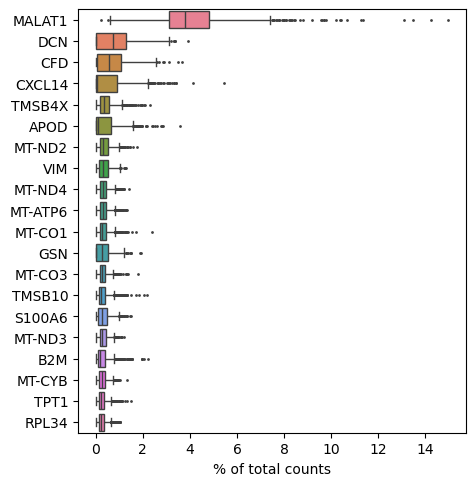

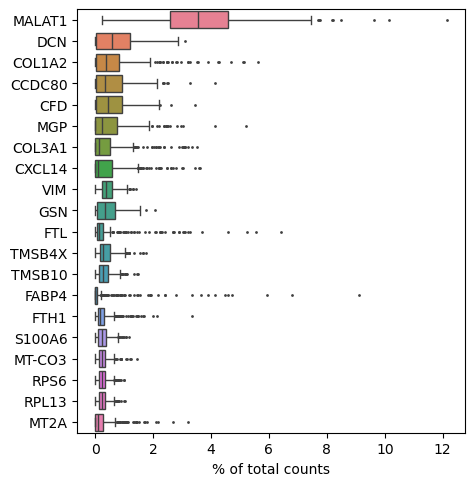

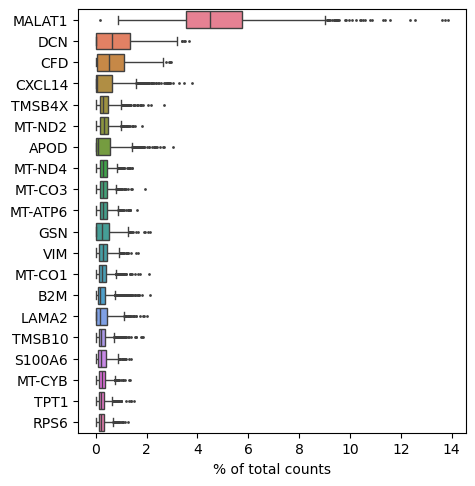

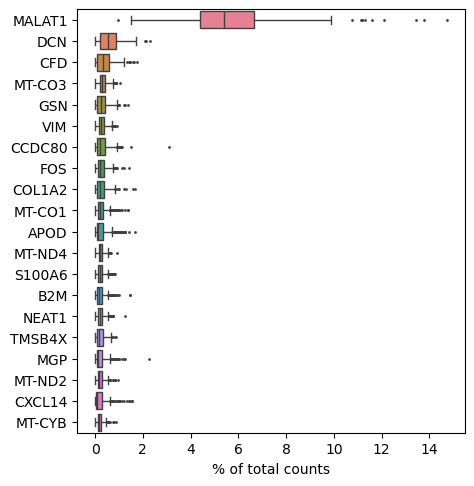

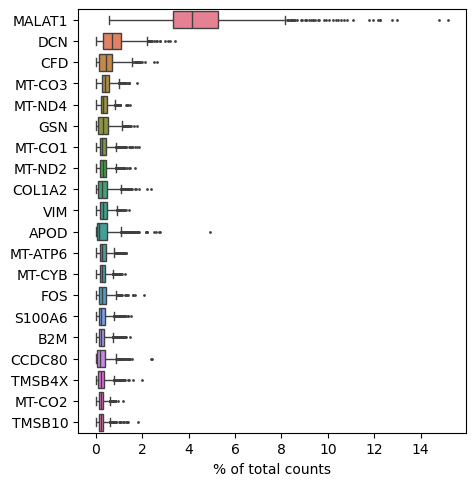

...

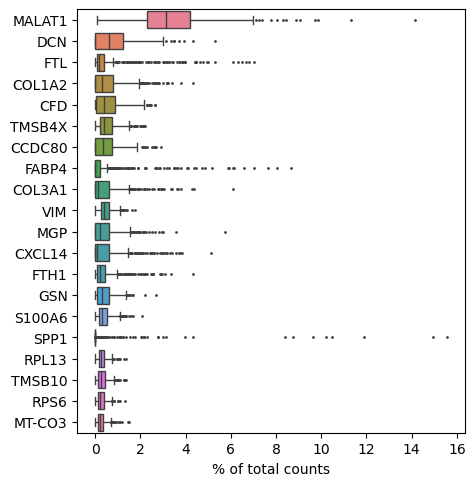

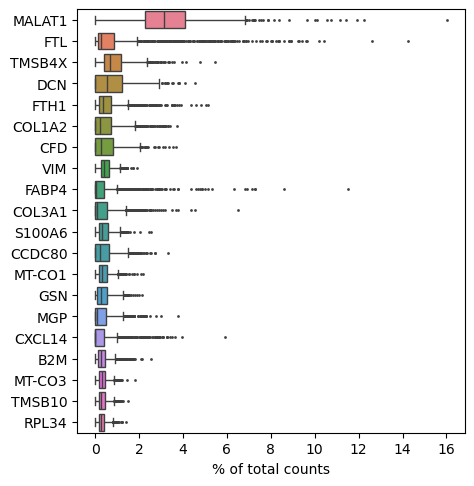

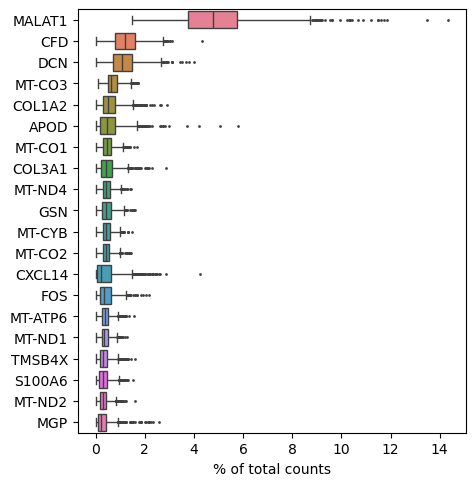

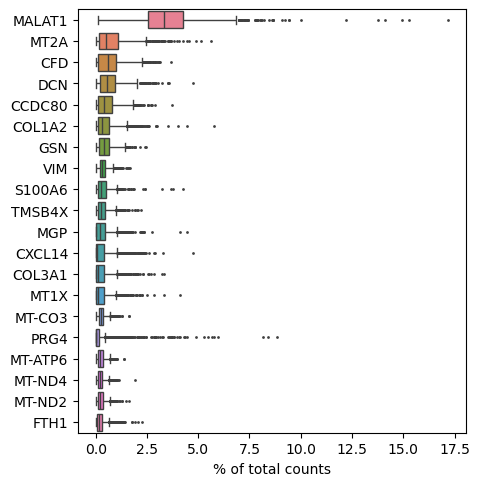

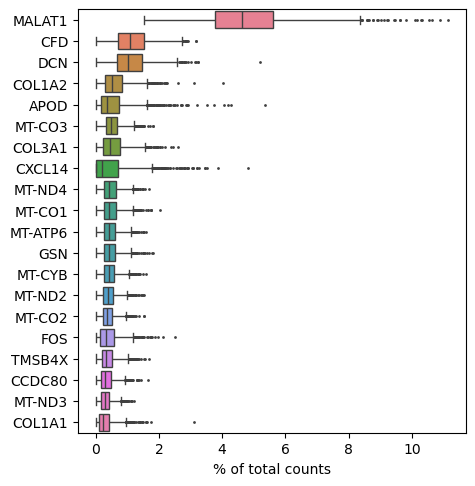

In [18]:
for key in sc_adatas:
    sc.pl.highest_expr_genes(
        sc_adatas[key],
        n_top=20,
    )

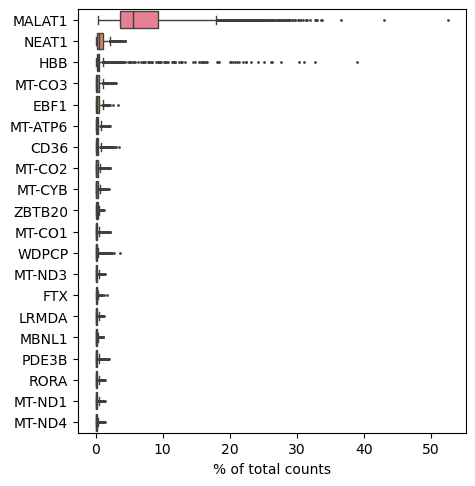

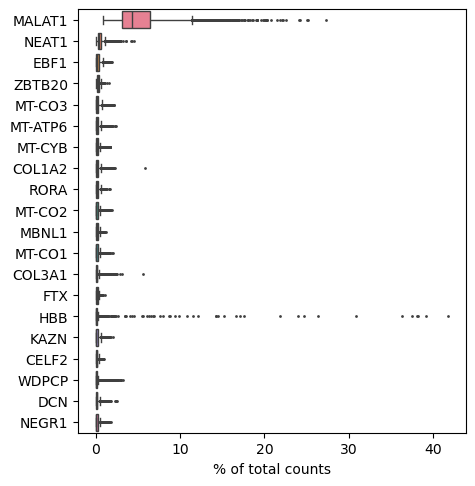

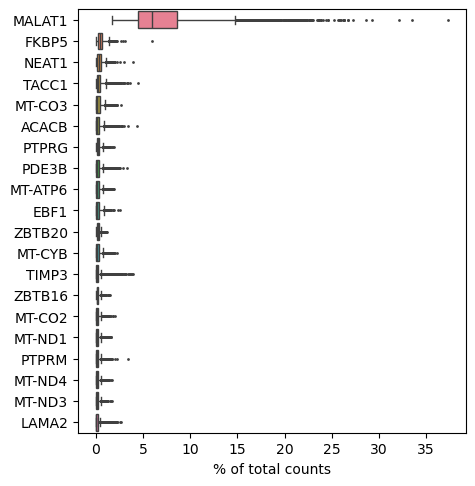

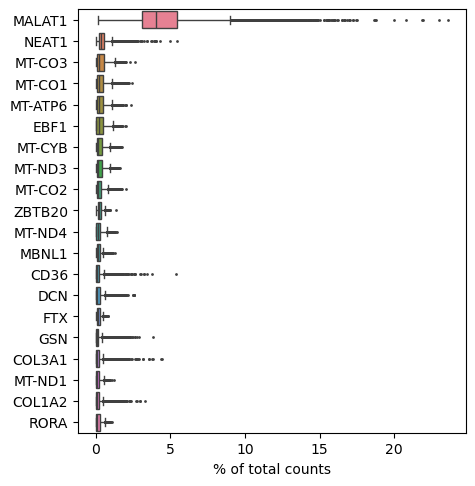

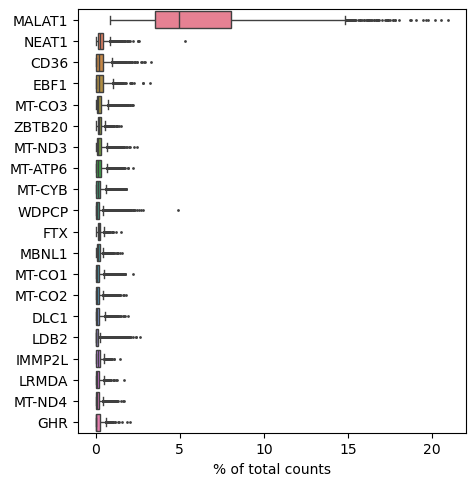

...

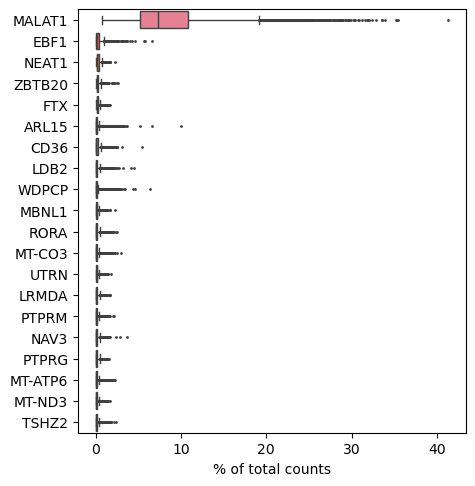

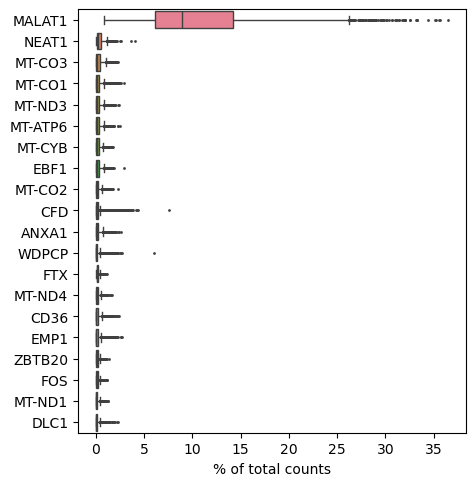

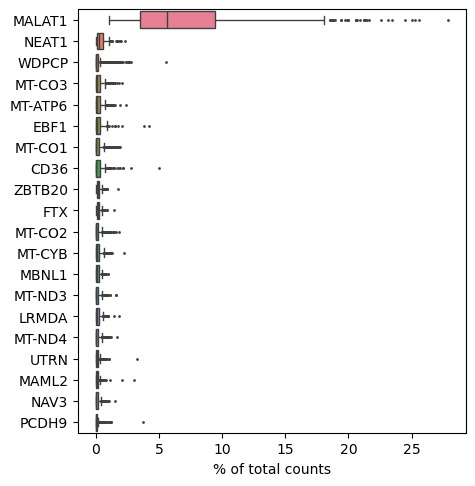

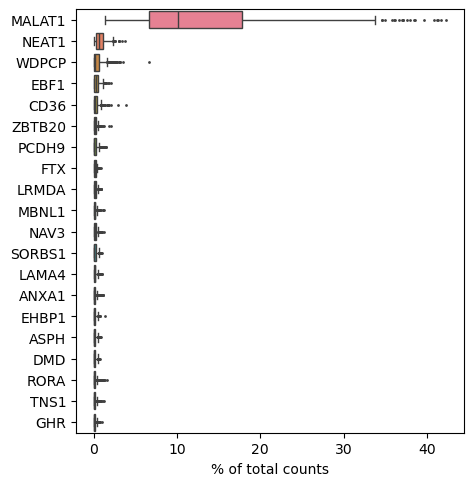

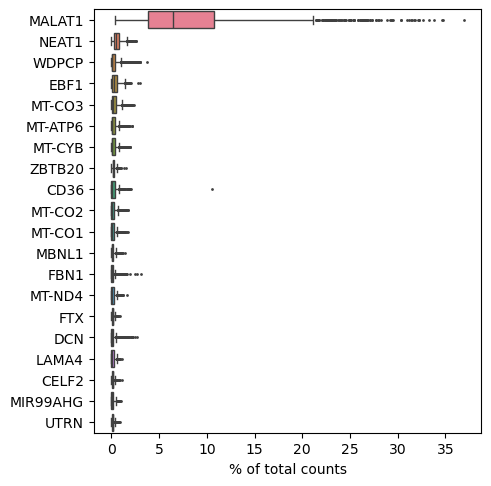

In [19]:
for key in sn_adatas:
    sc.pl.highest_expr_genes(
        sn_adatas[key],
        n_top=20,
    )

In [20]:
# QC, check it is not normalized
for key in sn_adatas:
    print(sn_adatas[key].X.max())
for key in sc_adatas:
    print(sc_adatas[key].X.max())

11089.0
5939.0
13542.0
16528.0
9278.0
5894.0
5522.0
11222.0
11374.0
10936.0
15451.0
11064.0
6631.0
921.0
1574.0
2786.0
1138.0
619.0
1753.0
2356.0
395.0
2607.0
2250.0
523.0
577.0
3397.0
894.0
1632.0
832.0
1342.0
1759.0
2279.0
1612.0
1423.0
752.0
2711.0
1291.0
784.0
396.0
947.0
1348.0
1541.0
871.0
970.0
1060.0
2527.0
374.0
2048.0
591.0


We'll remove genes with high mitochondrial content

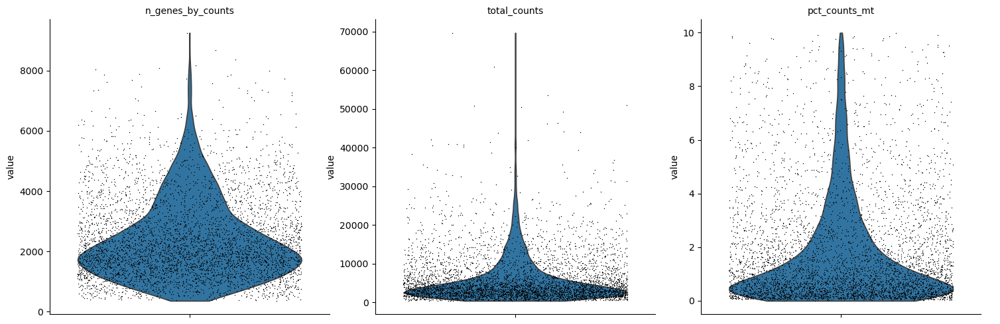

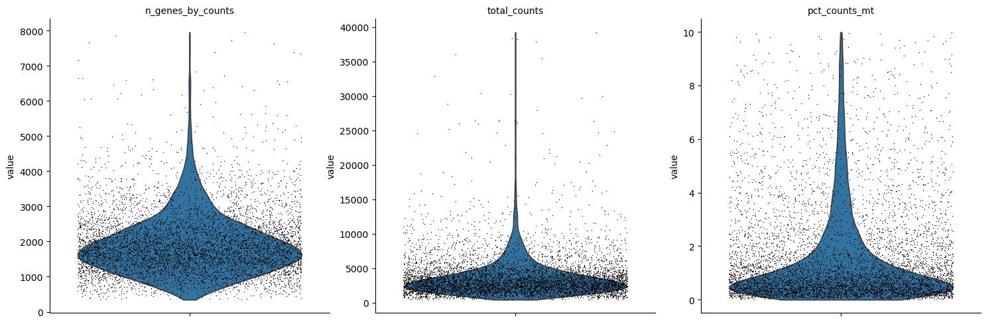

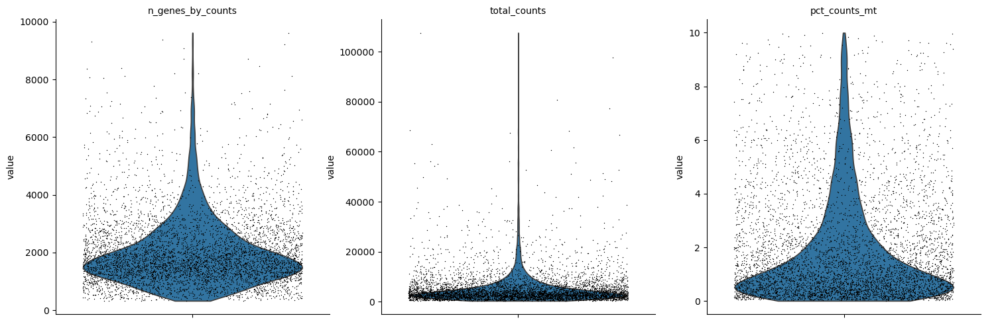

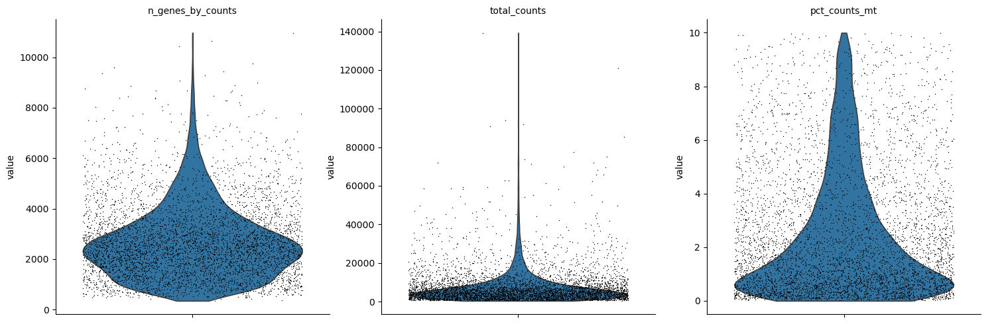

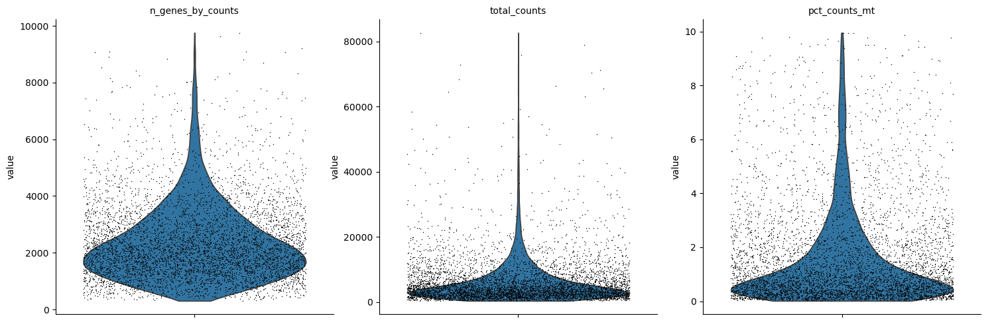

...

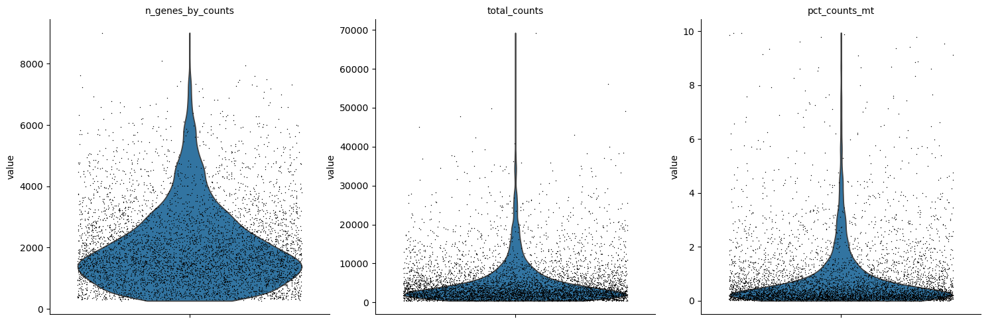

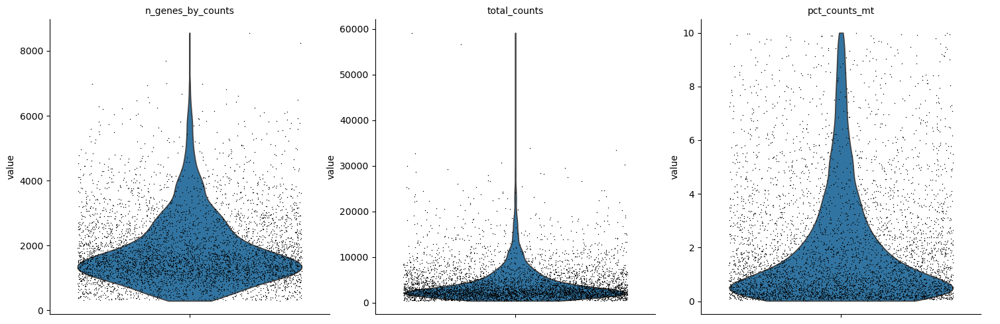

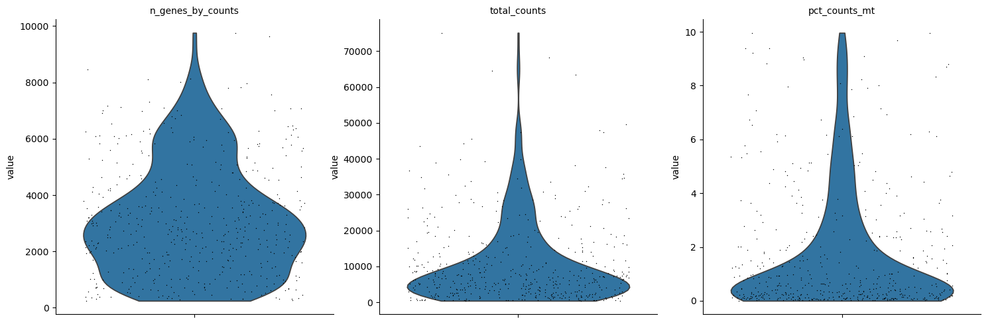

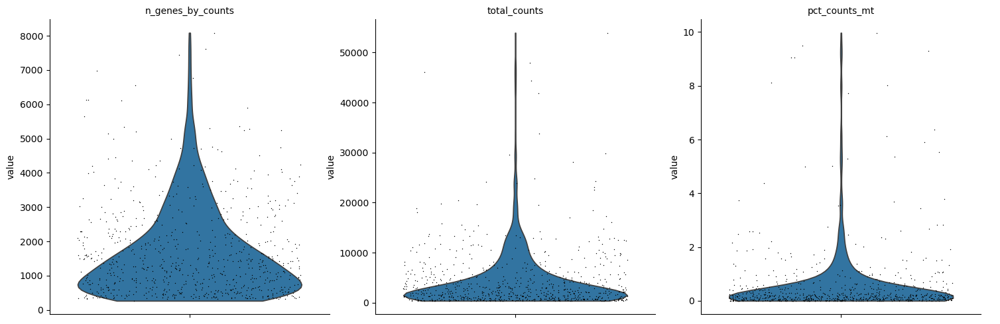

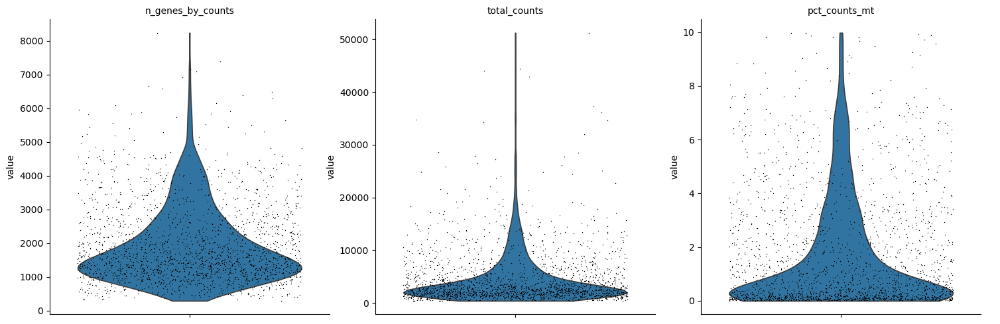

In [21]:
for key in sn_adatas:
    # First calculating them
    sn_adatas[key].var["mt"] = sn_adatas[key].var_names.str.startswith(
        "MT-"
    )  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(
        sn_adatas[key], qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
    )
    sc.pl.violin(
        sn_adatas[key],
        ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
        jitter=0.4,
        multi_panel=True,
    )

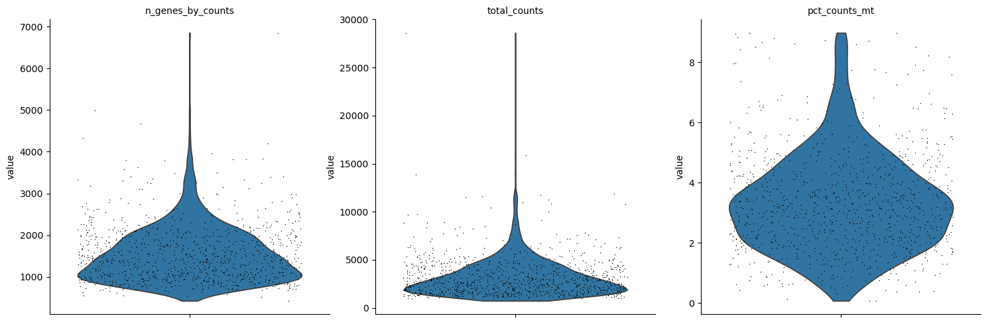

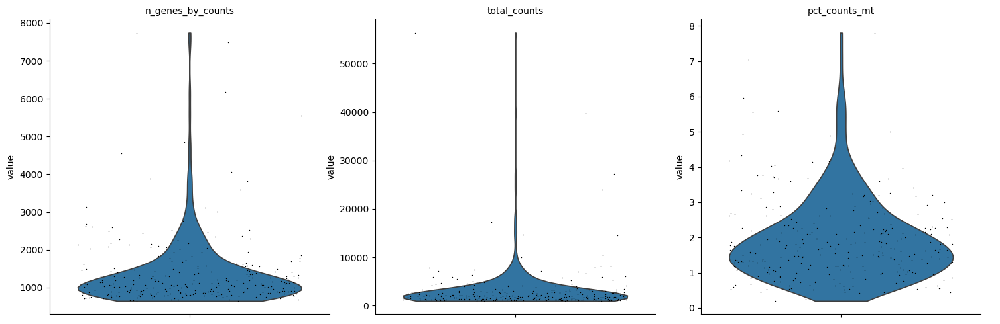

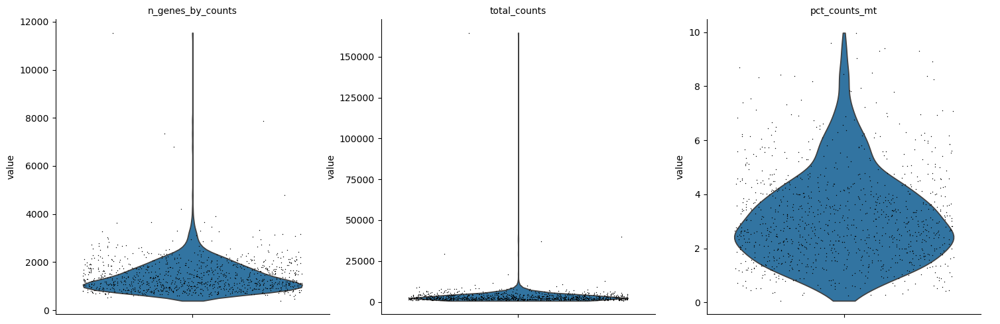

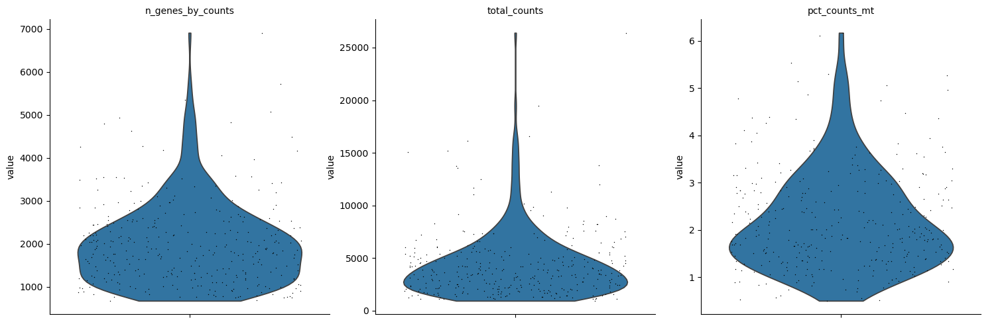

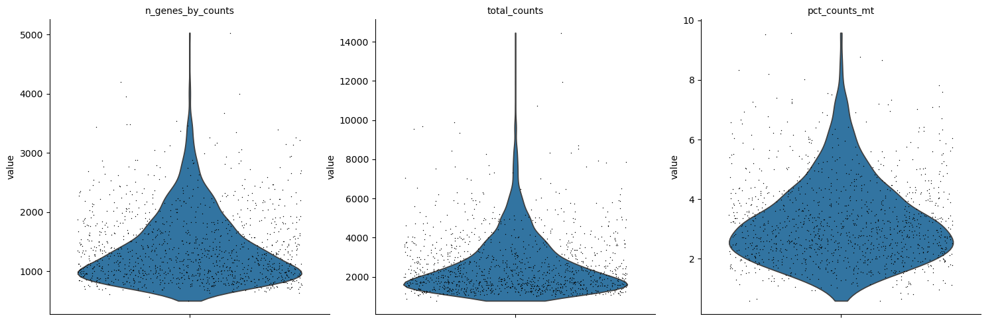

...

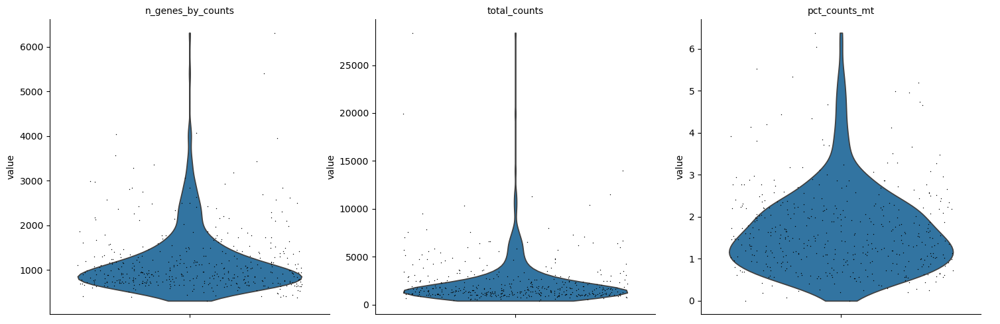

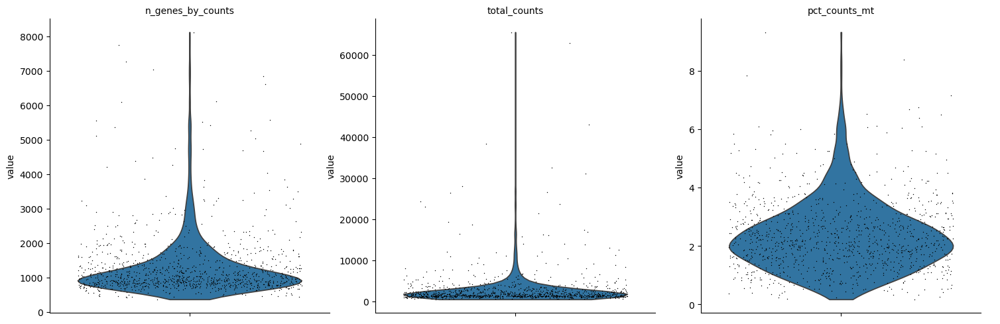

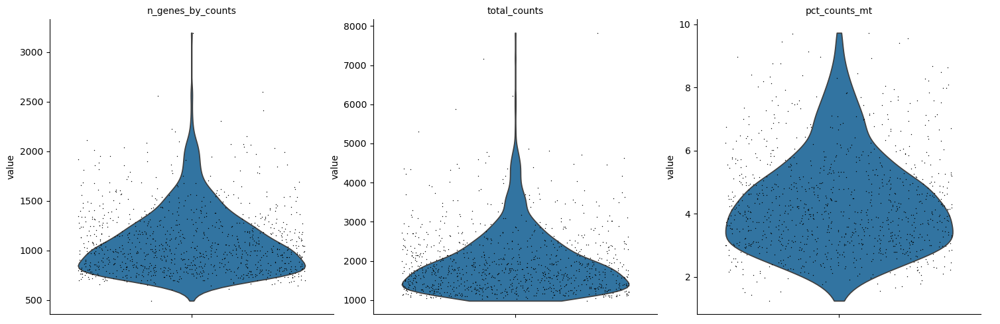

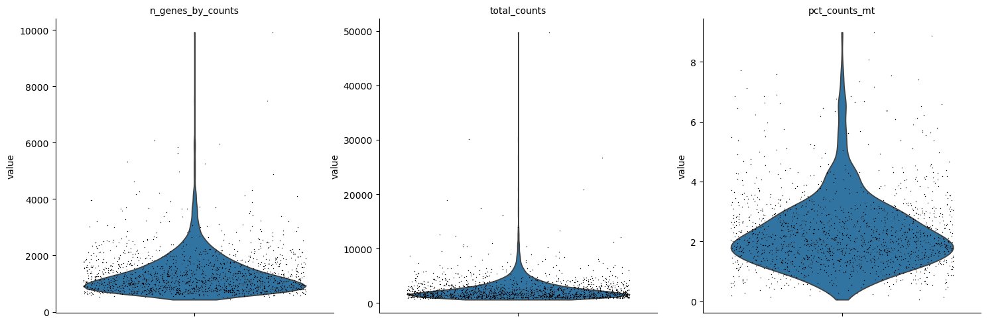

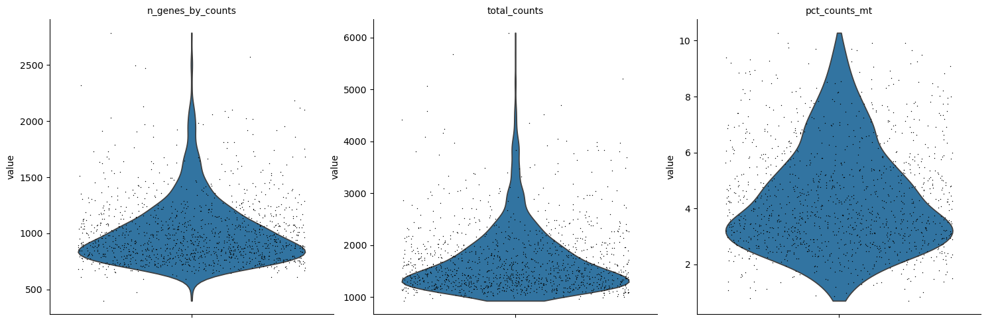

In [22]:
for key in sc_adatas:
    # First calculating them
    sc_adatas[key].var["mt"] = sc_adatas[key].var_names.str.startswith(
        "MT-"
    )  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(
        sc_adatas[key], qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
    )
    sc.pl.violin(
        sc_adatas[key],
        ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
        jitter=0.4,
        multi_panel=True,
    )

Hs_SAT_12-1


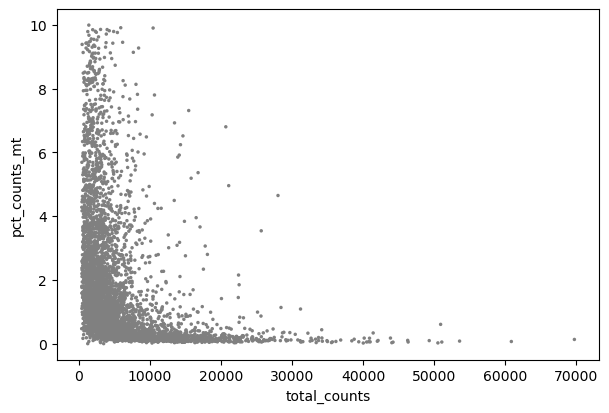

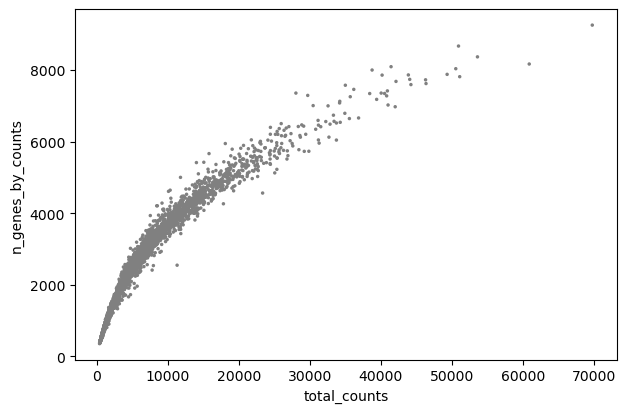

Hs_SAT_13-1


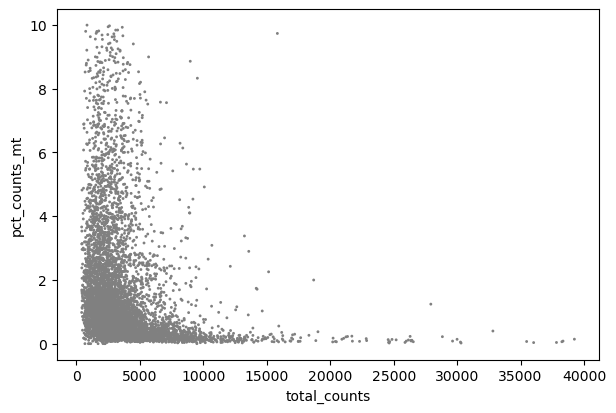

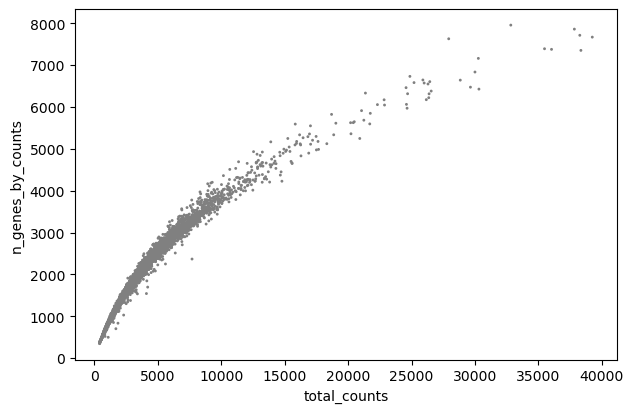

Hs_SAT_266-1


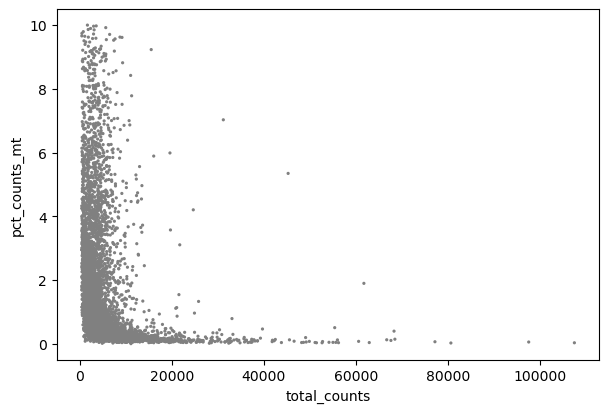

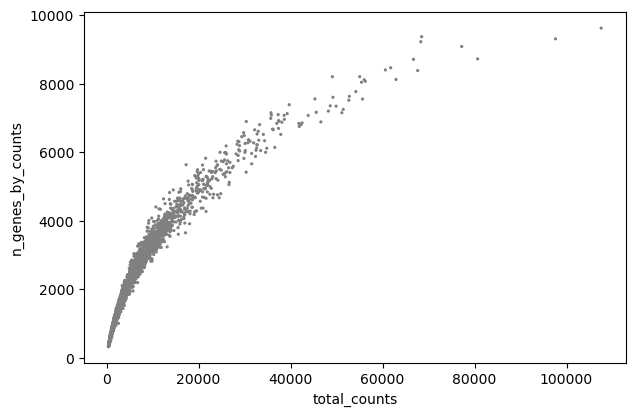

Hs_SAT_01-1


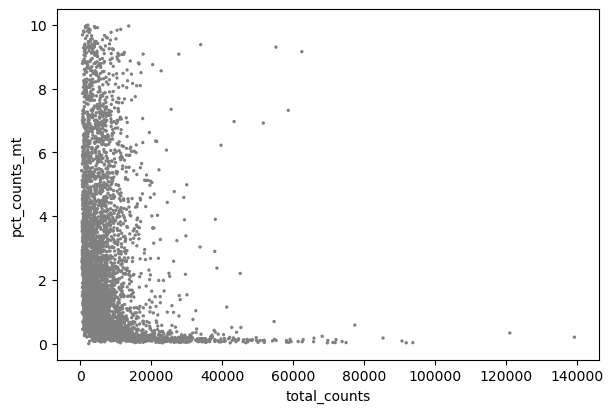

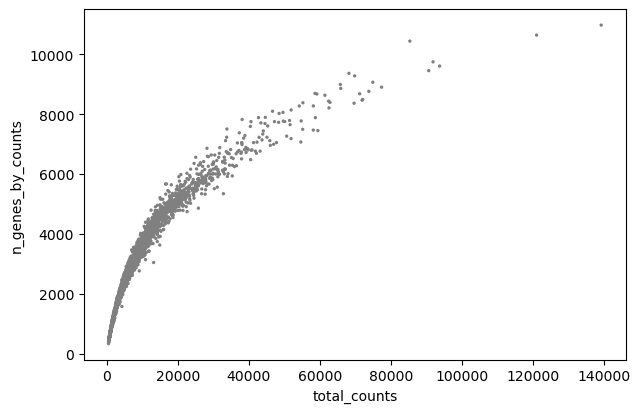

Hs_SAT_02-1


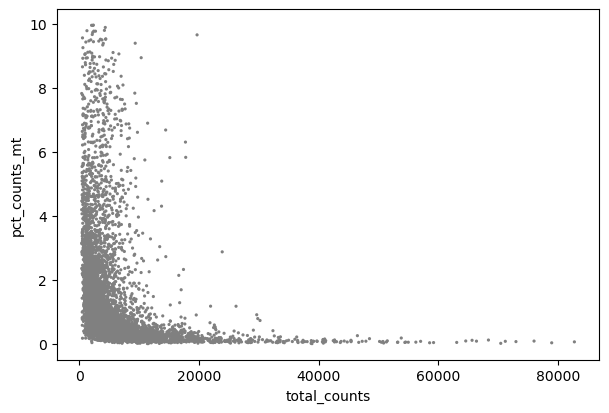

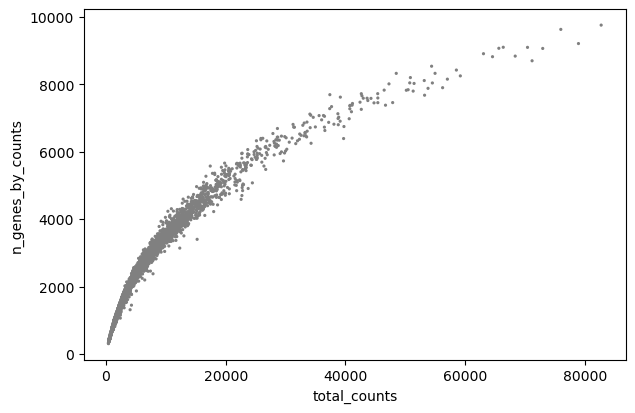

Hs_SAT_04-1


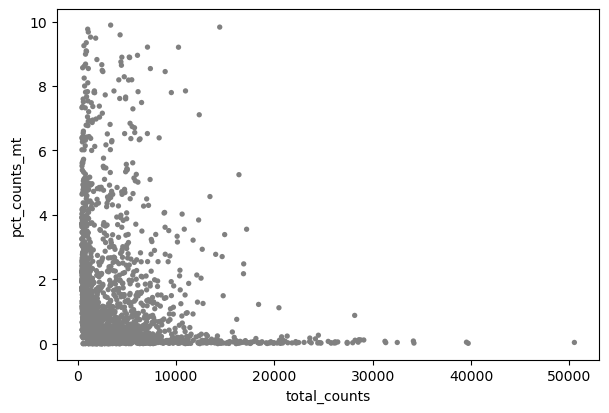

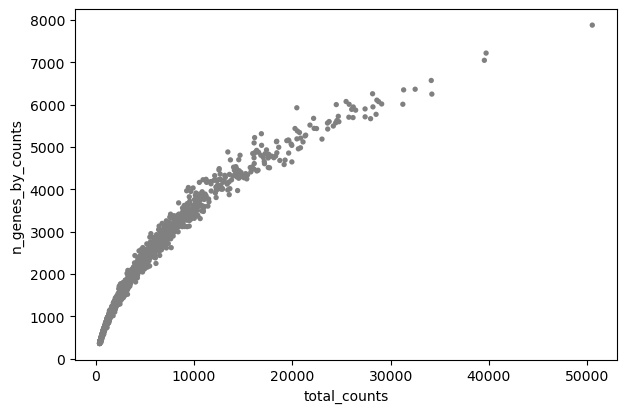

Hs_SAT_253-1


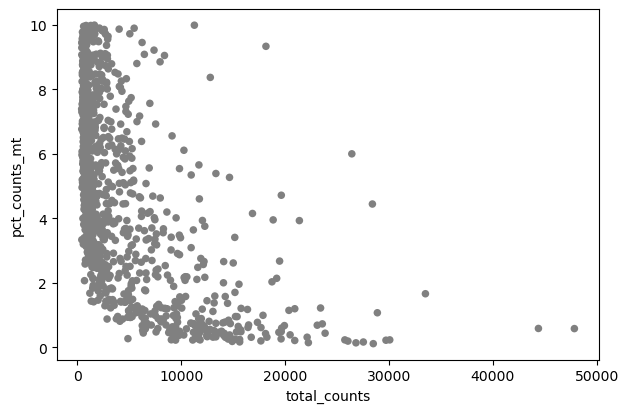

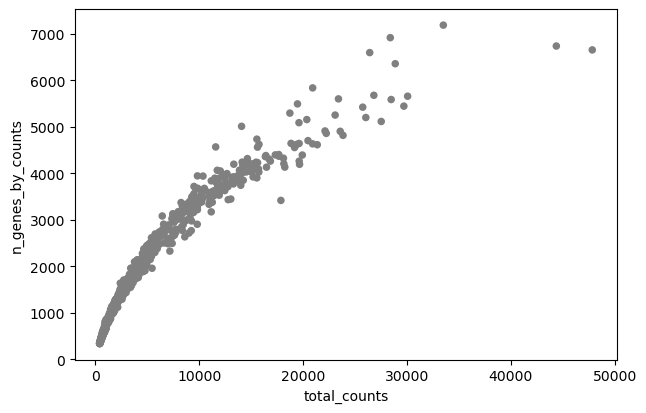

Hs_SAT_254-1


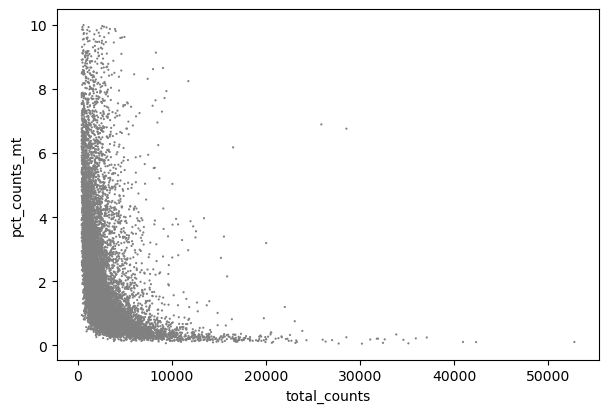

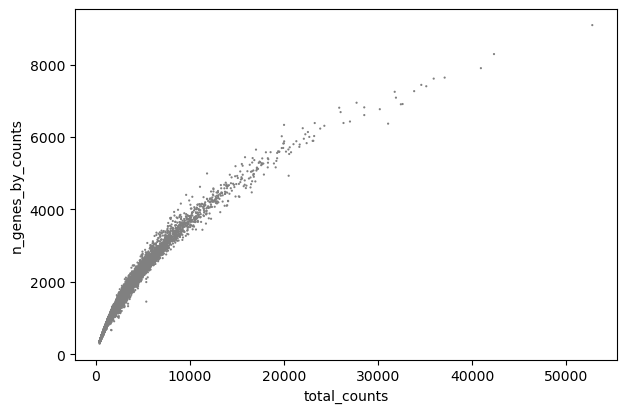

Hs_SAT_256-1


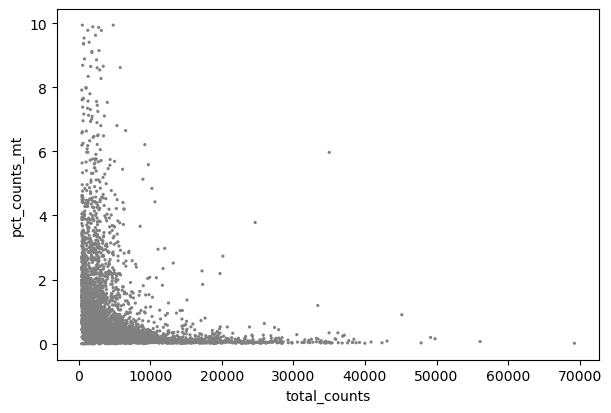

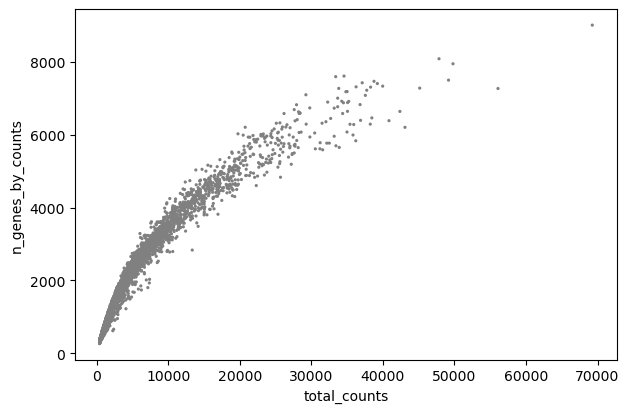

Hs_SAT_255-1


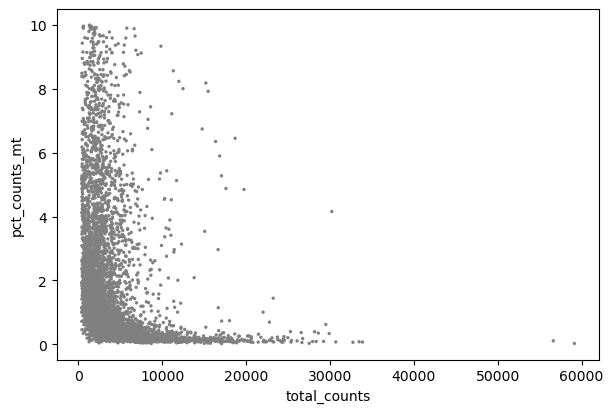

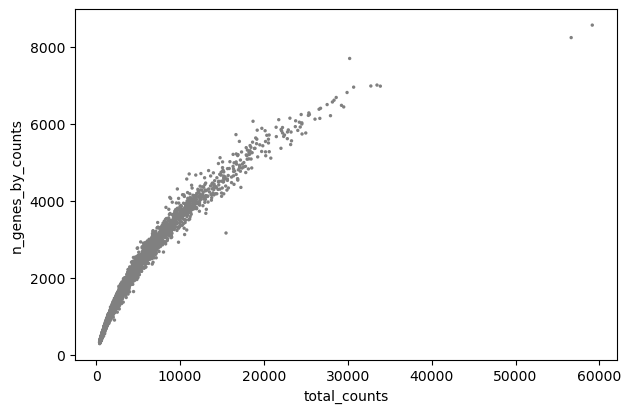

Hs_SAT_09-1


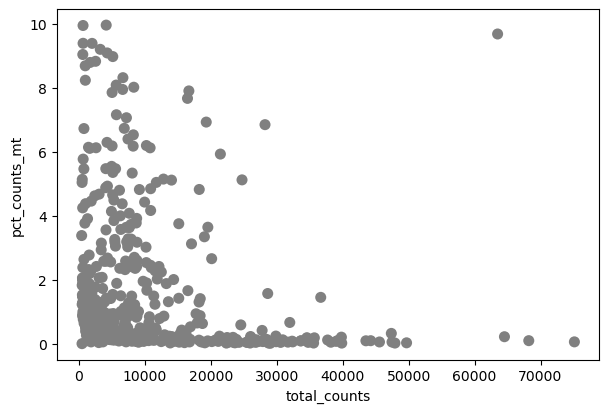

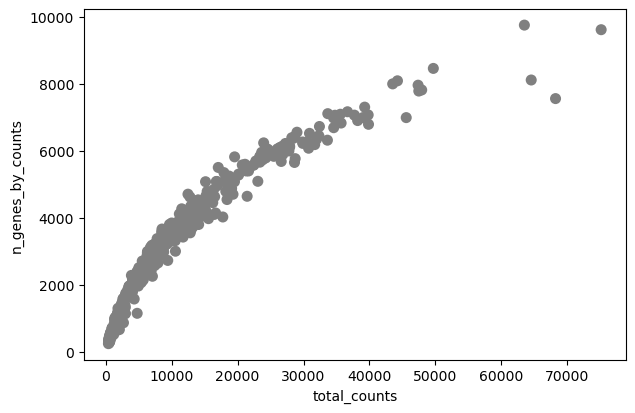

Hs_SAT_10-1


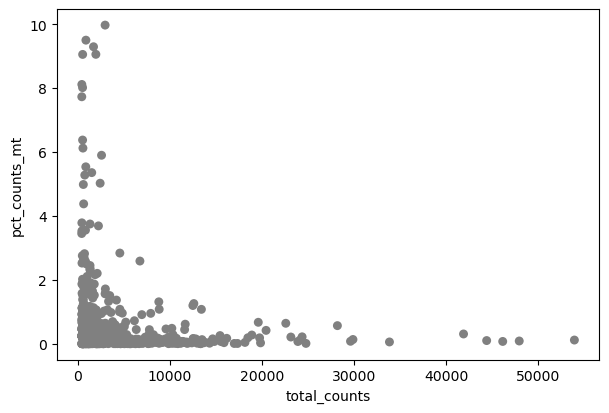

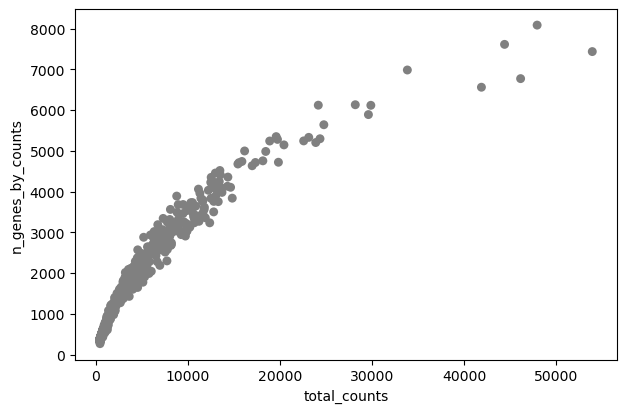

Hs_SAT_11-1


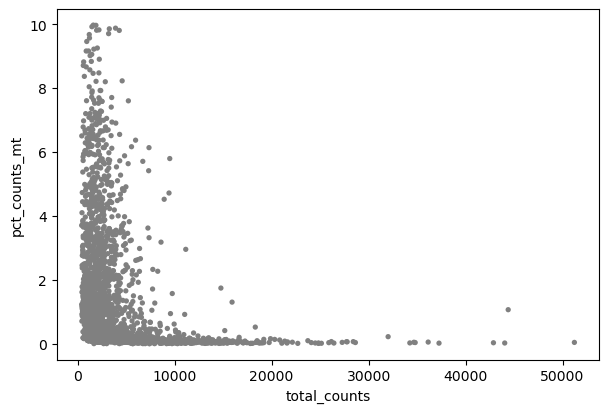

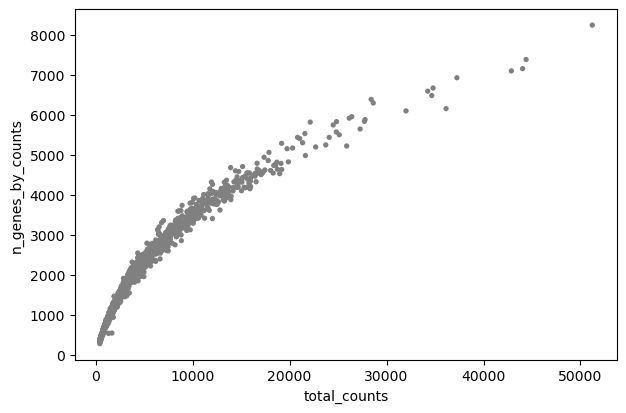

Hs_SAT_SVF_238-2A-1


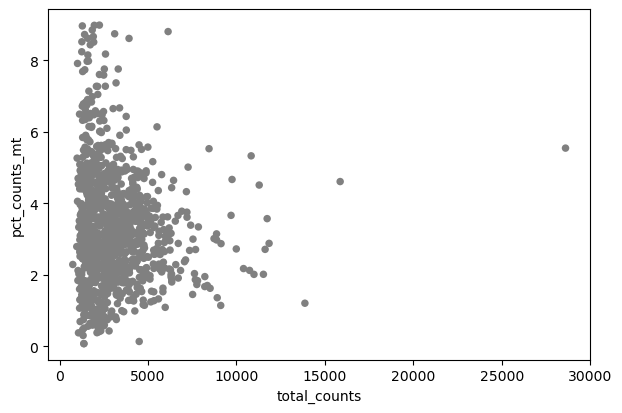

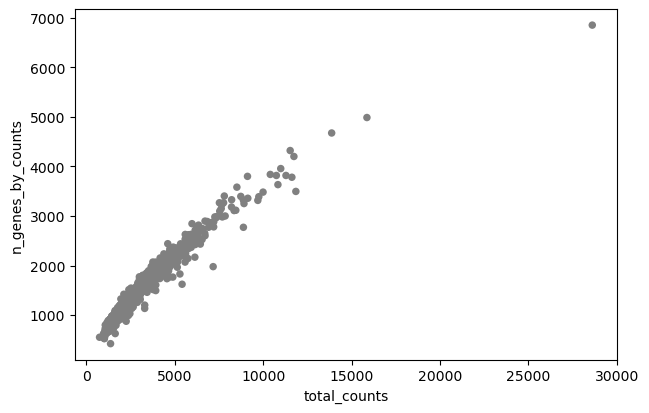

Hs_SAT_SVF_239-3B-1


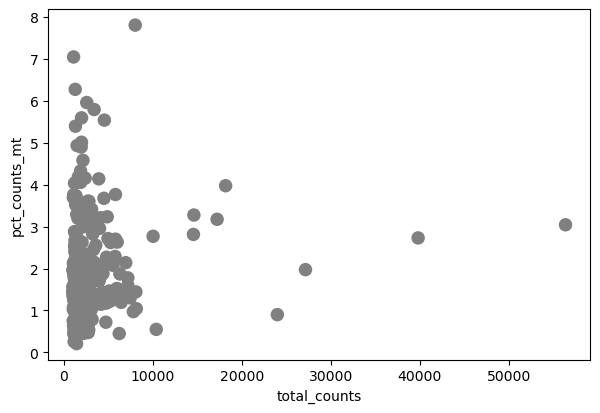

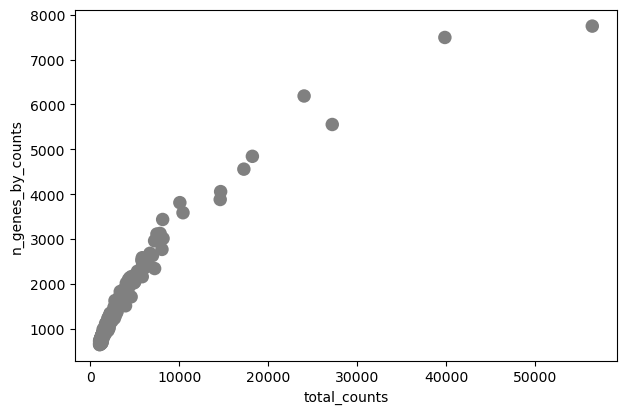

Hs_SAT_SVF_238-1B-1


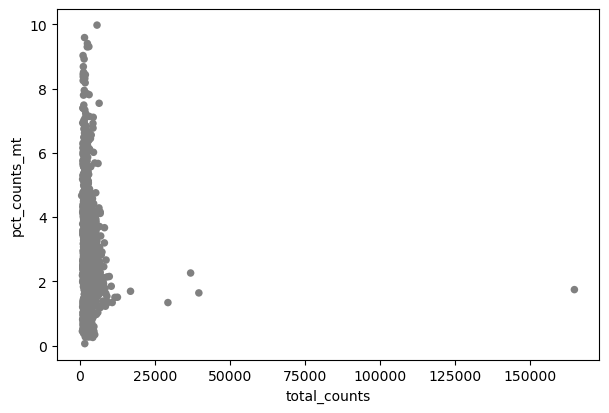

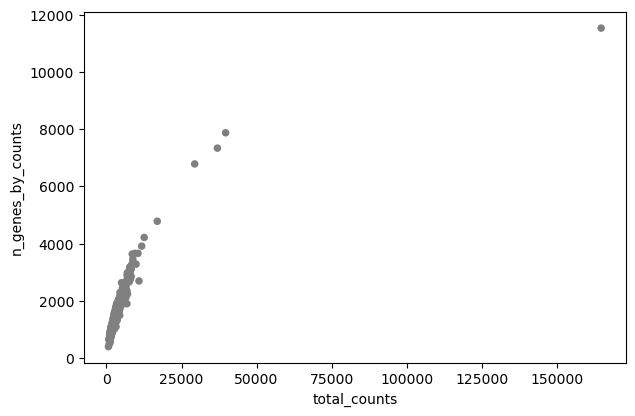

Hs_SAT_SVF_235-1A-2


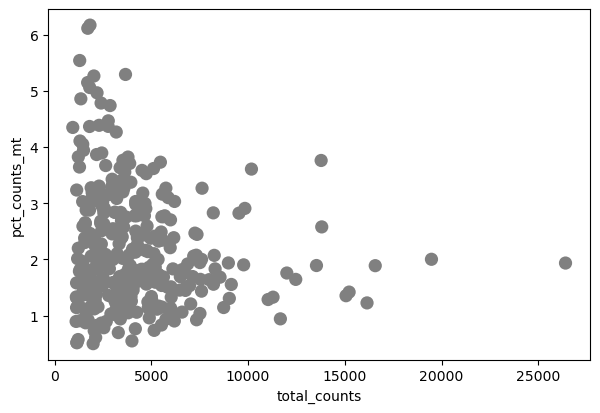

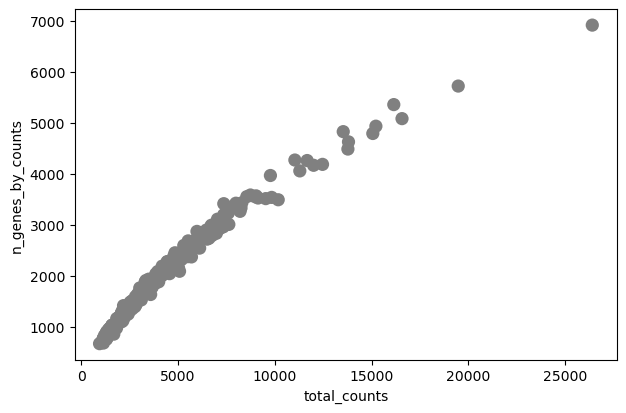

Hs_SAT_SVF_235-2B-2


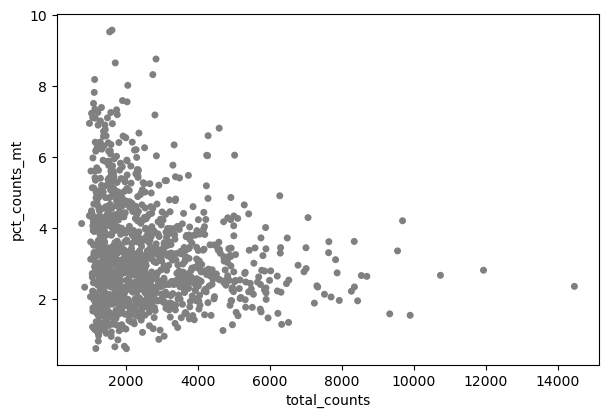

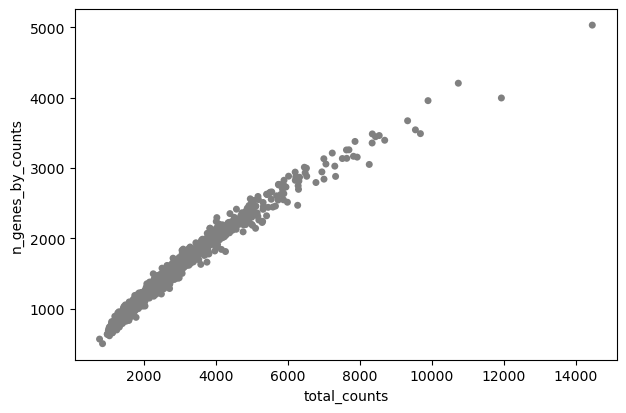

Hs_SAT_SVF_235-2B-1


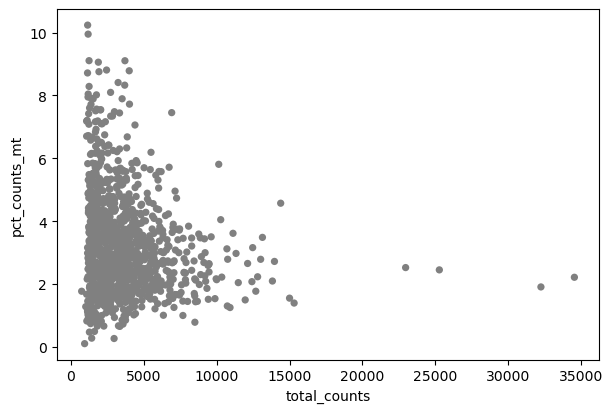

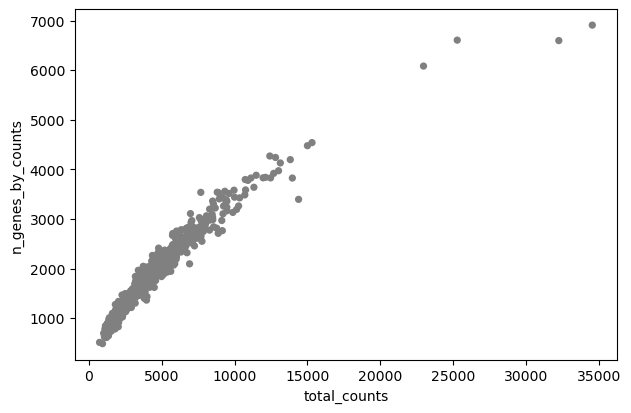

Hs_SAT_SVF_239-1B-2


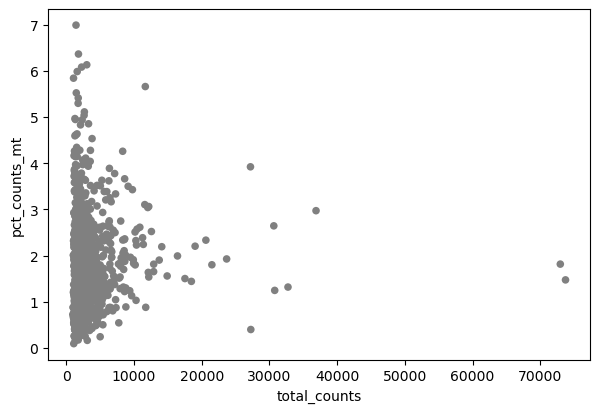

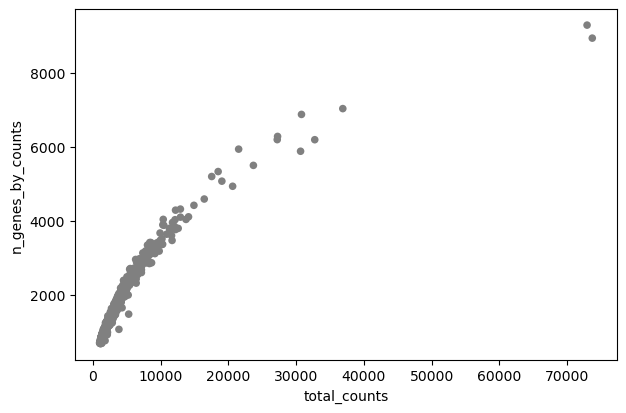

Hs_SAT_SVF_248-2A-1


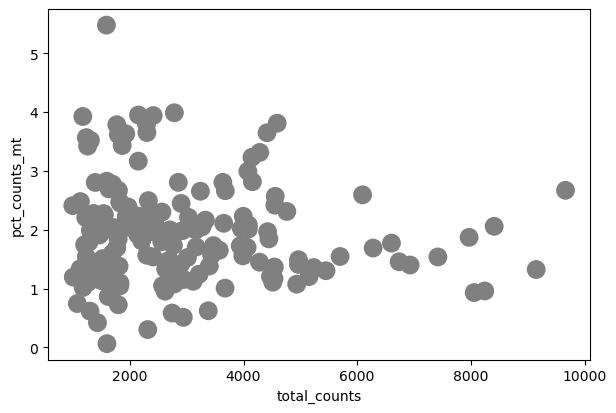

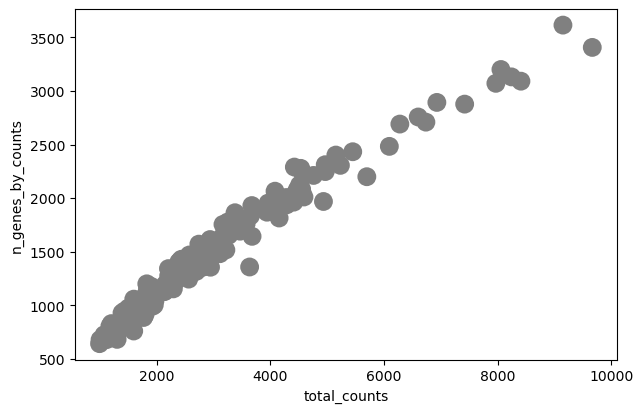

Hs_SAT_SVF_237-1A-1


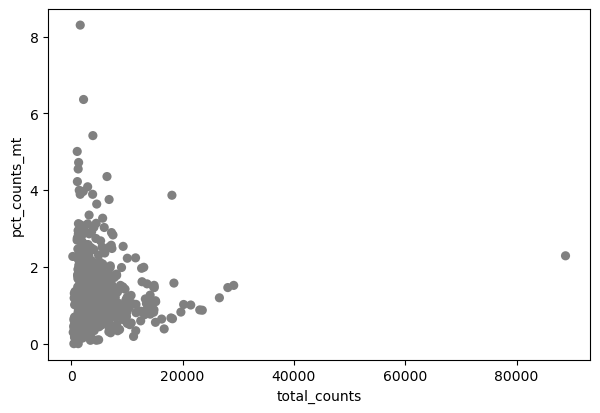

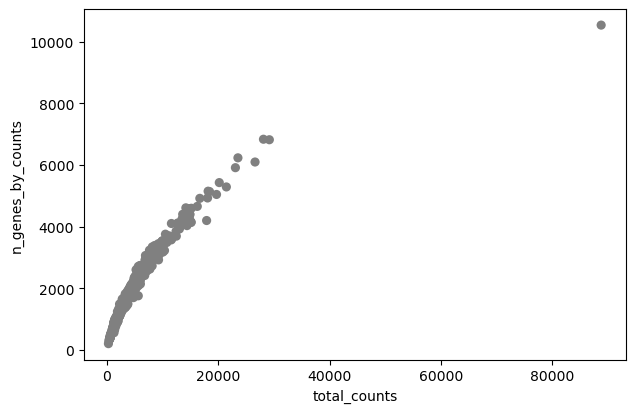

Hs_SAT_SVF_242-2B-1


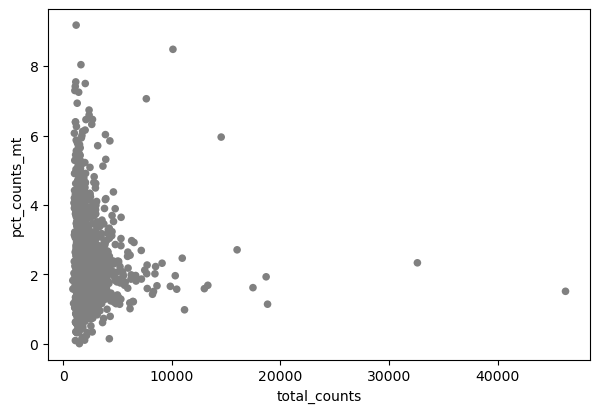

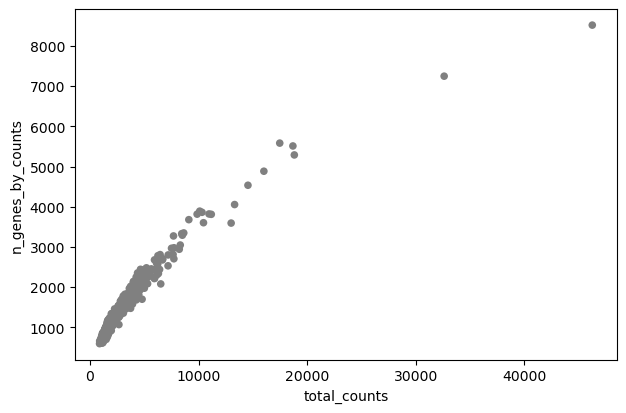

Hs_SAT_SVF_236-1A-1


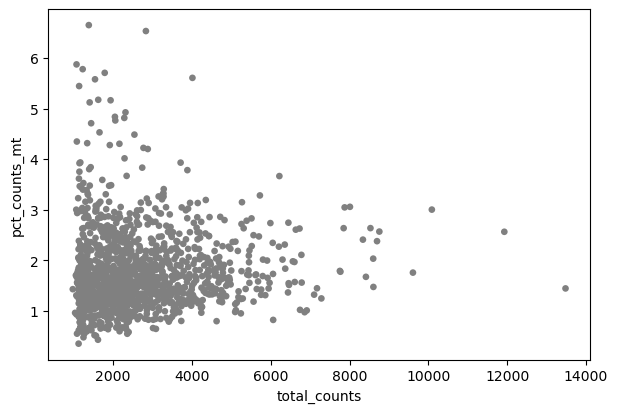

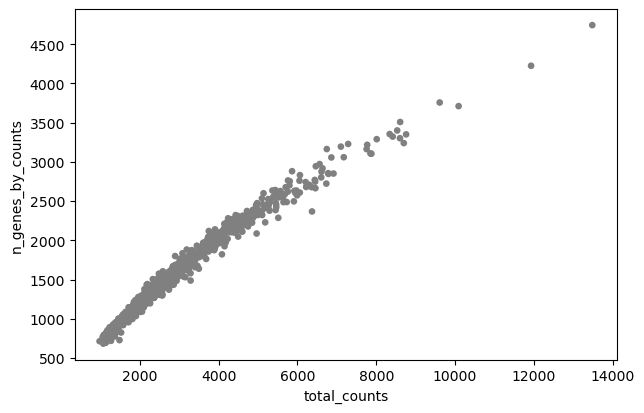

Hs_SAT_SVF_235-1B-1


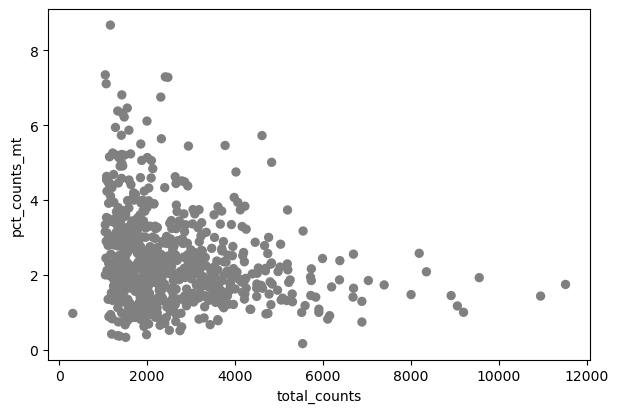

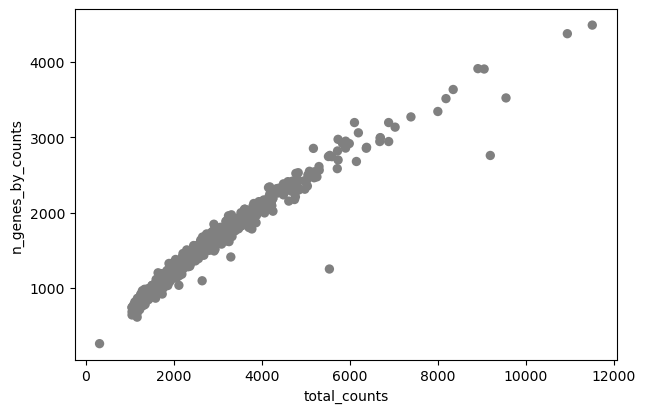

Hs_SAT_SVF_235-1B-2


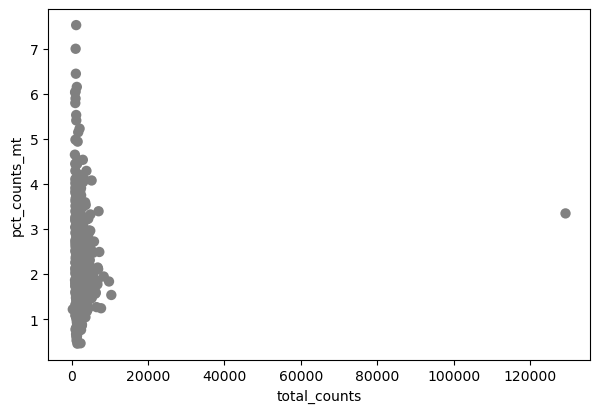

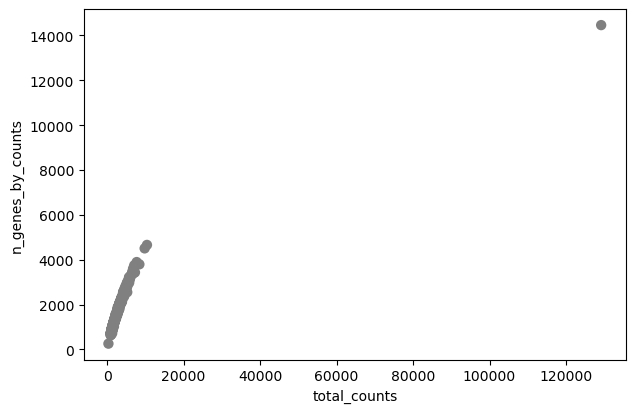

Hs_SAT_SVF_249-2A-1


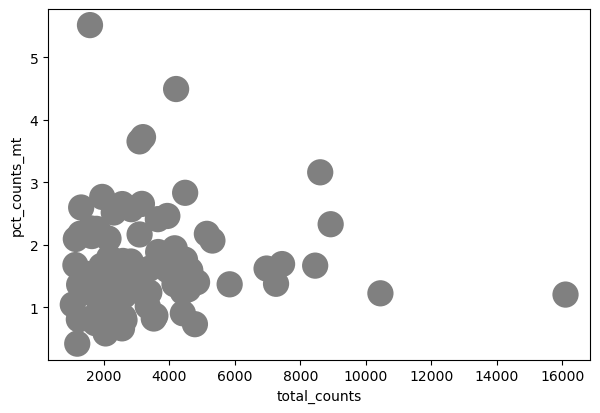

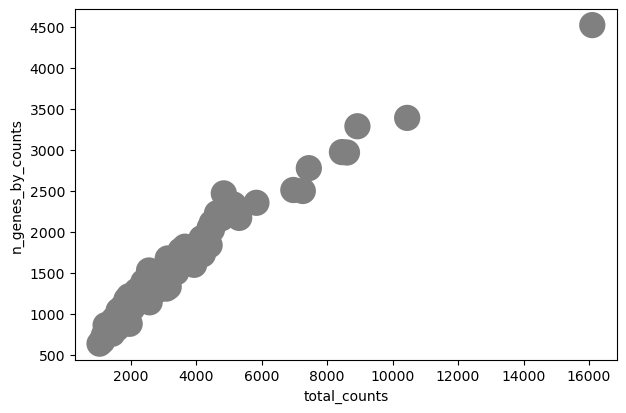

Hs_SAT_SVF_242-3A-1


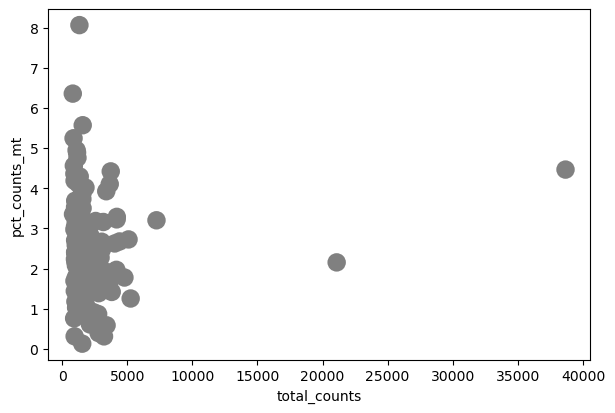

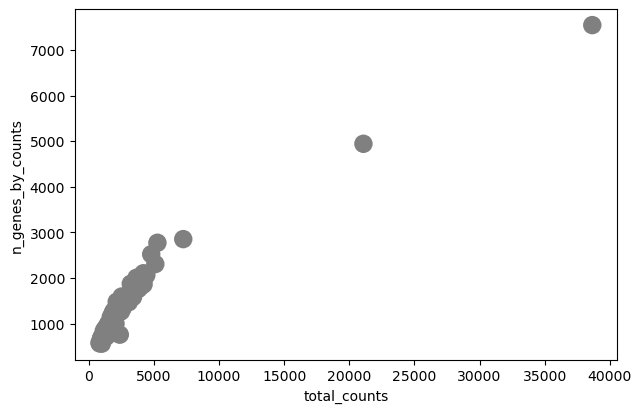

Hs_SAT_SVF_249-1B-1


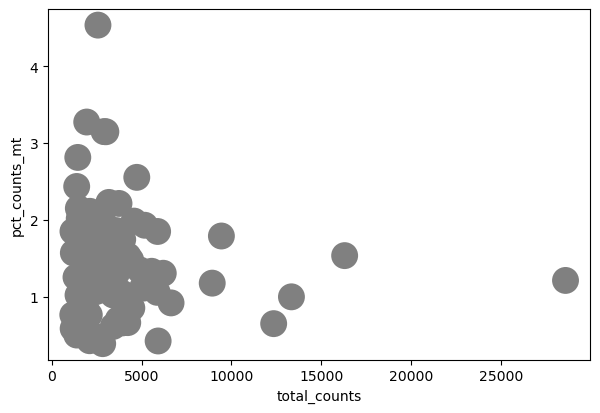

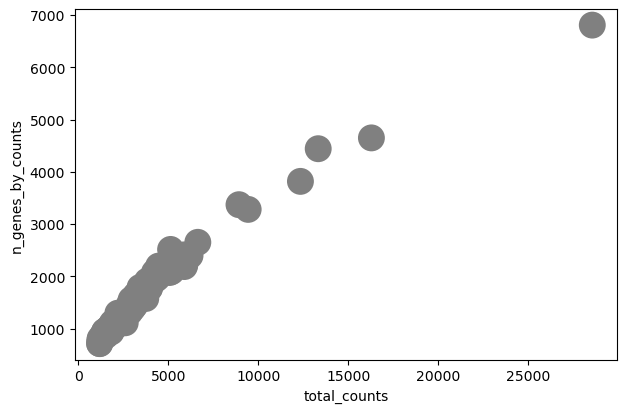

Hs_SAT_SVF_239-1A-1


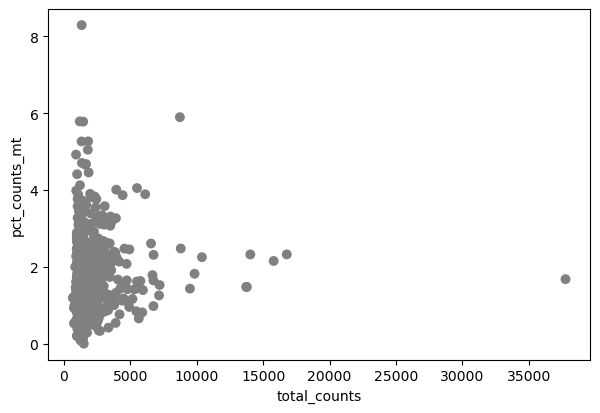

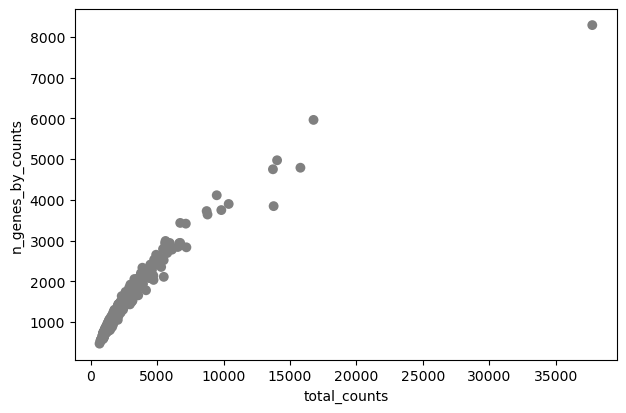

Hs_SAT_SVF_239-3A-1


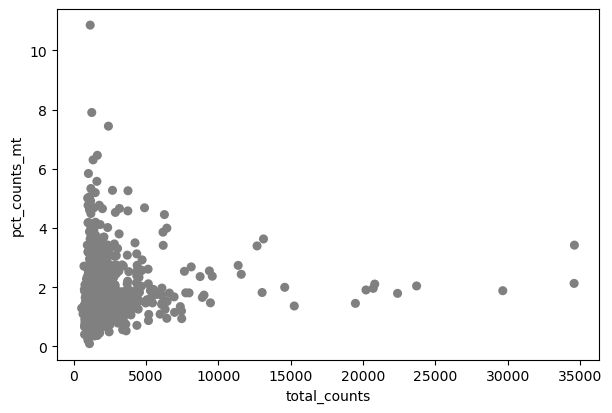

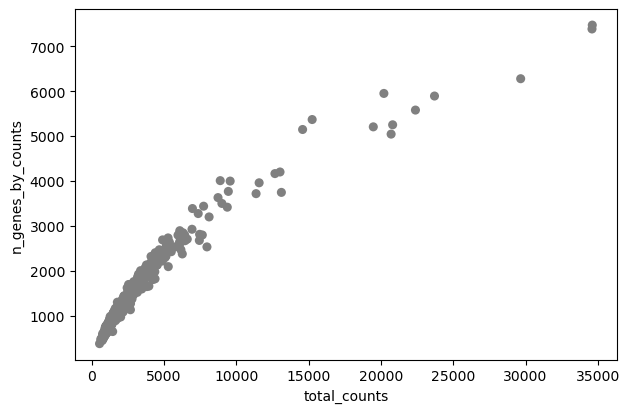

Hs_SAT_SVF_237-2A-1


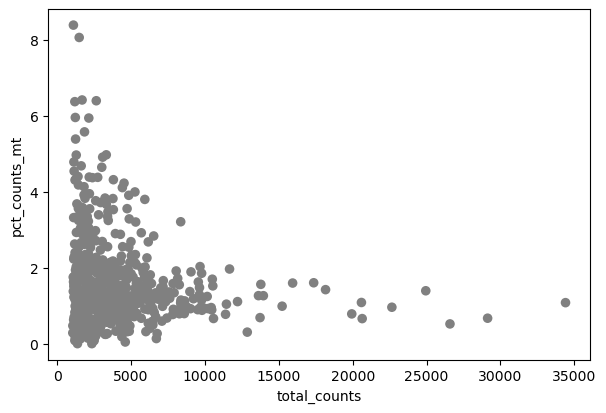

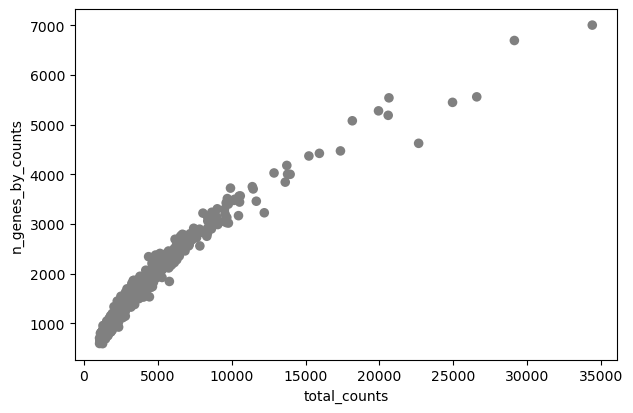

Hs_SAT_SVF_238-1A-1


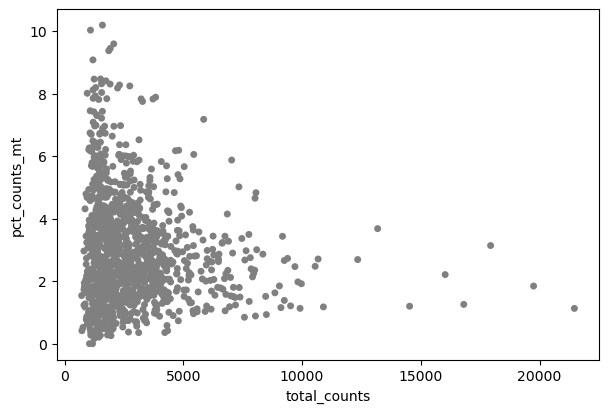

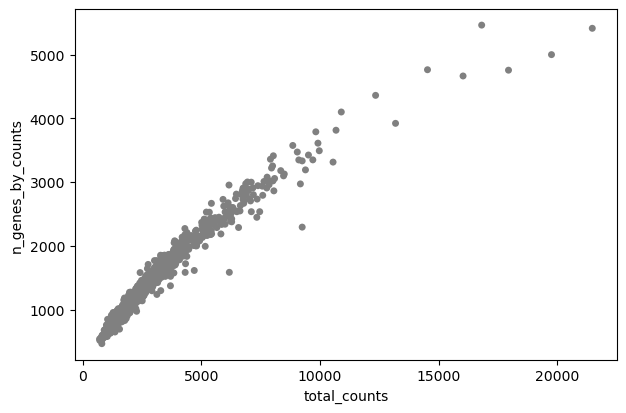

Hs_SAT_SVF_248-1A-1


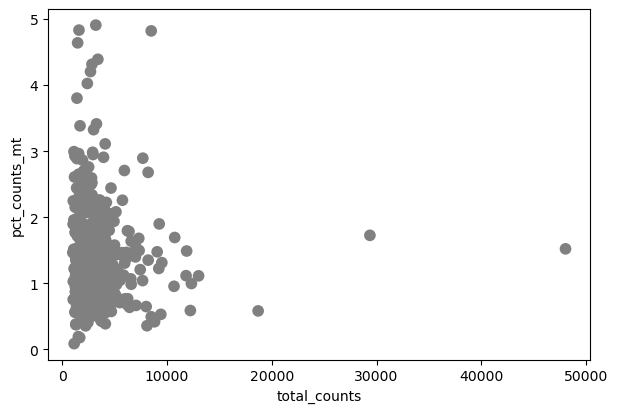

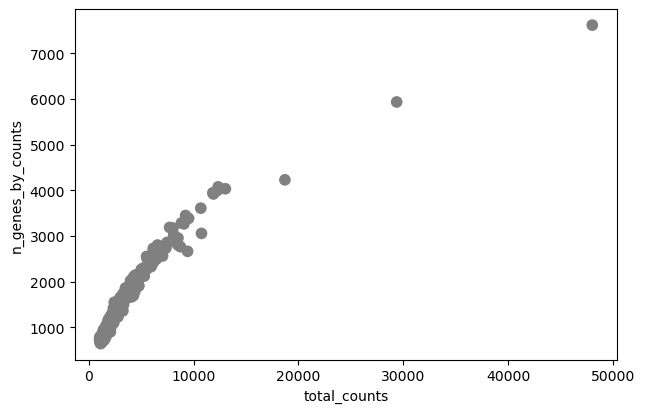

Hs_SAT_SVF_242-1B-1


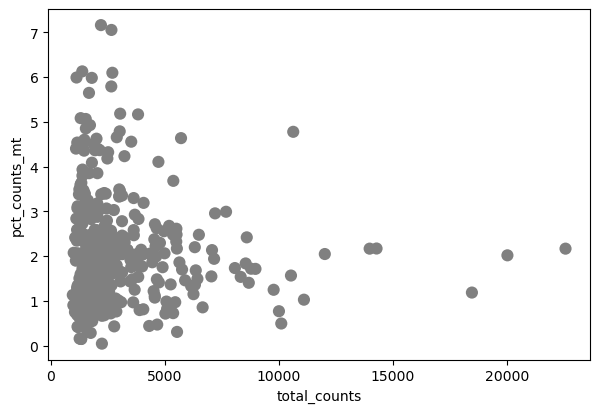

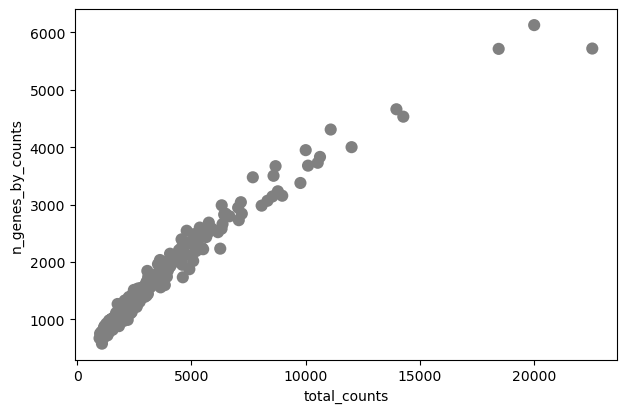

Hs_SAT_SVF_248-1B-1


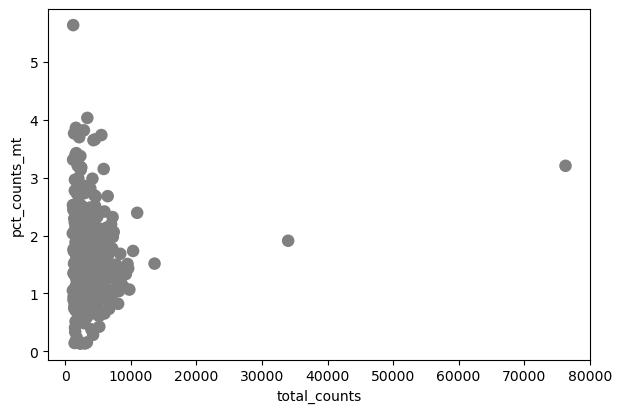

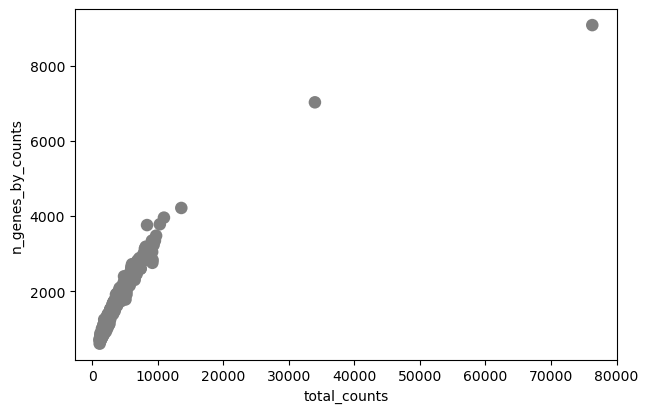

Hs_SAT_SVF_235-2A-1


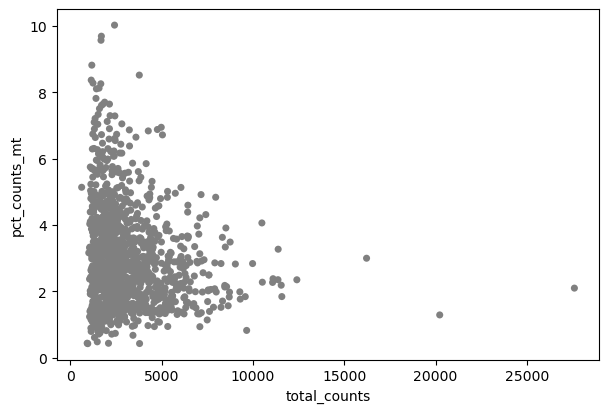

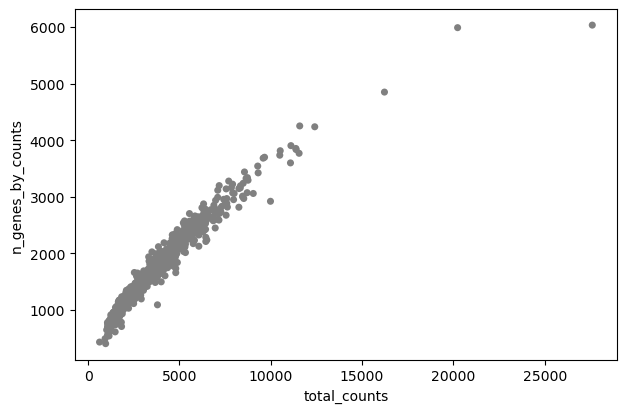

Hs_SAT_SVF_235-2A-2


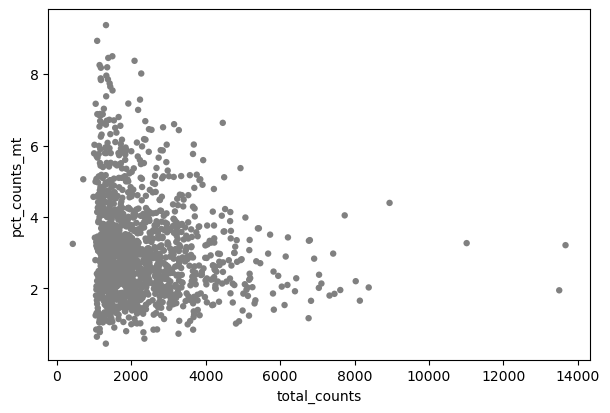

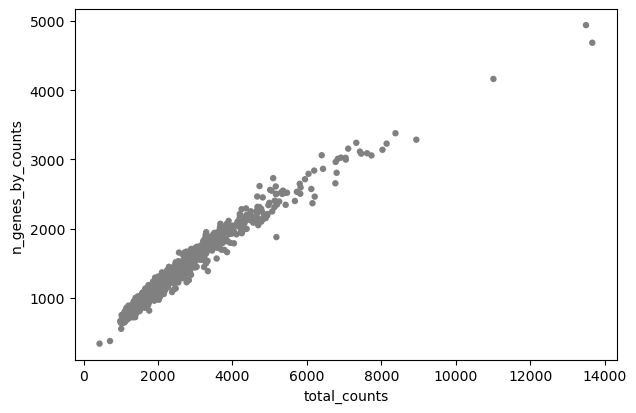

Hs_SAT_SVF_240-1B-1


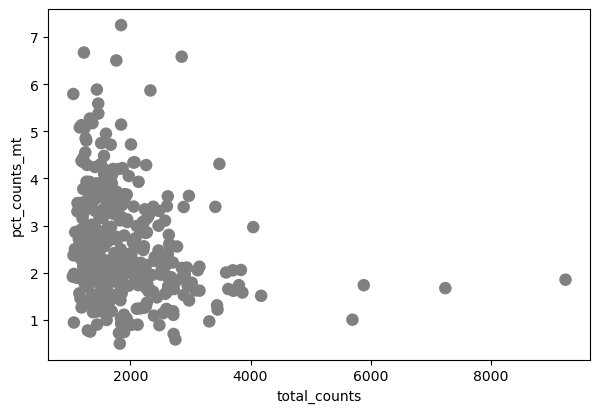

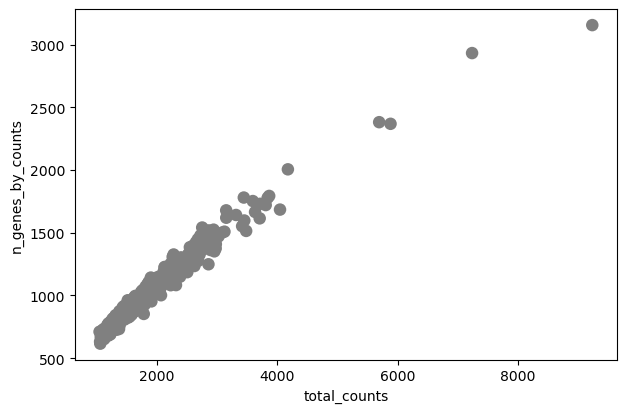

Hs_SAT_SVF_238-2B-1


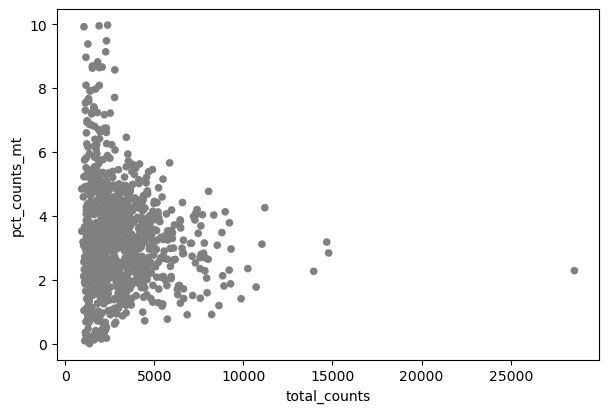

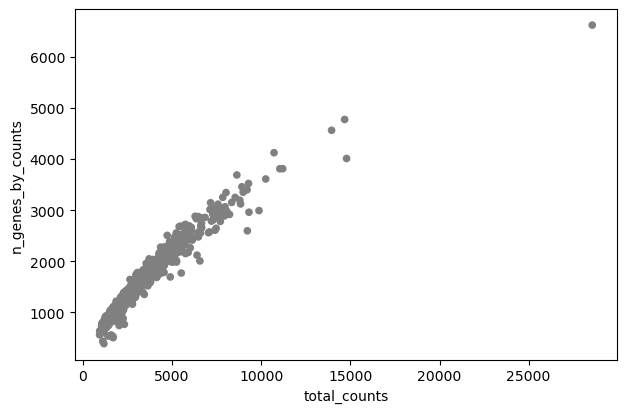

Hs_SAT_SVF_236-1B-1


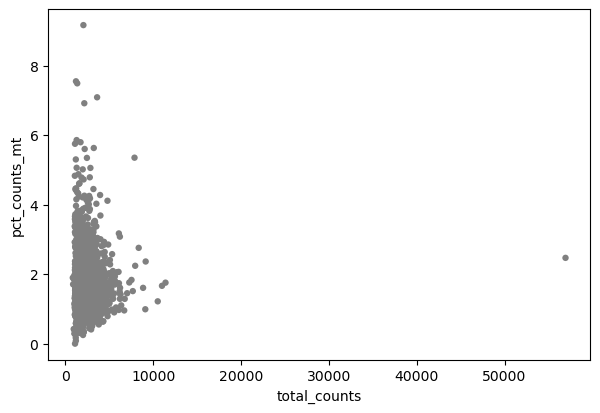

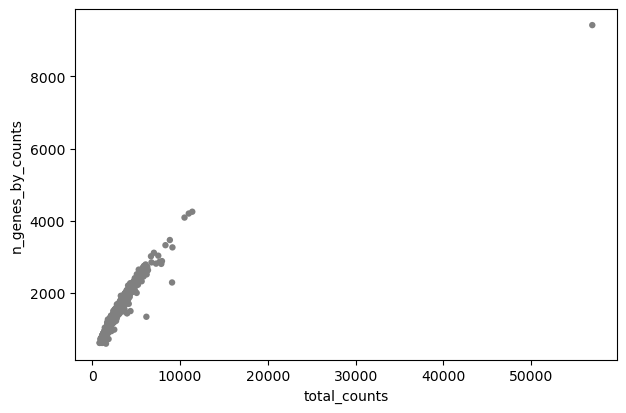

Hs_SAT_SVF_235-1A-1


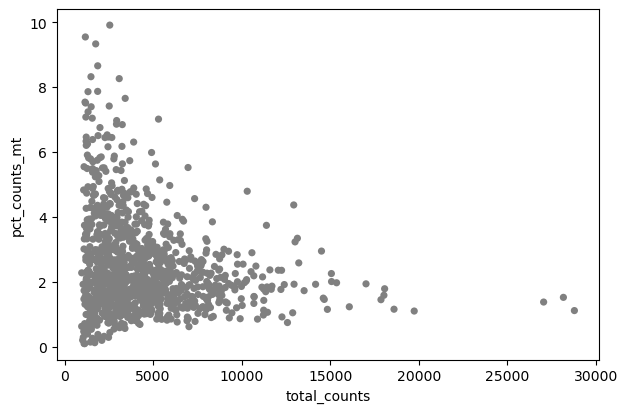

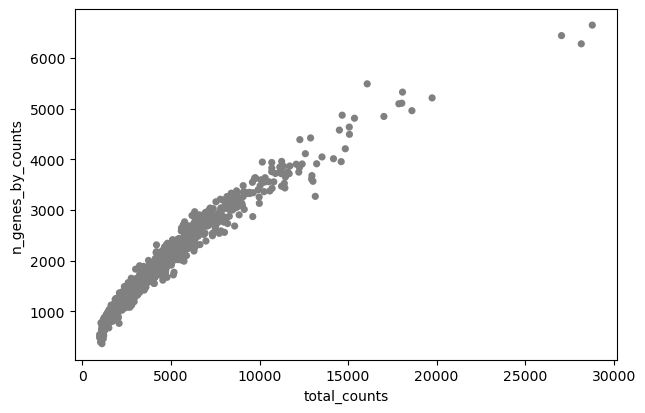

Hs_SAT_SVF_249-2B-1


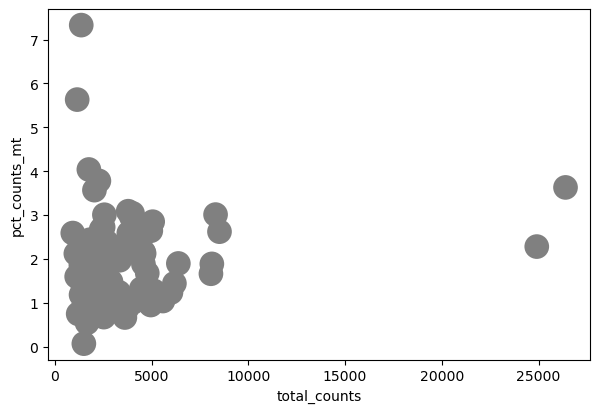

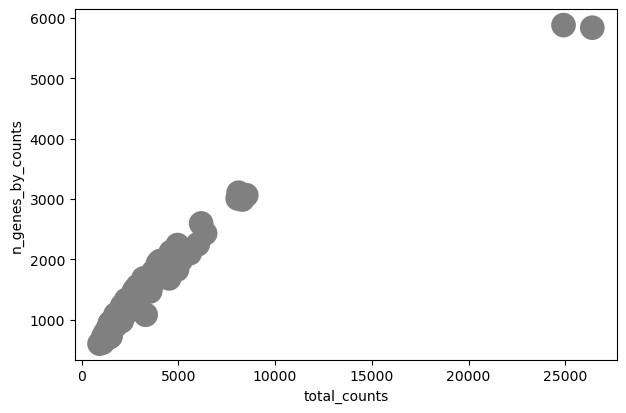

Hs_SAT_SVF_249-1A-1


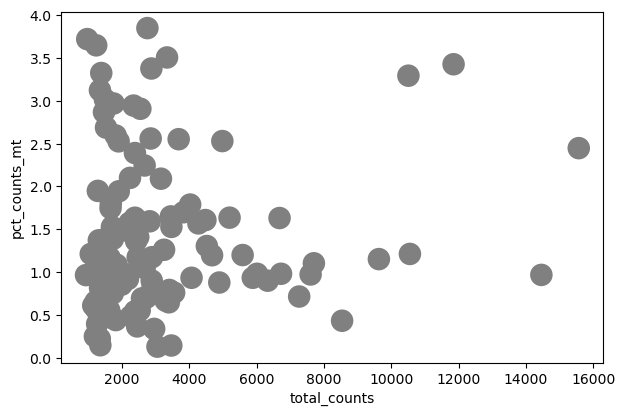

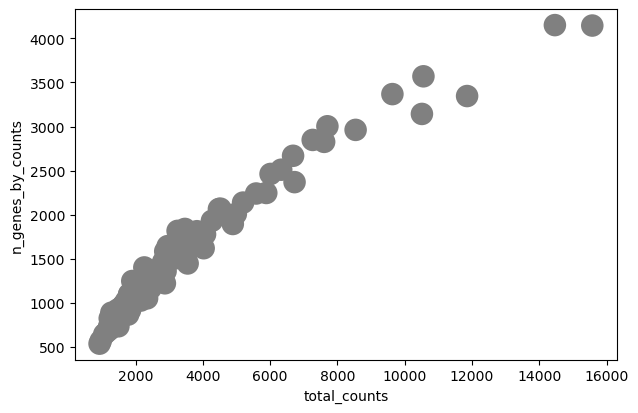

Hs_SAT_SVF_239-3BC-1


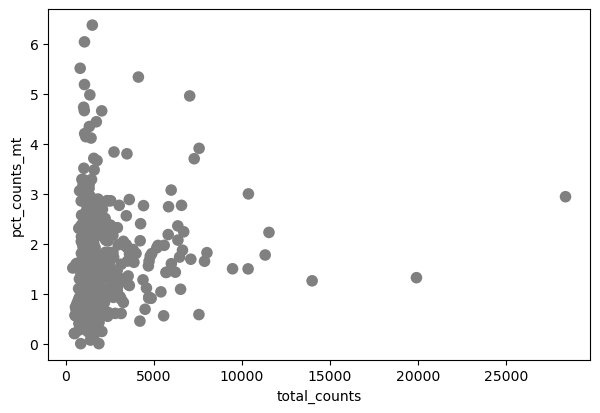

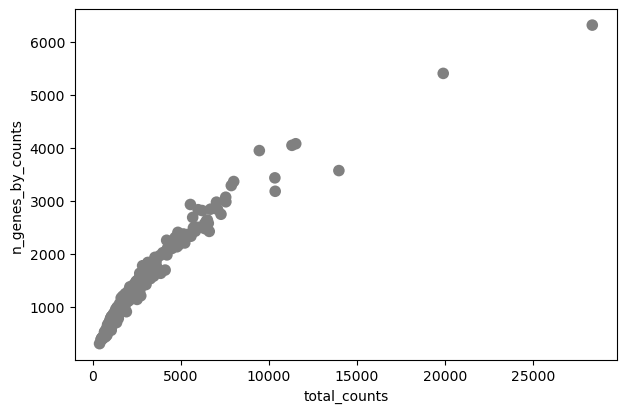

Hs_SAT_SVF_239-2A-1


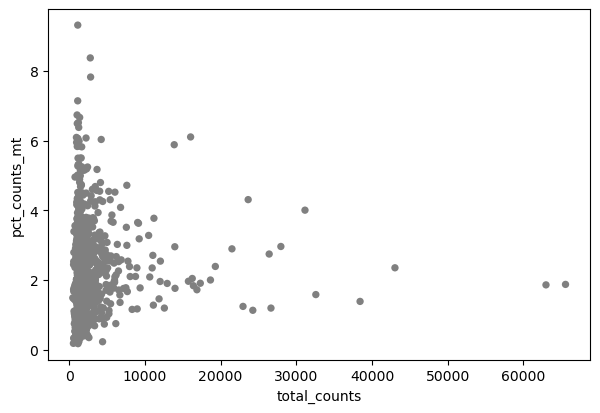

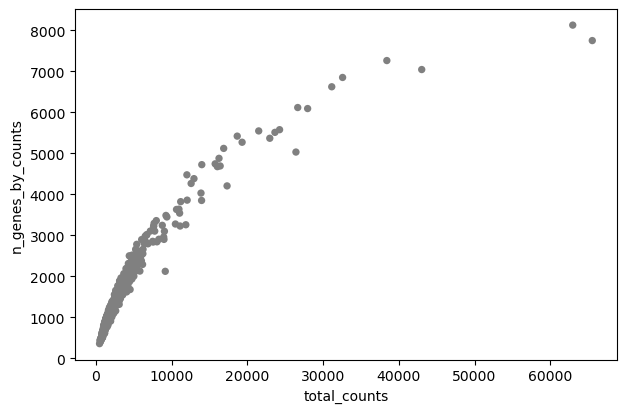

Hs_SAT_SVF_236-2A-2


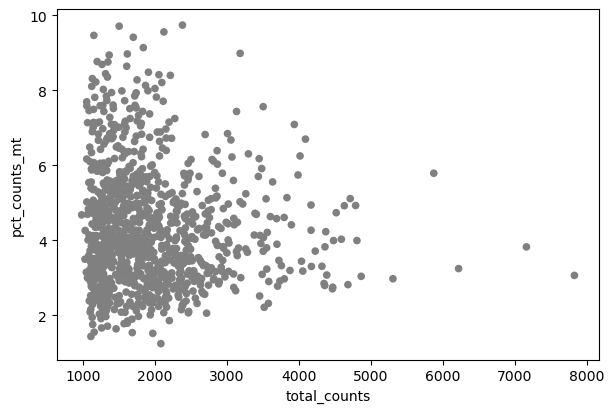

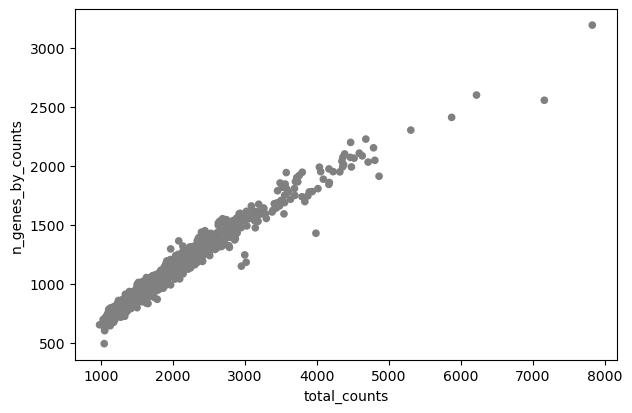

Hs_SAT_SVF_242-2A-1


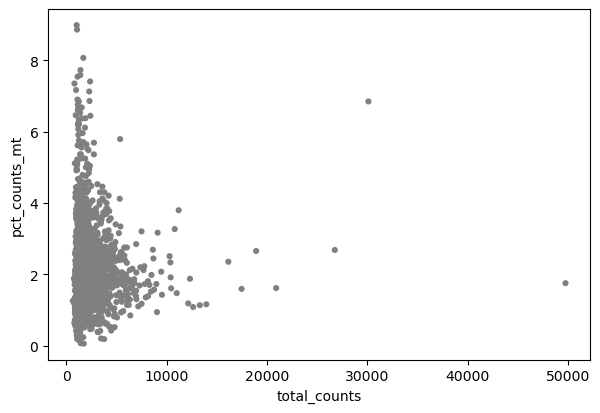

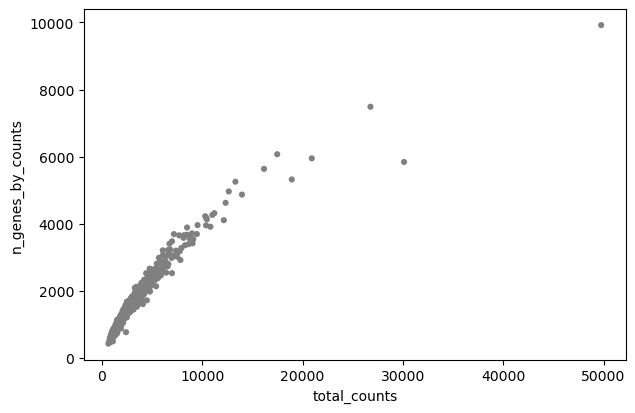

Hs_SAT_SVF_236-1A-2


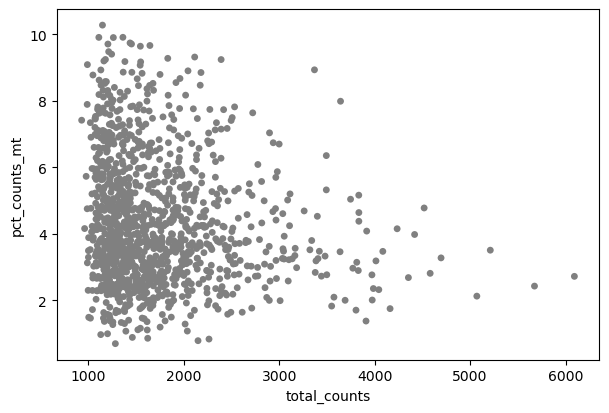

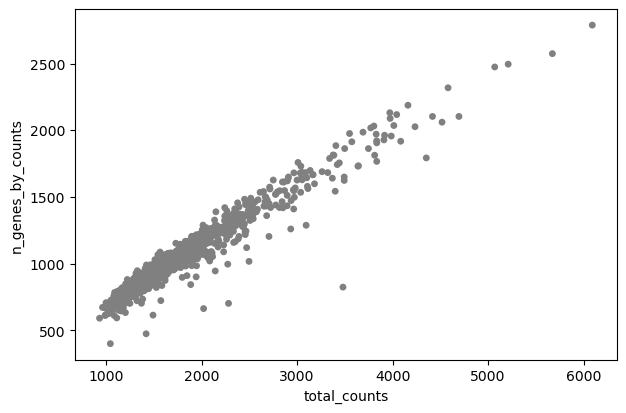

In [23]:
for key in sn_adatas:
    print(key)
    sc.pl.scatter(sn_adatas[key], x="total_counts", y="pct_counts_mt")
    sc.pl.scatter(sn_adatas[key], x="total_counts", y="n_genes_by_counts")
for key in sc_adatas:
    print(key)
    sc.pl.scatter(sc_adatas[key], x="total_counts", y="pct_counts_mt")
    sc.pl.scatter(sc_adatas[key], x="total_counts", y="n_genes_by_counts")

## **Assigning cell types:**

In [24]:
cell_meta_sc["cell_type__ontology_label"].value_counts()

cell_type__ontology_label
preadipocyte                            19806
T cell                                   1621
macrophage                               1495
dendritic cell                           1407
immature NK T cell                        721
monocyte                                  713
endothelial cell                          627
endothelial cell of lymphatic vessel      203
mast cell                                  83
smooth muscle cell                         82
pericyte cell                              59
B cell                                     52
stromal cell of endometrium                 3
neutrophil                                  2
Name: count, dtype: int64

In [25]:
cell_meta_sn["cell_type__ontology_label"].value_counts()

cell_type__ontology_label
preadipocyte                            31526
mesothelial cell                        30482
fat cell                                25871
macrophage                              16653
endothelial cell                        14799
T cell                                   5504
smooth muscle cell                       2798
endothelial cell of lymphatic vessel     2685
immature NK T cell                       1886
pericyte cell                            1401
monocyte                                 1203
mast cell                                1079
dendritic cell                            971
B cell                                    373
stromal cell of endometrium               309
neutrophil                                144
Name: count, dtype: int64

In [26]:
for key in sn_adatas:
    sn_adatas[key] = assign_cell_types(
        sn_adatas[key],
        cell_meta_sn.loc[sn_adatas[key].obs.index]["cell_type__ontology_label"].values,
    )
for key in sc_adatas:
    sc_adatas[key] = assign_cell_types(
        sc_adatas[key],
        cell_meta_sc.loc[sc_adatas[key].obs.index]["cell_type__ontology_label"].values,
    )

Done!
Cell Types in Data are: cell_types
preadipocyte                            1257
fat cell                                1237
macrophage                               759
endothelial cell                         471
T cell                                   407
immature NK T cell                       196
monocyte                                 151
smooth muscle cell                        93
pericyte cell                             63
dendritic cell                            58
mast cell                                 48
B cell                                    48
endothelial cell of lymphatic vessel      14
neutrophil                                 3
Name: count, dtype: int64
Done!
Cell Types in Data are: cell_types
preadipocyte                            3061
fat cell                                1004
endothelial cell                         802
macrophage                               782
T cell                                   424
monocyte                             

## Filtering Cells

In [27]:
sc_adatas.keys()

dict_keys(['Hs_SAT_SVF_238-2A-1', 'Hs_SAT_SVF_239-3B-1', 'Hs_SAT_SVF_238-1B-1', 'Hs_SAT_SVF_235-1A-2', 'Hs_SAT_SVF_235-2B-2', 'Hs_SAT_SVF_235-2B-1', 'Hs_SAT_SVF_239-1B-2', 'Hs_SAT_SVF_248-2A-1', 'Hs_SAT_SVF_237-1A-1', 'Hs_SAT_SVF_242-2B-1', 'Hs_SAT_SVF_236-1A-1', 'Hs_SAT_SVF_235-1B-1', 'Hs_SAT_SVF_235-1B-2', 'Hs_SAT_SVF_249-2A-1', 'Hs_SAT_SVF_242-3A-1', 'Hs_SAT_SVF_249-1B-1', 'Hs_SAT_SVF_239-1A-1', 'Hs_SAT_SVF_239-3A-1', 'Hs_SAT_SVF_237-2A-1', 'Hs_SAT_SVF_238-1A-1', 'Hs_SAT_SVF_248-1A-1', 'Hs_SAT_SVF_242-1B-1', 'Hs_SAT_SVF_248-1B-1', 'Hs_SAT_SVF_235-2A-1', 'Hs_SAT_SVF_235-2A-2', 'Hs_SAT_SVF_240-1B-1', 'Hs_SAT_SVF_238-2B-1', 'Hs_SAT_SVF_236-1B-1', 'Hs_SAT_SVF_235-1A-1', 'Hs_SAT_SVF_249-2B-1', 'Hs_SAT_SVF_249-1A-1', 'Hs_SAT_SVF_239-3BC-1', 'Hs_SAT_SVF_239-2A-1', 'Hs_SAT_SVF_236-2A-2', 'Hs_SAT_SVF_242-2A-1', 'Hs_SAT_SVF_236-1A-2'])

In [28]:
# List of thresholds for n_genes_by_counts filtering for single-nucleus data
sn_n_genes_by_counts_thresholds = [
    7500,
    6500,
    6500,
    7500,
    7500,
    6000,
    5500,
    5500,
    6200,
    6000,
    7500,
    5500,
    6000,
]

# Keys for single-nucleus AnnData objects
sn_keys = [
    "Hs_SAT_12-1",
    "Hs_SAT_13-1",
    "Hs_SAT_266-1",
    "Hs_SAT_01-1",
    "Hs_SAT_02-1",
    "Hs_SAT_04-1",
    "Hs_SAT_253-1",
    "Hs_SAT_254-1",
    "Hs_SAT_256-1",
    "Hs_SAT_255-1",
    "Hs_SAT_09-1",
    "Hs_SAT_10-1",
    "Hs_SAT_11-1",
]

# Dictionary to store the filtered single-nucleus AnnData objects
sn_adatas_filtered = {}

# Apply filtering to each AnnData object
for key, n_genes_threshold in zip(sn_keys, sn_n_genes_by_counts_thresholds):
    sn_adatas_filtered[key] = sn_adatas[key][
        sn_adatas[key].obs.n_genes_by_counts < n_genes_threshold, :
    ]
    sn_adatas_filtered[key] = sn_adatas_filtered[key][
        sn_adatas_filtered[key].obs.pct_counts_mt < 8, :
    ].copy()
sn_adatas = sn_adatas_filtered.copy()

In [29]:
# thresholds for n_genes_by_counts filtering
n_genes_by_counts_thresholds = [
    4000,
    4000,
    3000,
    3800,
    3000,
    2500,
    3500,
    3000,
    3000,
    1750,
    3000,
    1800,
    5500,
    3500,
    2500,
    3000,
    3000,
    3000,
    3500,
    4000,
    3500,
    3800,
    3000,
    3200,
    1800,
    3500,
    4200,
    3200,
    2500,
    3500,
    3000,
    2500,
    3000,
    2500,
    2500,
    2800,
]

# Keys for single-cell AnnData objects
sc_keys = [
    "Hs_SAT_SVF_235-1A-1",
    "Hs_SAT_SVF_235-1A-2",
    "Hs_SAT_SVF_235-1B-1",
    "Hs_SAT_SVF_235-1B-2",
    "Hs_SAT_SVF_235-2A-1",
    "Hs_SAT_SVF_235-2A-2",
    "Hs_SAT_SVF_235-2B-1",
    "Hs_SAT_SVF_235-2B-2",
    "Hs_SAT_SVF_236-1A-1",
    "Hs_SAT_SVF_236-1A-2",
    "Hs_SAT_SVF_236-1B-1",
    "Hs_SAT_SVF_236-2A-2",
    "Hs_SAT_SVF_237-1A-1",
    "Hs_SAT_SVF_237-2A-1",
    "Hs_SAT_SVF_238-1A-1",
    "Hs_SAT_SVF_238-1B-1",
    "Hs_SAT_SVF_238-2A-1",
    "Hs_SAT_SVF_238-2B-1",
    "Hs_SAT_SVF_239-1A-1",
    "Hs_SAT_SVF_239-1B-2",
    "Hs_SAT_SVF_239-2A-1",
    "Hs_SAT_SVF_239-3A-1",
    "Hs_SAT_SVF_239-3B-1",
    "Hs_SAT_SVF_239-3BC-1",
    "Hs_SAT_SVF_240-1B-1",
    "Hs_SAT_SVF_242-1B-1",
    "Hs_SAT_SVF_242-2A-1",
    "Hs_SAT_SVF_242-2B-1",
    "Hs_SAT_SVF_242-3A-1",
    "Hs_SAT_SVF_248-1A-1",
    "Hs_SAT_SVF_248-1B-1",
    "Hs_SAT_SVF_248-2A-1",
    "Hs_SAT_SVF_249-1A-1",
    "Hs_SAT_SVF_249-1B-1",
    "Hs_SAT_SVF_249-2A-1",
    "Hs_SAT_SVF_249-2B-1",
]

# Dictionary to store the filtered single-cell AnnData objects
sc_adatas_filtered = {}

# Apply filtering to each AnnData object
for key, n_genes_threshold in zip(sc_keys, n_genes_by_counts_thresholds):
    sc_adatas_filtered[key] = sc_adatas[key][
        sc_adatas[key].obs.n_genes_by_counts < n_genes_threshold, :
    ]
    sc_adatas_filtered[key] = sc_adatas_filtered[key][
        sc_adatas_filtered[key].obs.pct_counts_mt < 10, :
    ].copy()
sc_adatas = sc_adatas_filtered.copy()

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


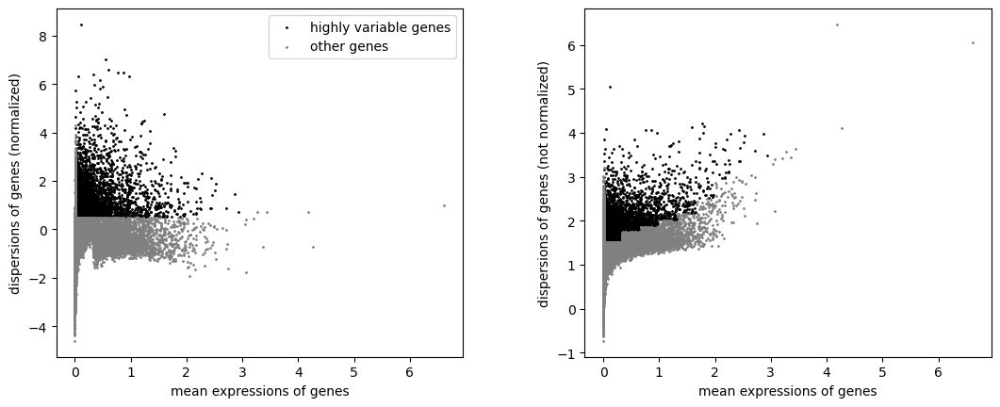

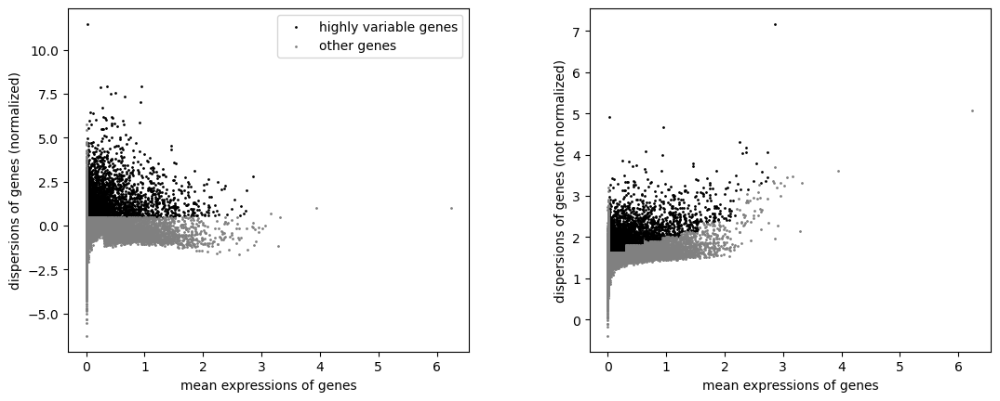

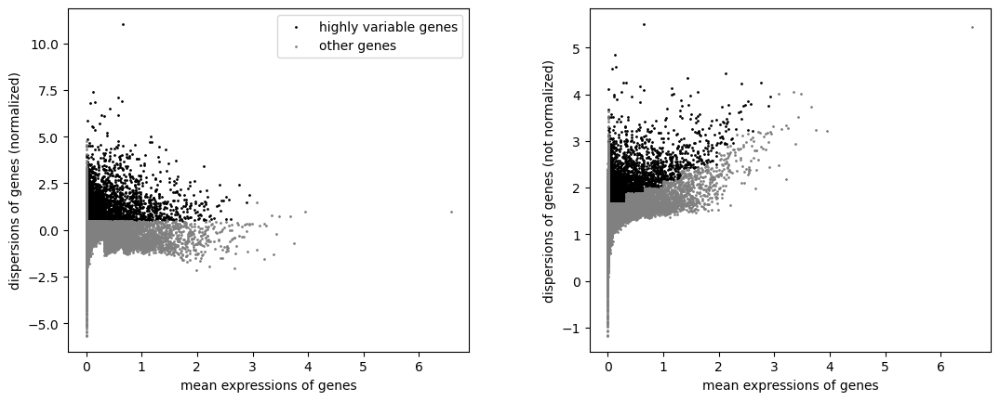

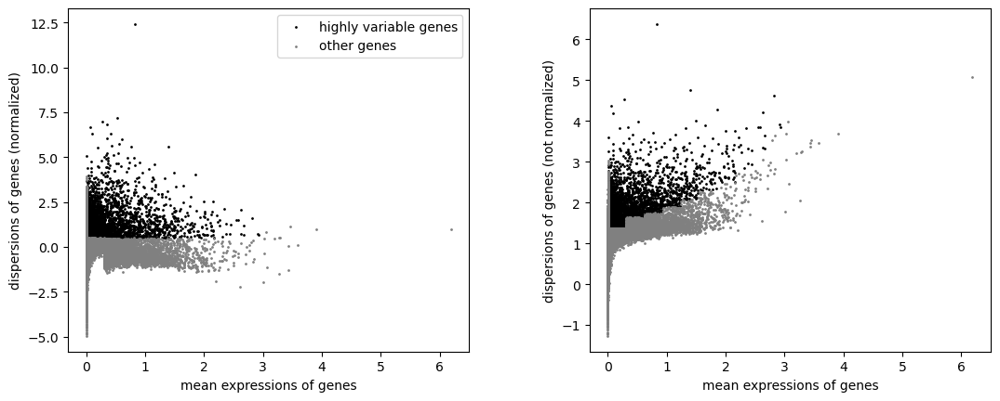

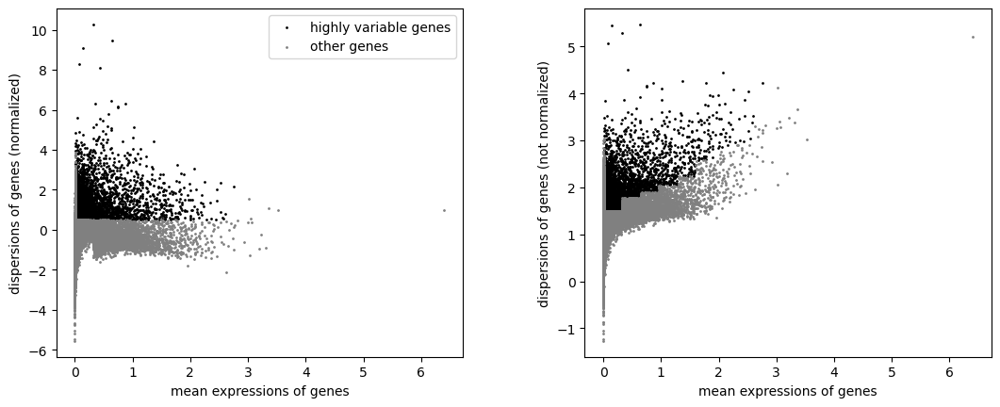

...

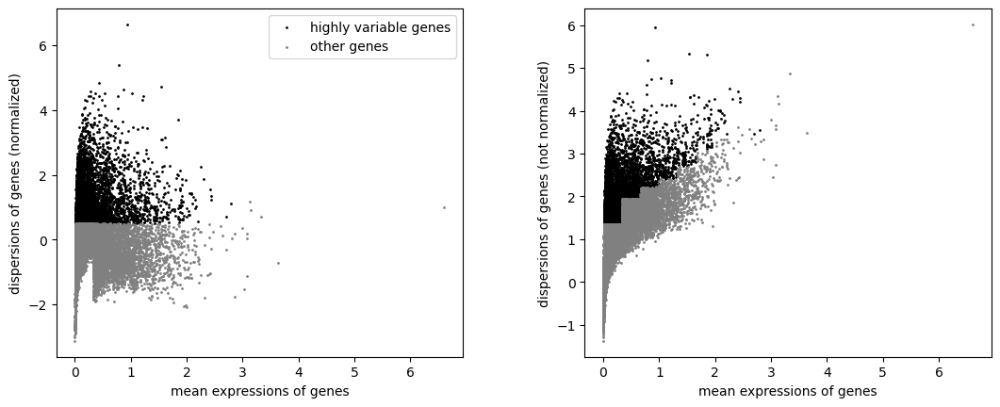

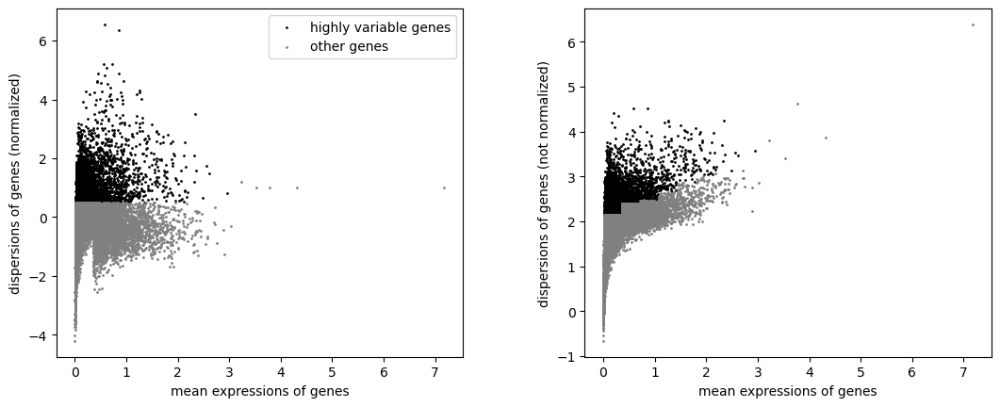

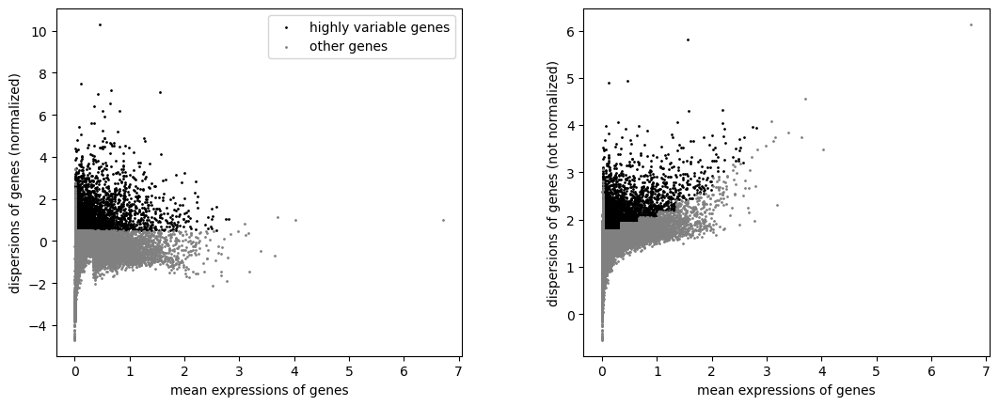

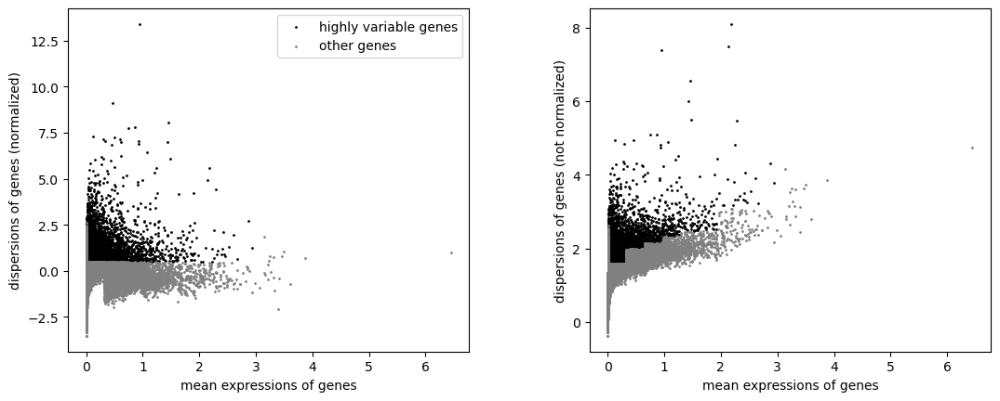

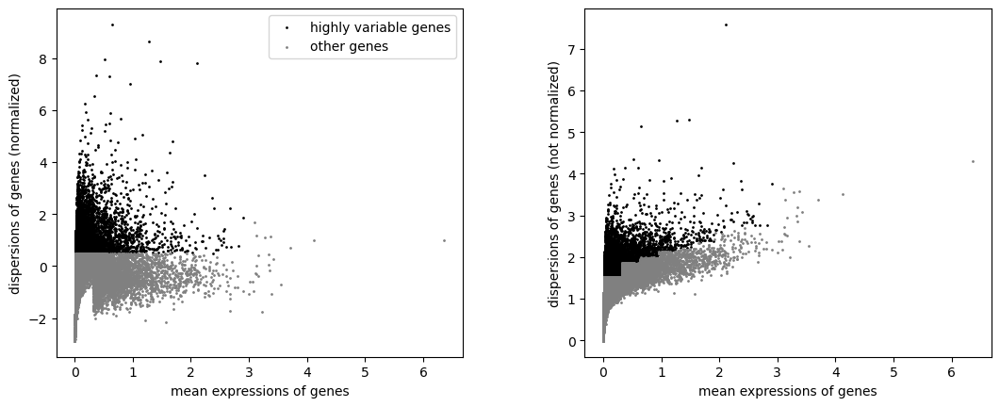

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


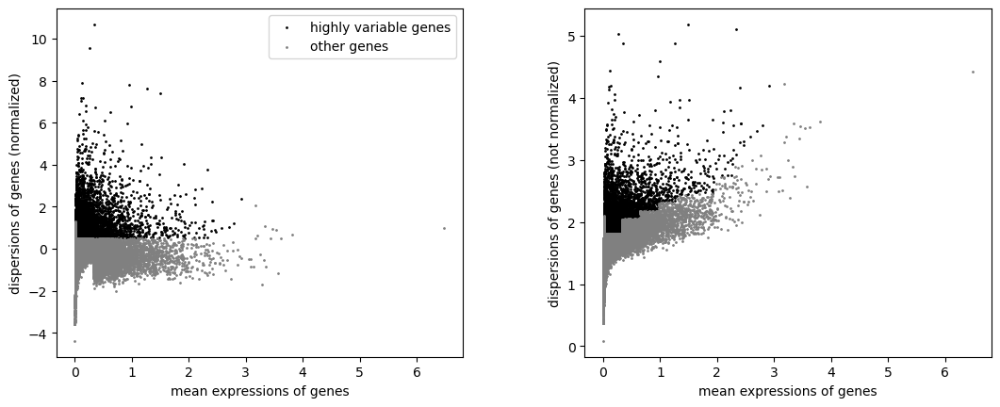

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


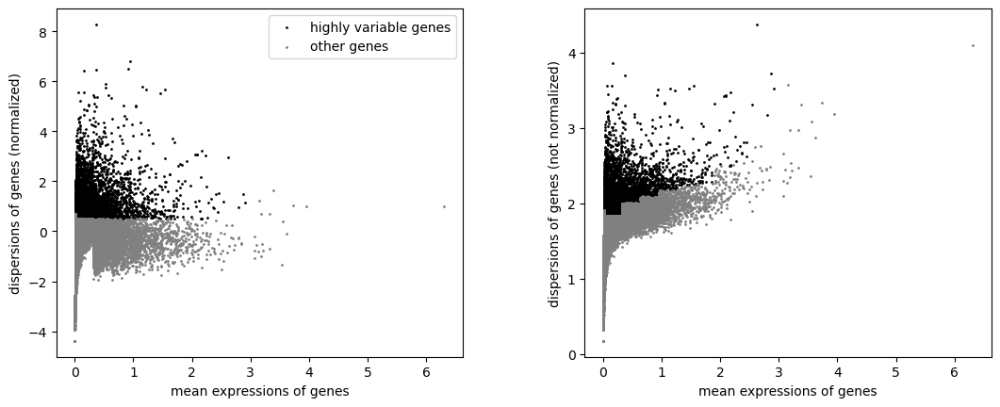

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


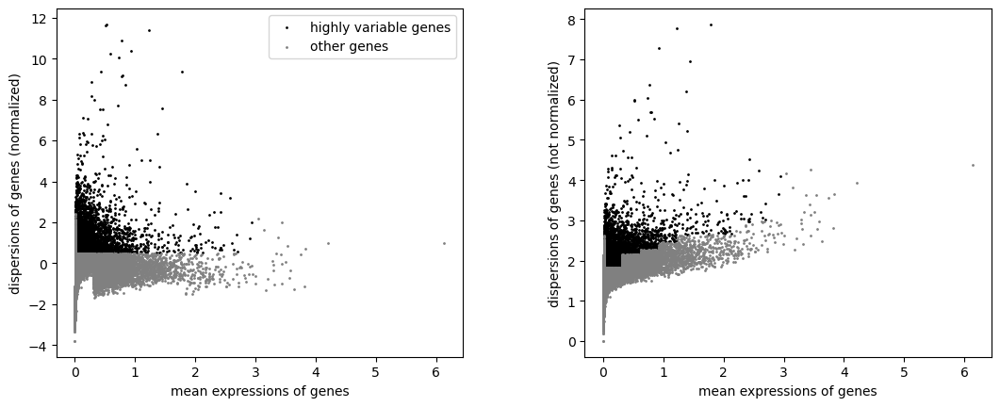

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


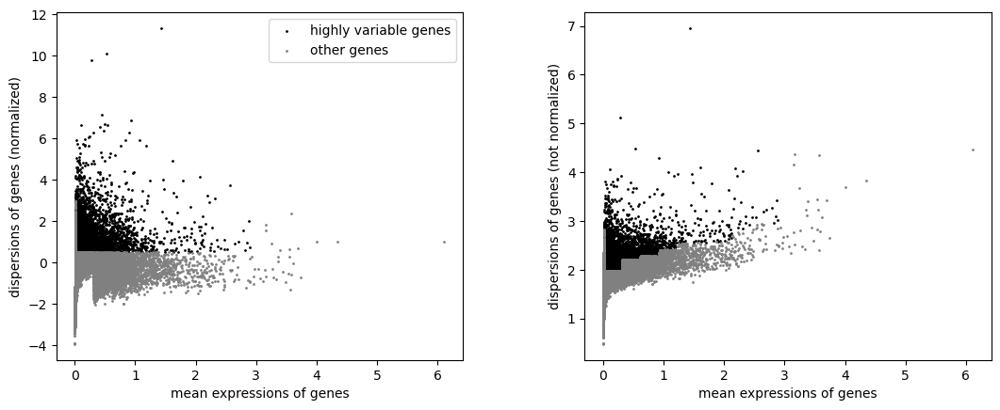

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


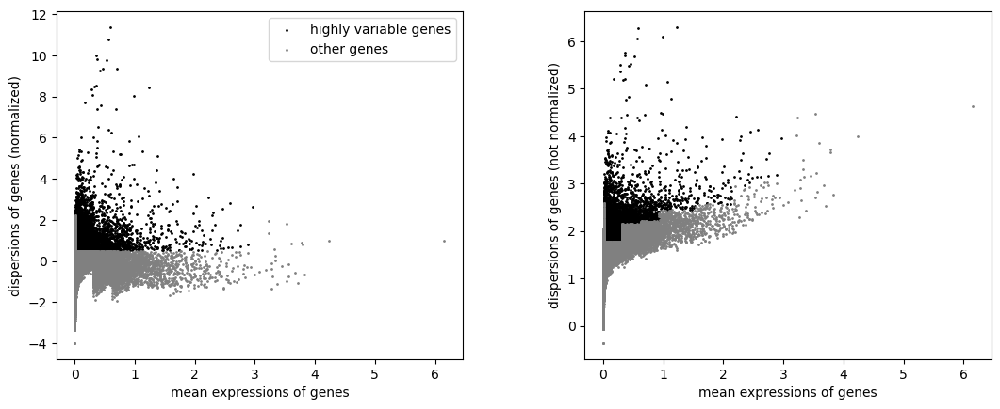

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


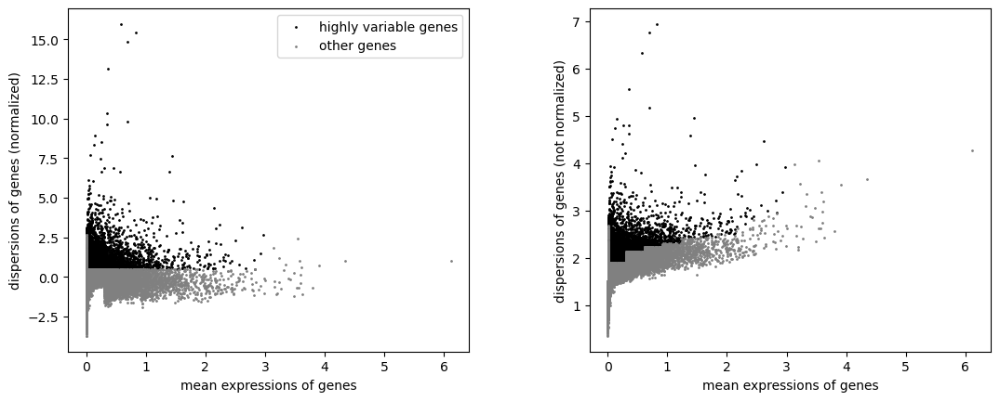

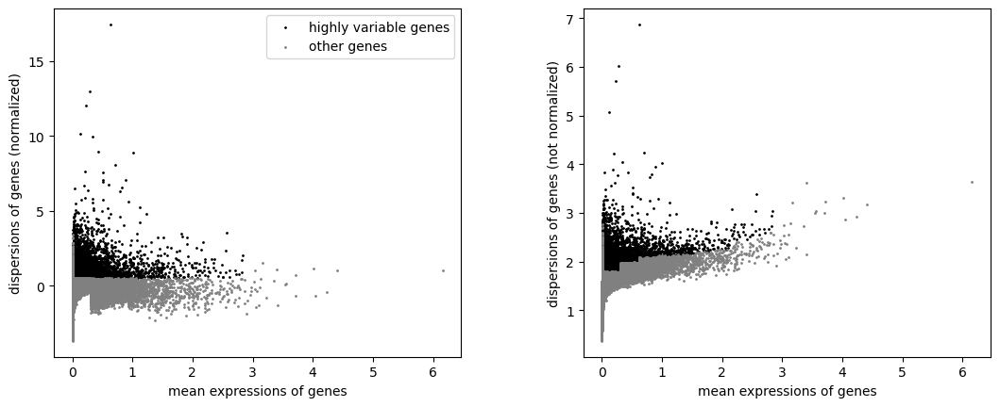

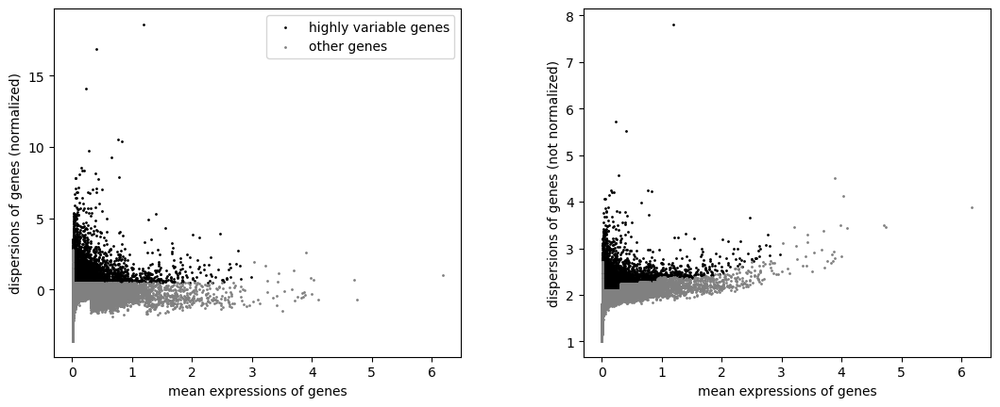

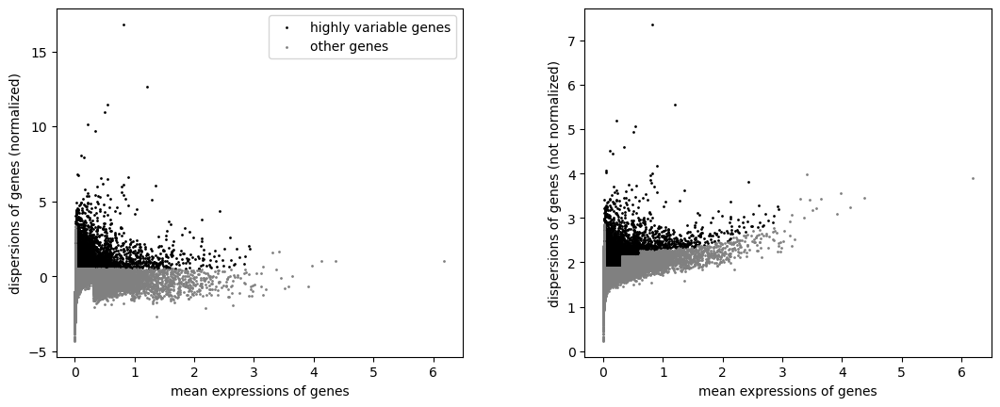

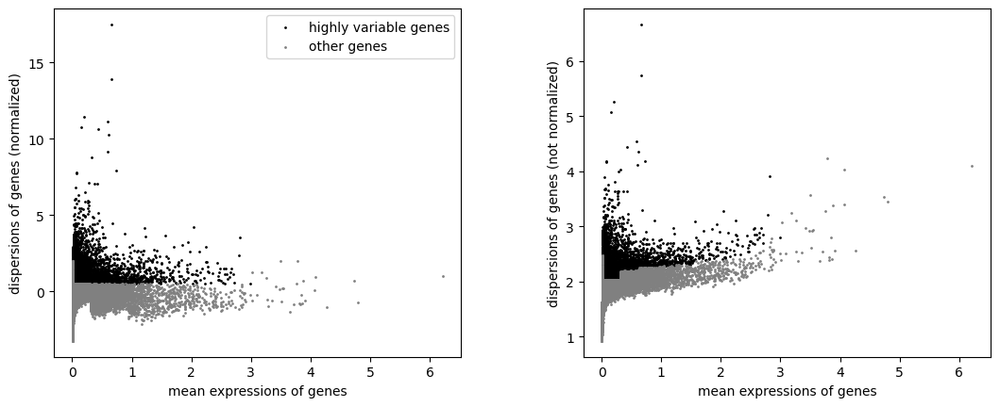

...

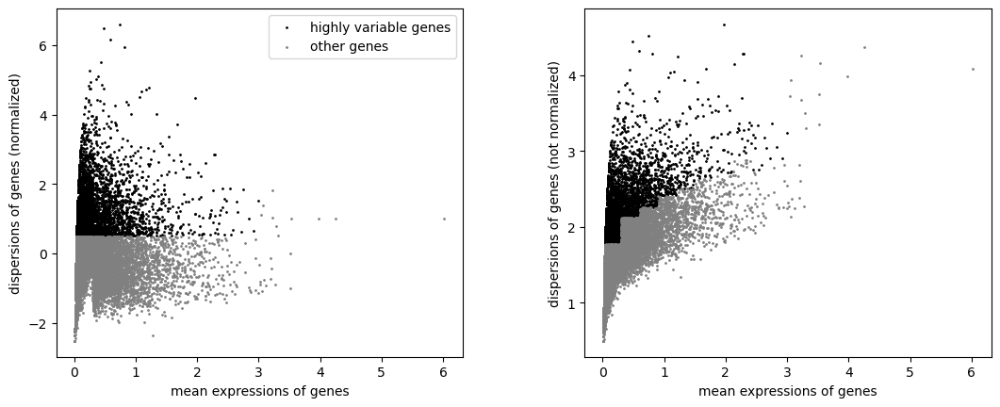

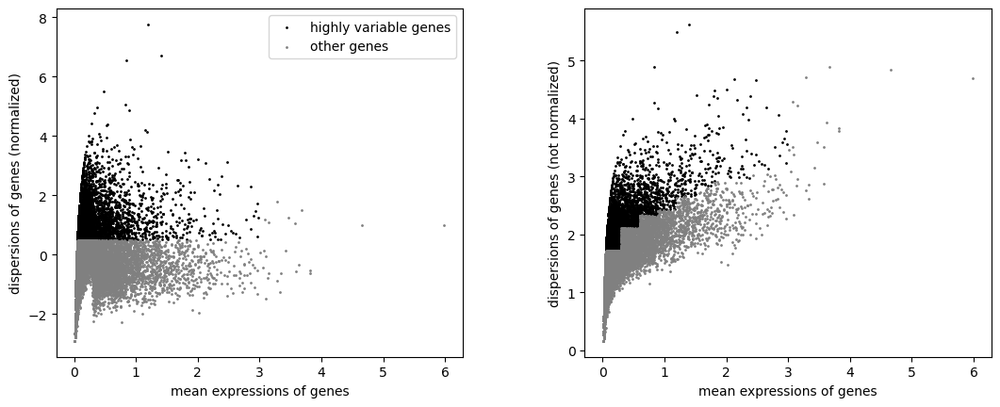

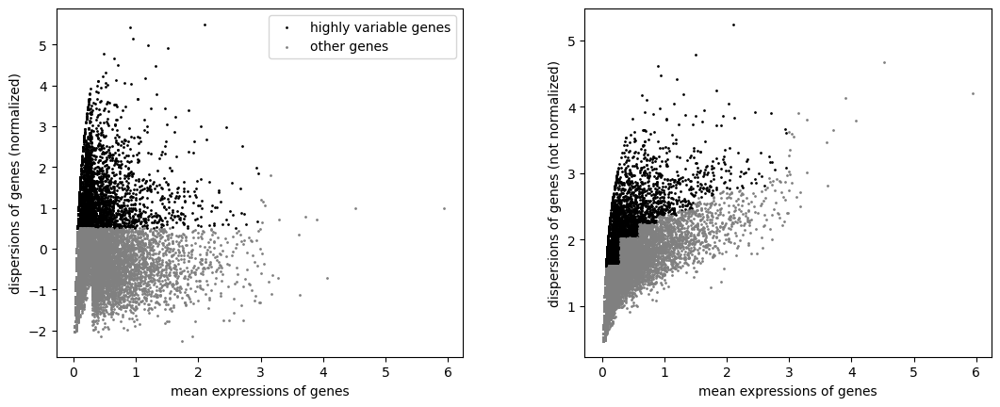

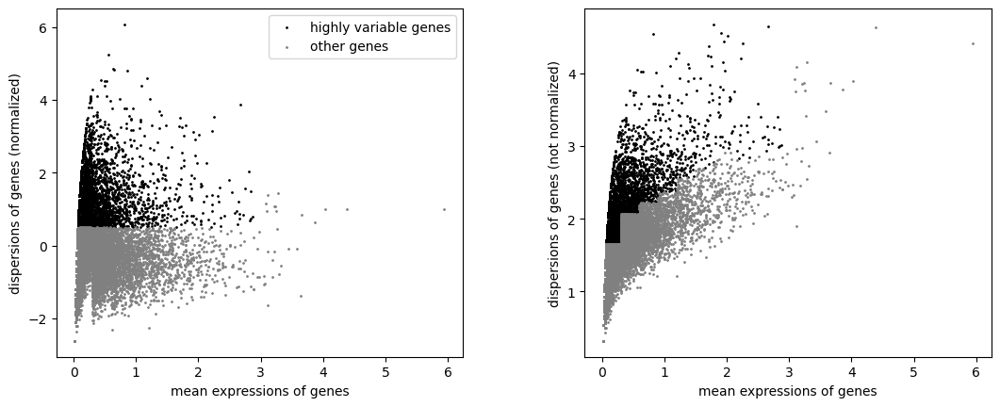

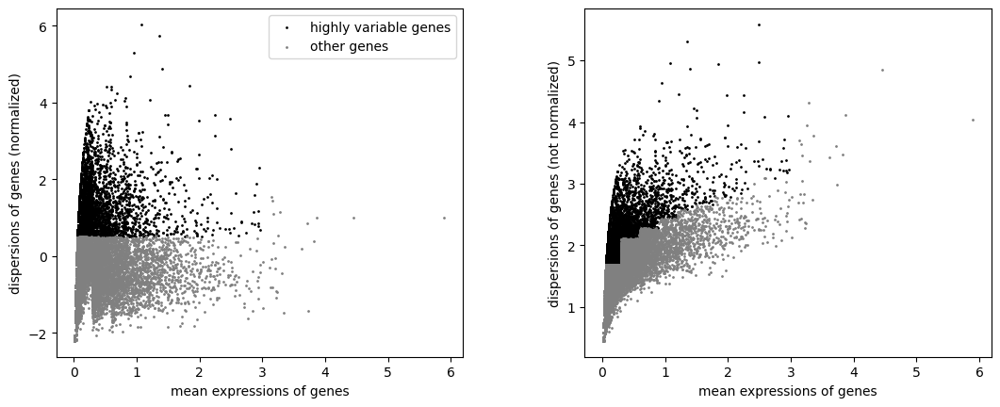

In [30]:
sn_adatas_copy = dict()
for key in sn_adatas:
    # making copy to keep unnormalized for export
    sn_adatas_copy[key] = sn_adatas[key].copy()
    # normalize to 10K counts per cell
    sc.pp.normalize_total(sn_adatas[key], target_sum=1e4)
    # logging local adata
    sc.pp.log1p(sn_adatas[key])
    highly_var_genes = sc.pp.highly_variable_genes(
        sn_adatas[key], min_mean=0.0125, max_mean=3, min_disp=0.5
    )
    sc.pl.highly_variable_genes(sn_adatas[key])

sc_adatas_copy = dict()
# making copy to keep unnormalized for export
for key in sc_adatas:
    sc_adatas_copy[key] = sc_adatas[key].copy()
    # normalize to 10K counts per cell
    sc.pp.normalize_total(sc_adatas[key], target_sum=1e4)
    # logging local adata
    sc.pp.log1p(sc_adatas[key])
    highly_var_genes = sc.pp.highly_variable_genes(
        sc_adatas[key], min_mean=0.0125, max_mean=3, min_disp=0.5
    )
    sc.pl.highly_variable_genes(sc_adatas[key])

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


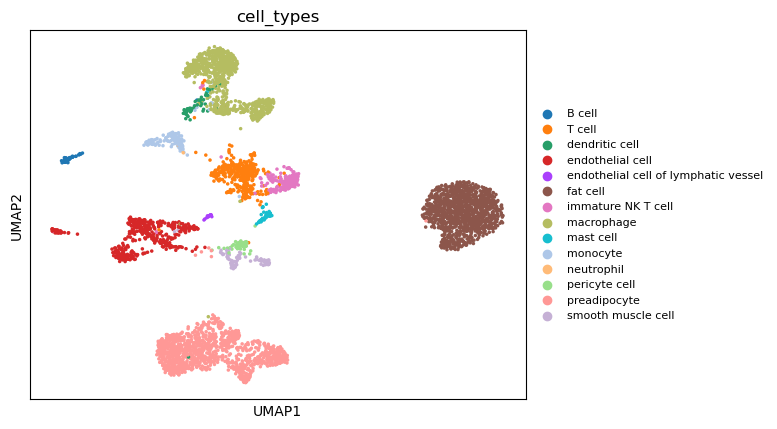

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


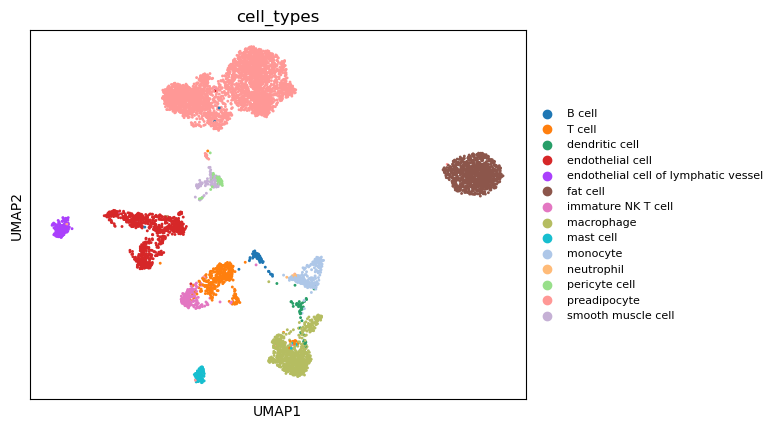

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


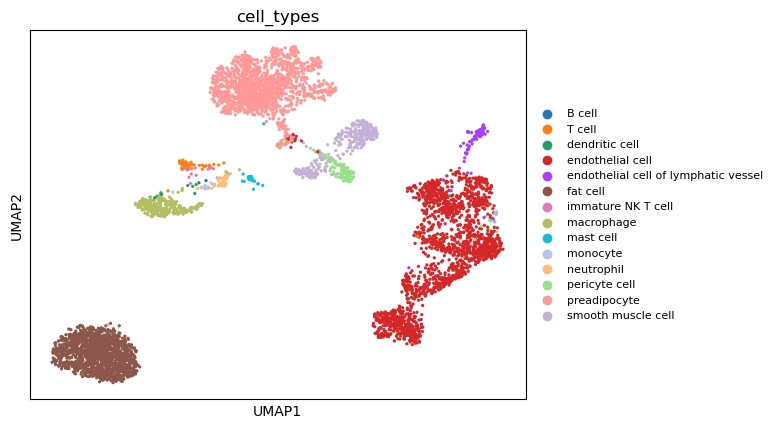

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


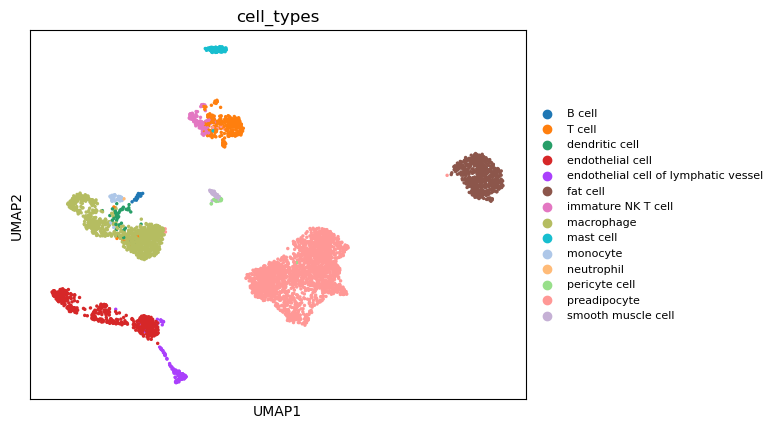

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


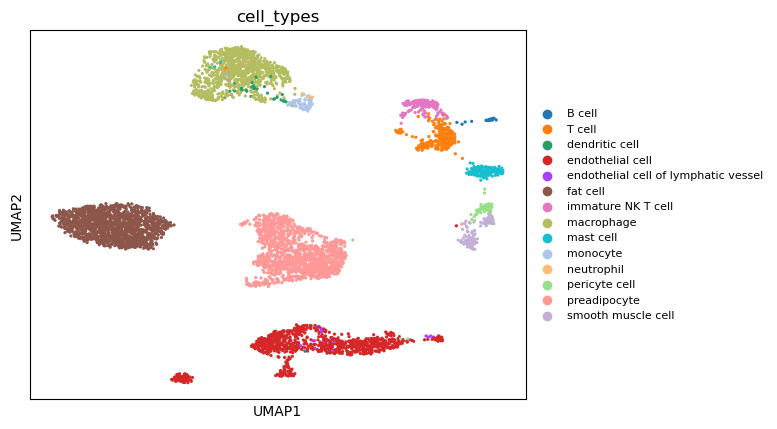

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


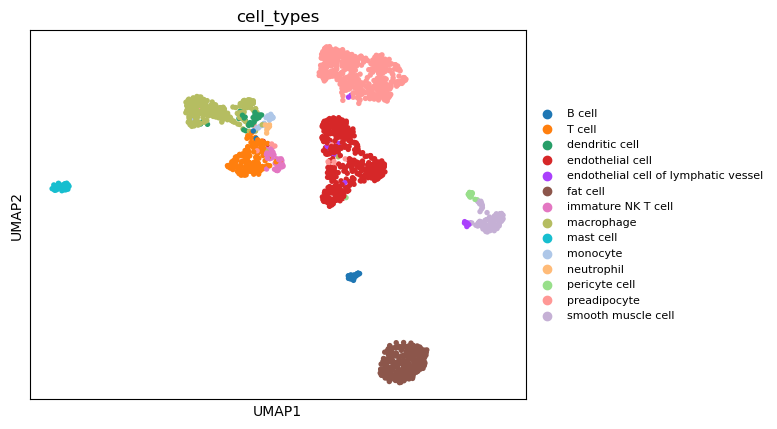

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


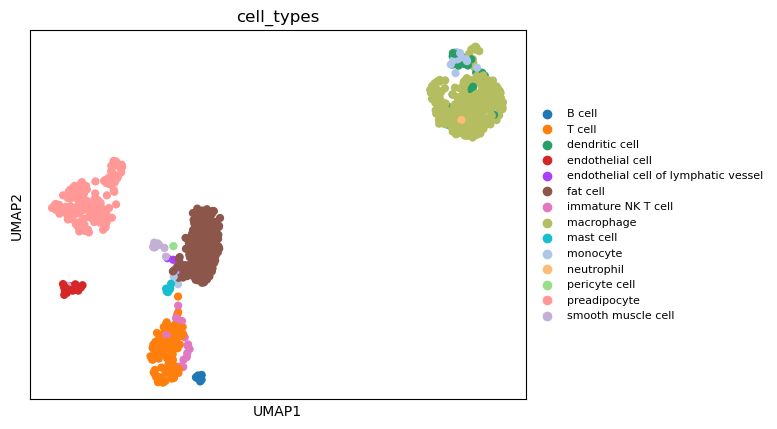

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


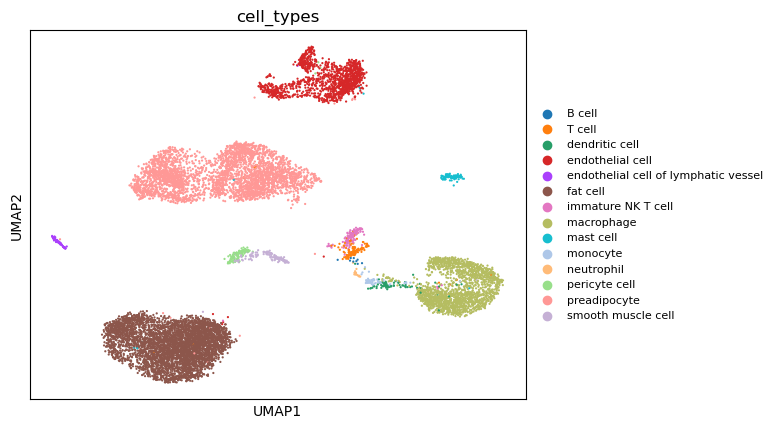

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


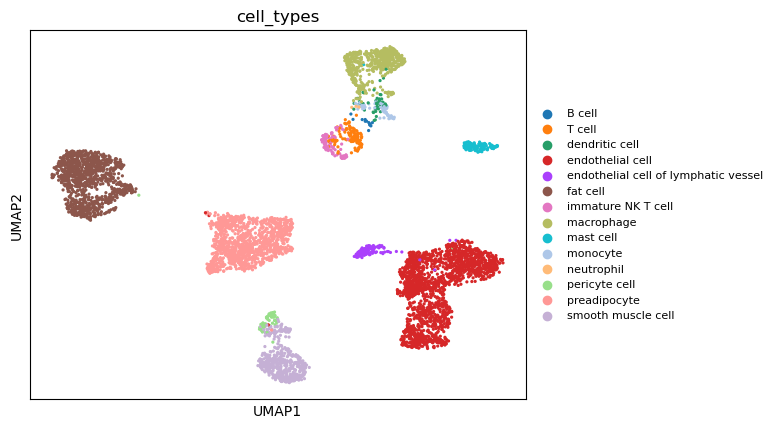

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


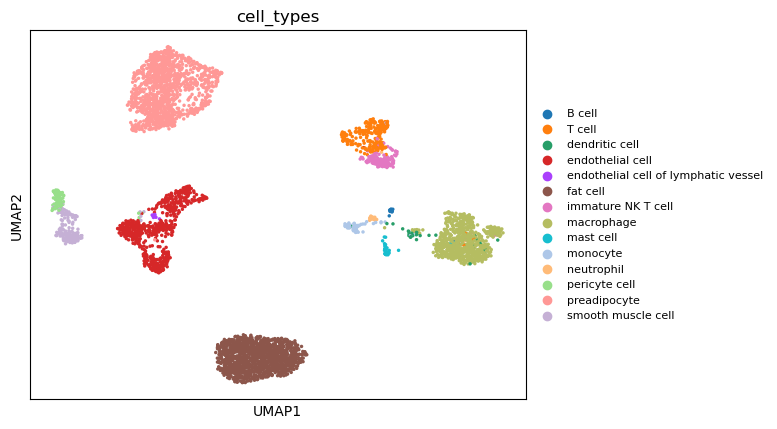

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


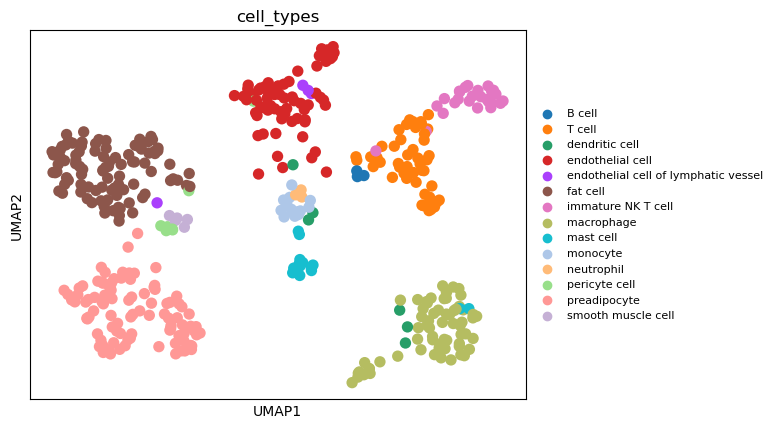

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


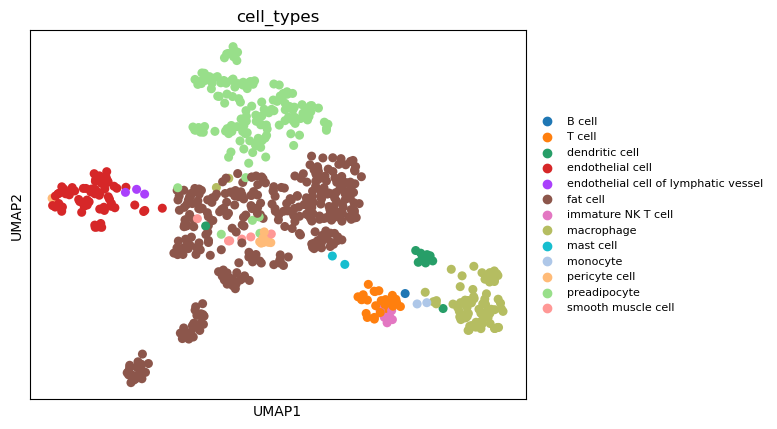

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29093 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


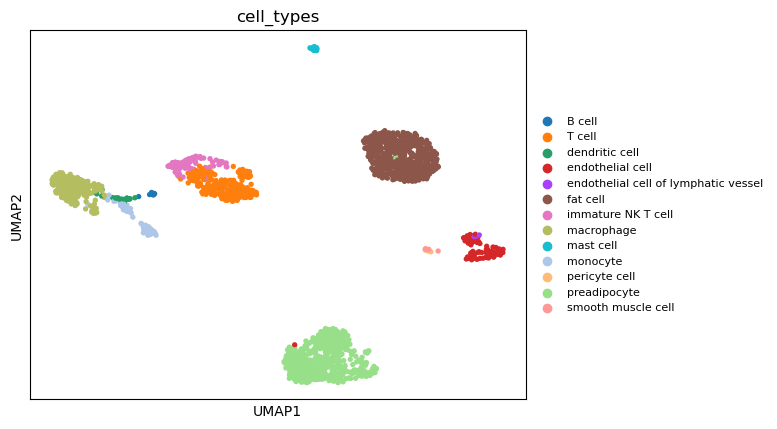

In [31]:
for key in sn_adatas:
    # calculate neighborhood graph
    sc.pp.neighbors(sn_adatas[key])
    # make umap
    sc.tl.umap(sn_adatas[key])
    # plot some markers of the RAW data
    sc.pl.umap(
        sn_adatas[key], color="cell_types", legend_fontsize=8
    )  # calculate neighborhood graph

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


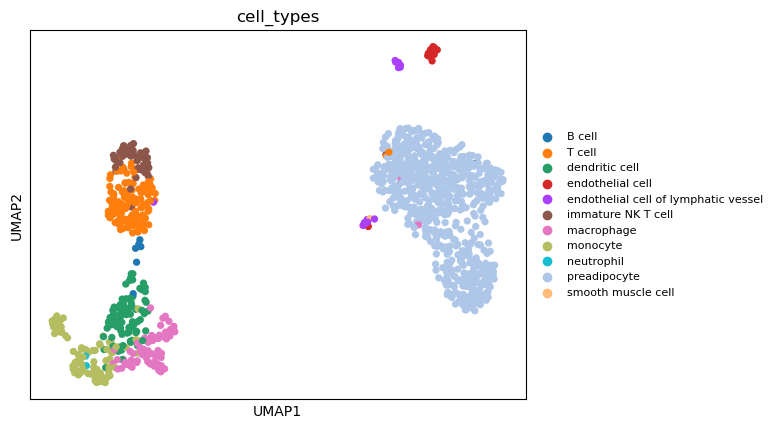

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


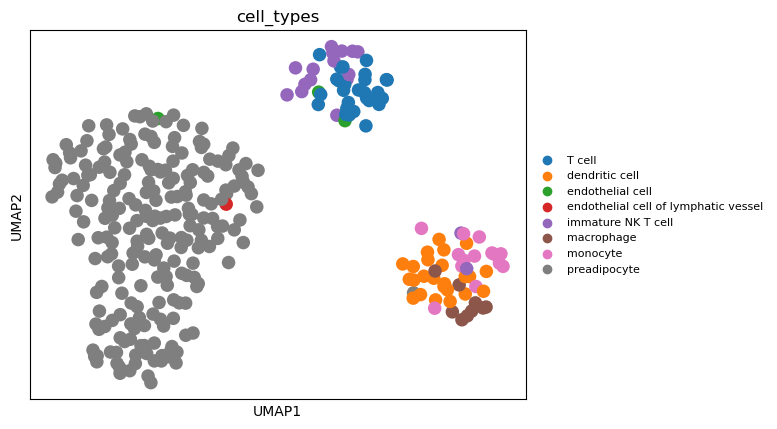

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


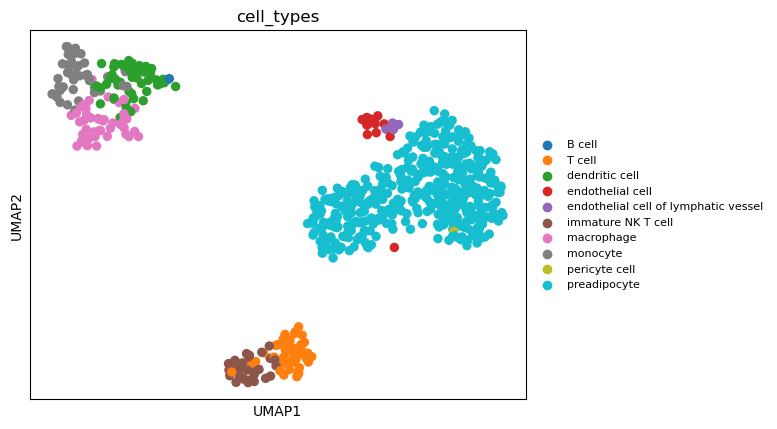

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


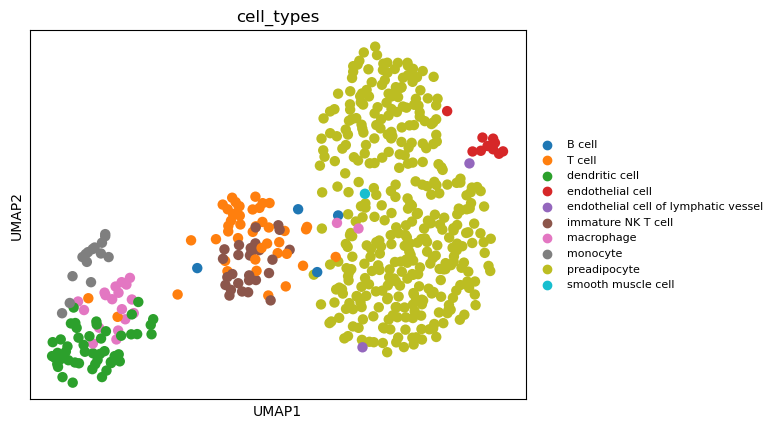

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


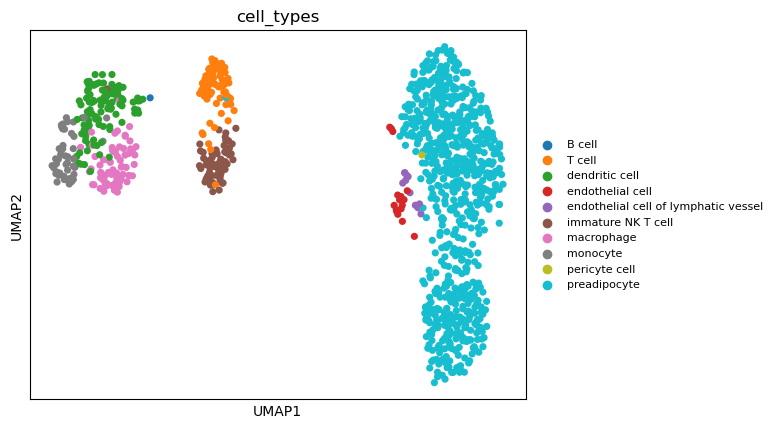

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


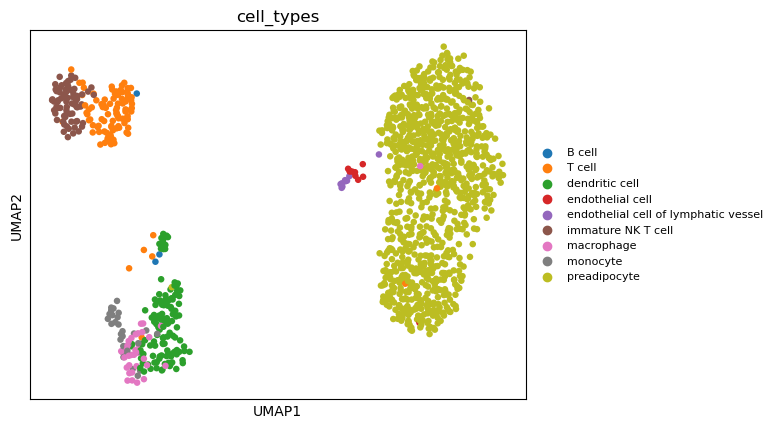

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


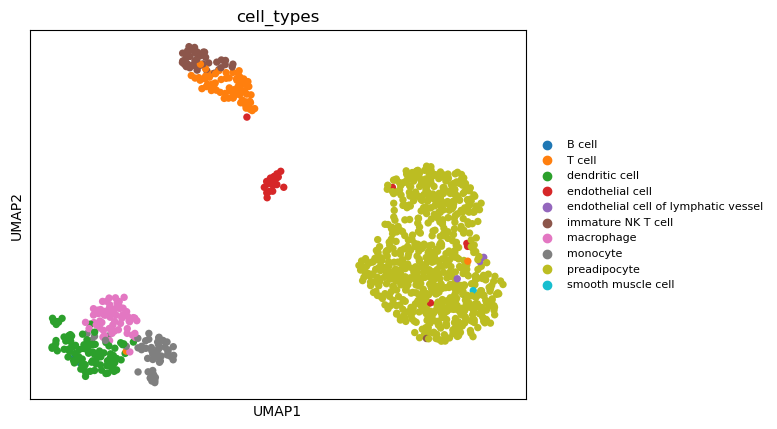

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


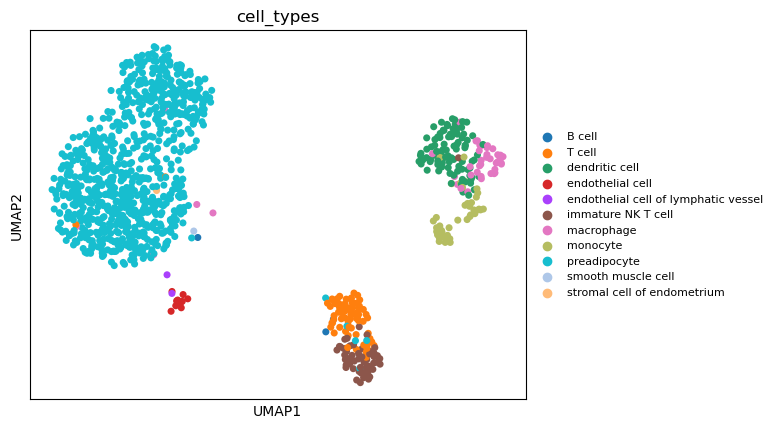

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


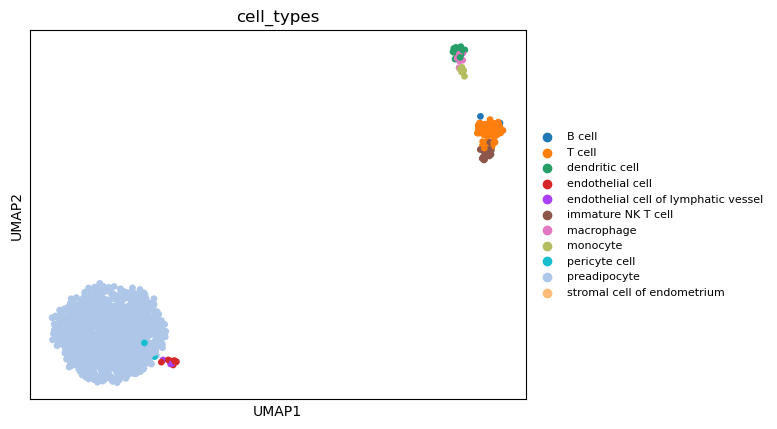

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


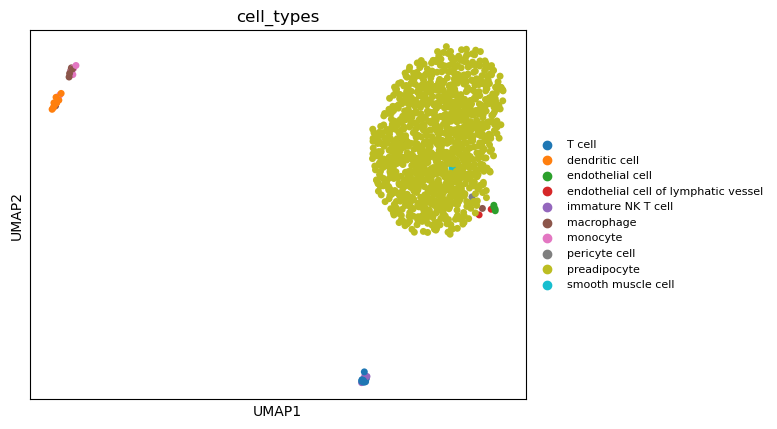

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


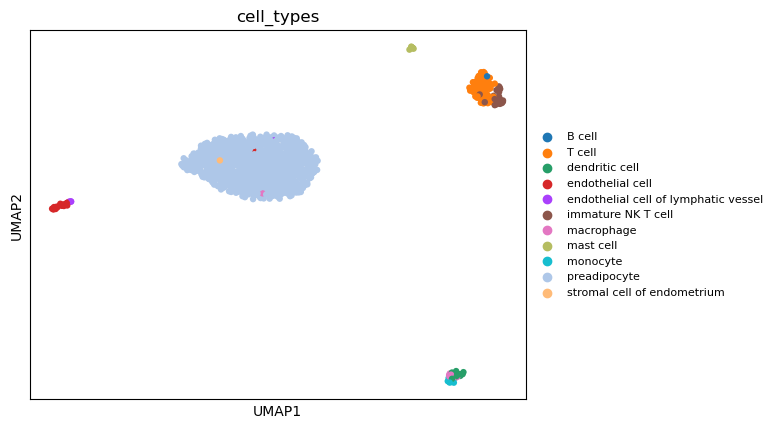

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


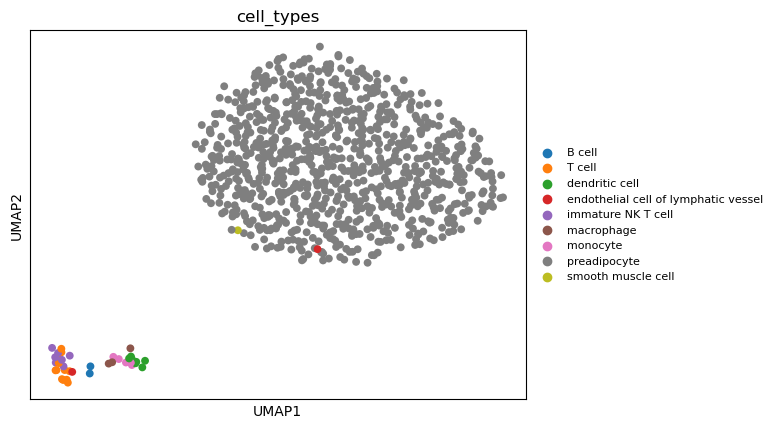

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


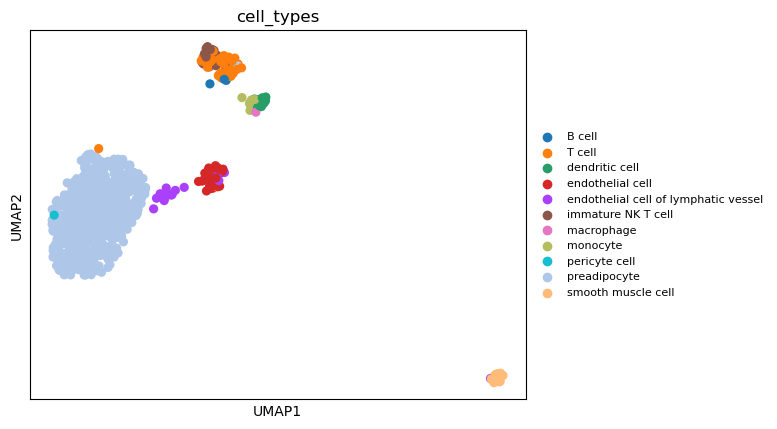

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


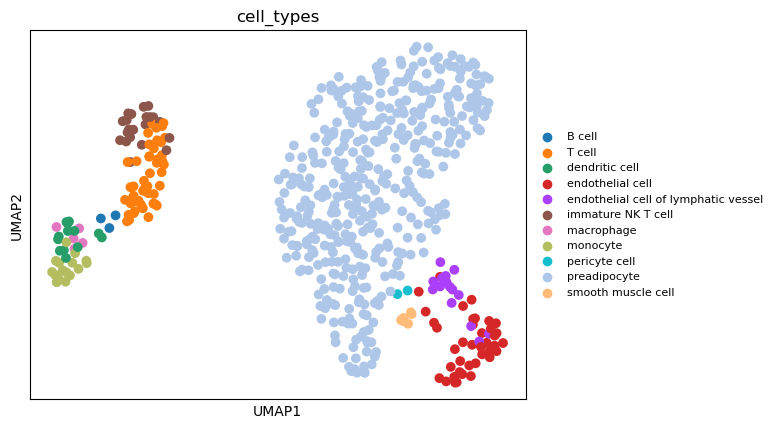

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


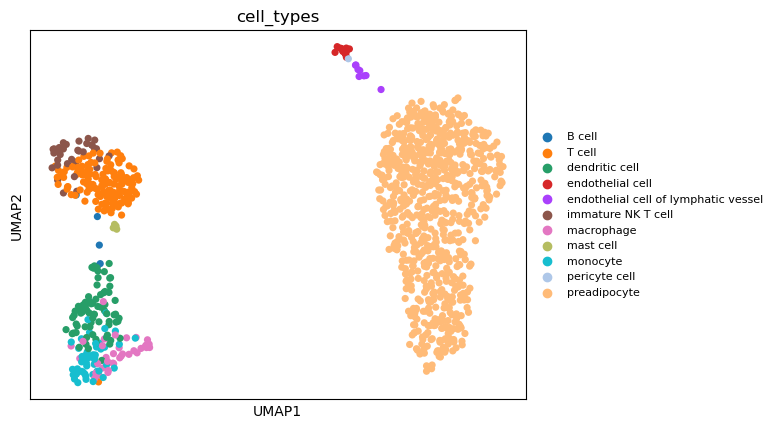

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


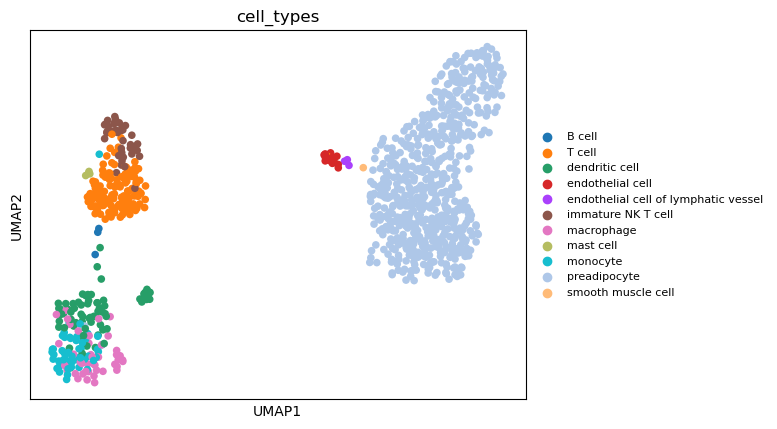

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


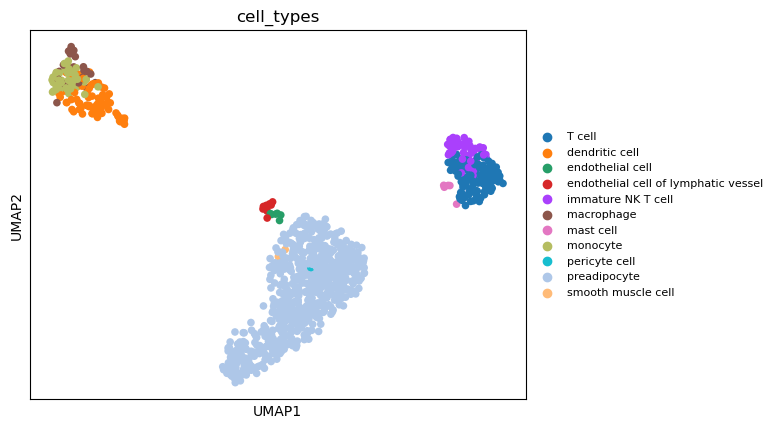

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


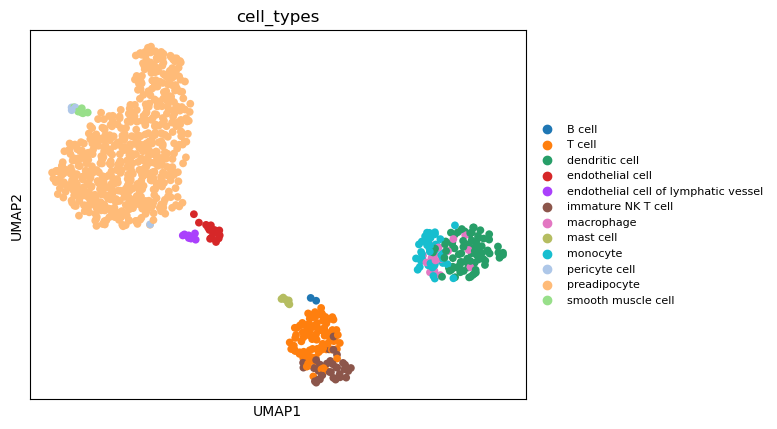

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


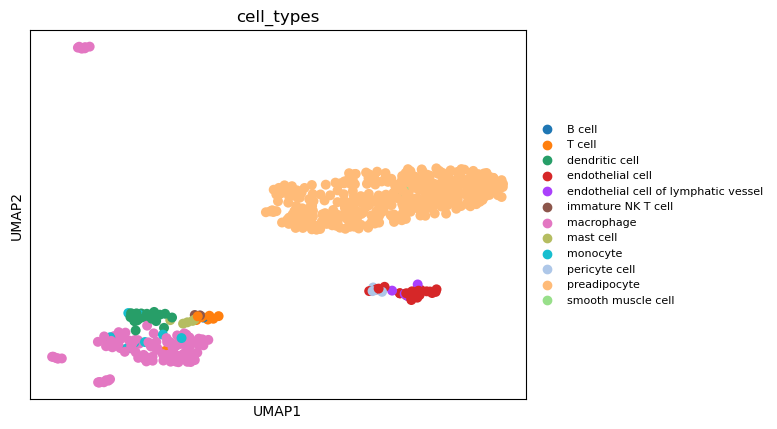

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


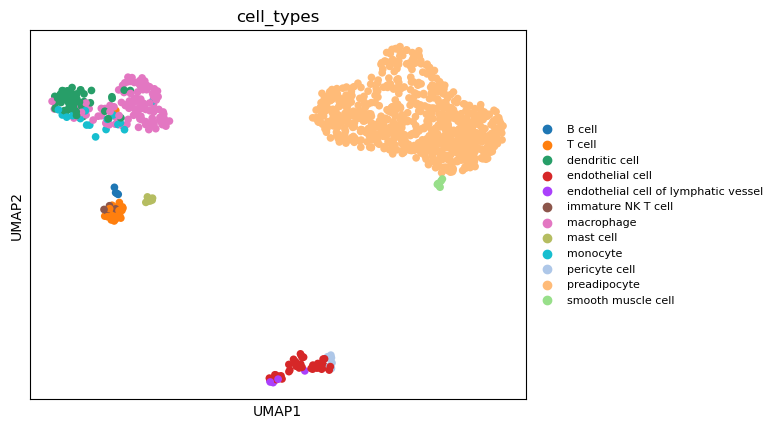

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


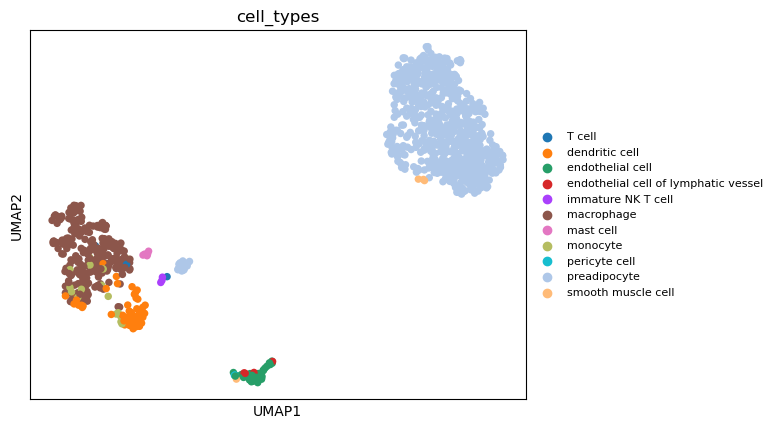

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


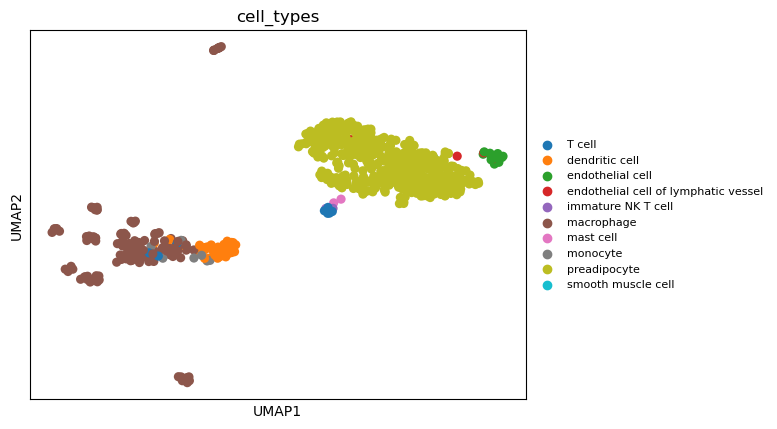

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


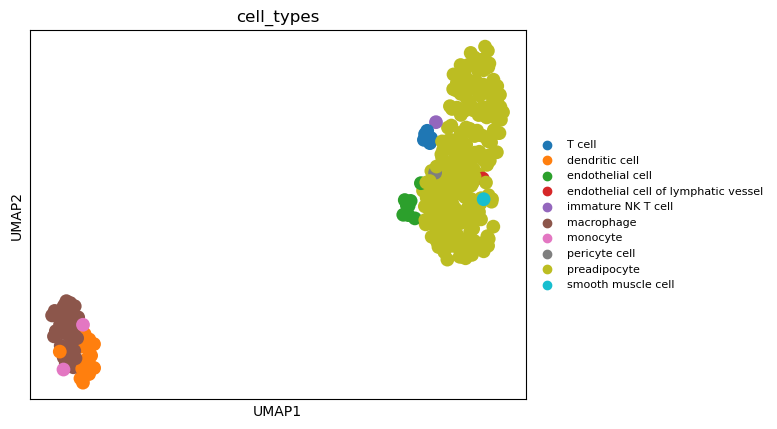

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


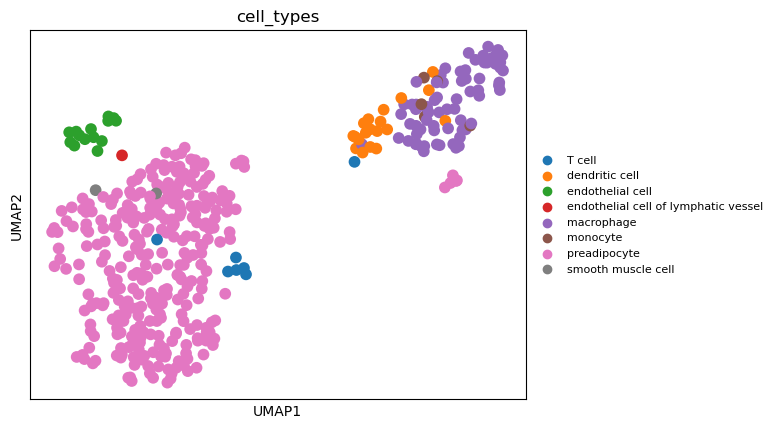

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


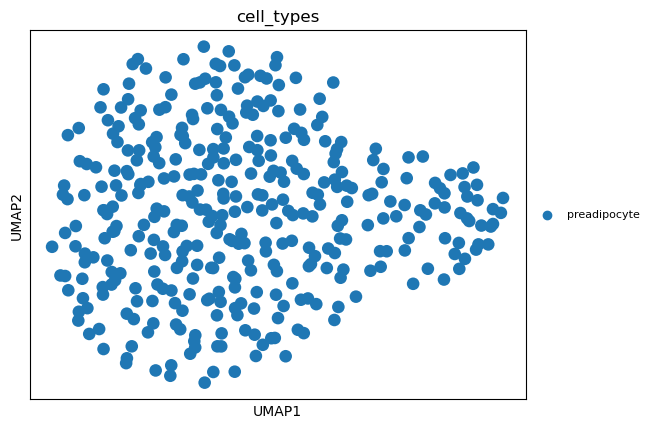

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


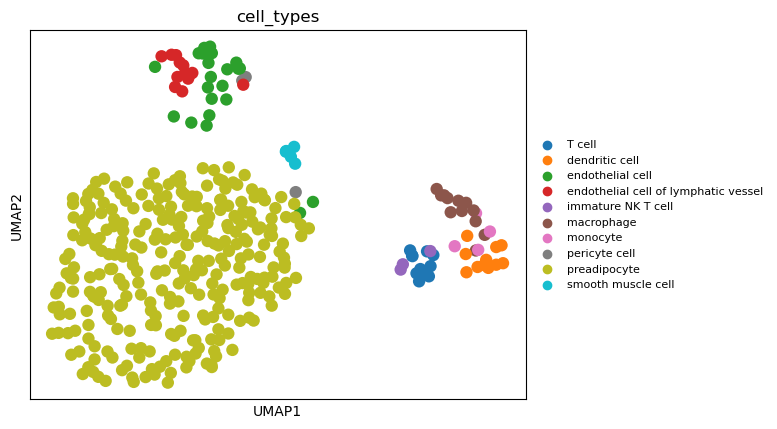

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


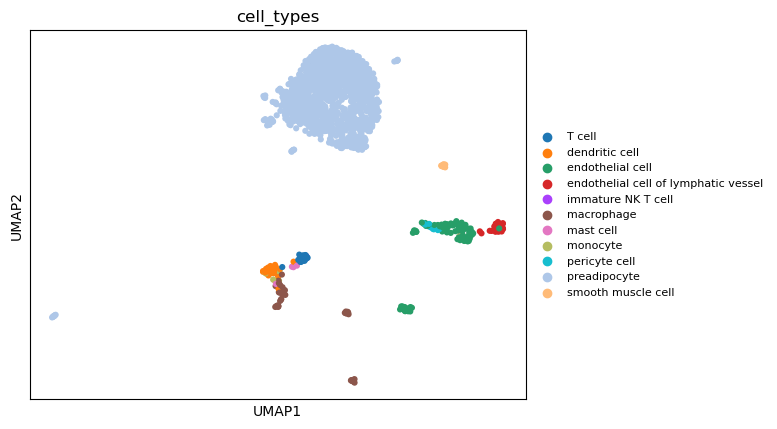

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


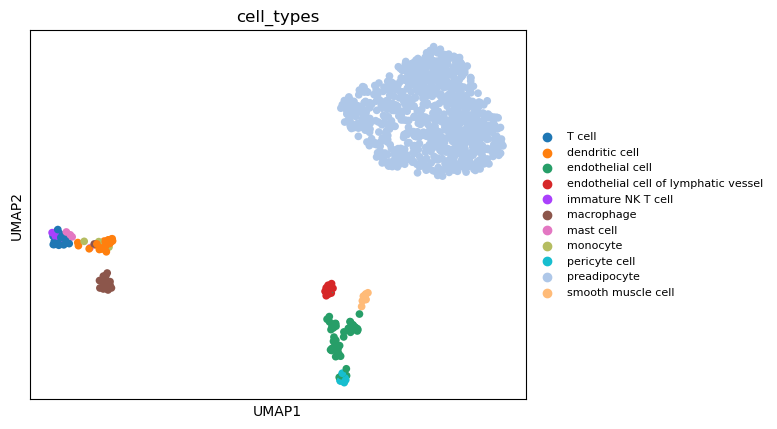

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


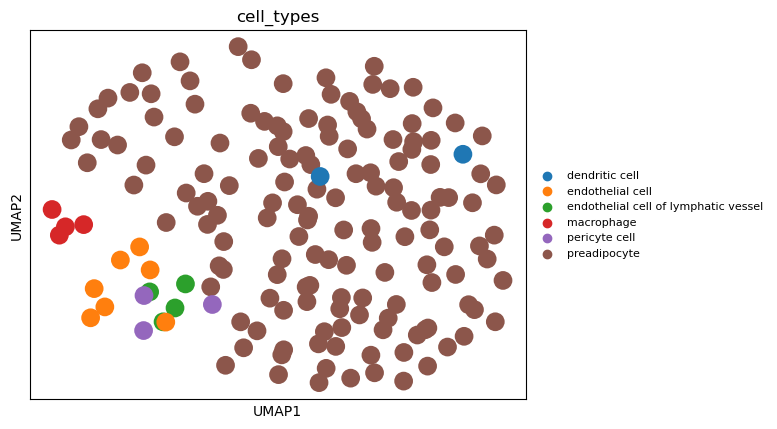

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


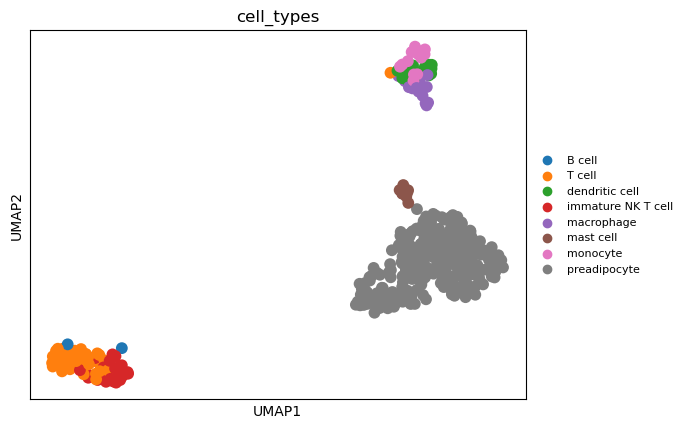

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


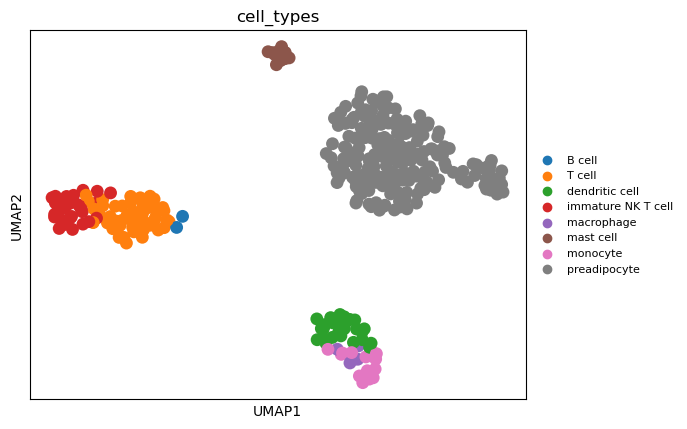

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


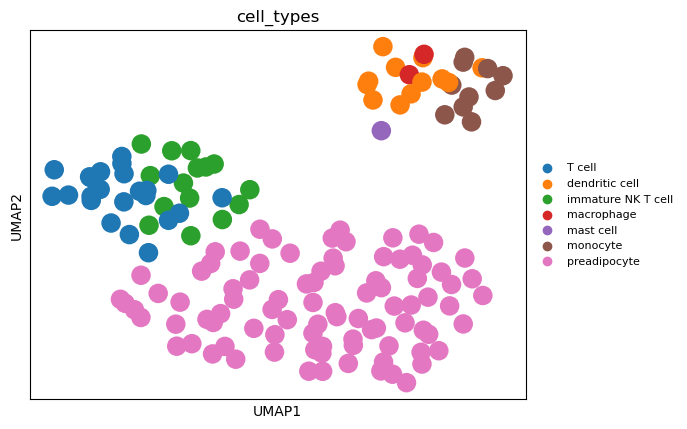

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


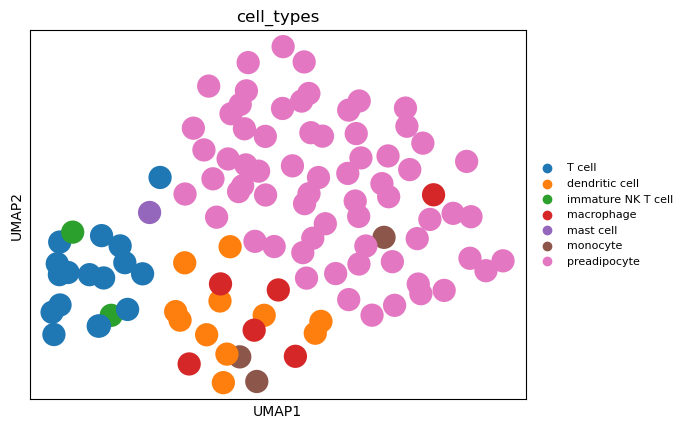

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


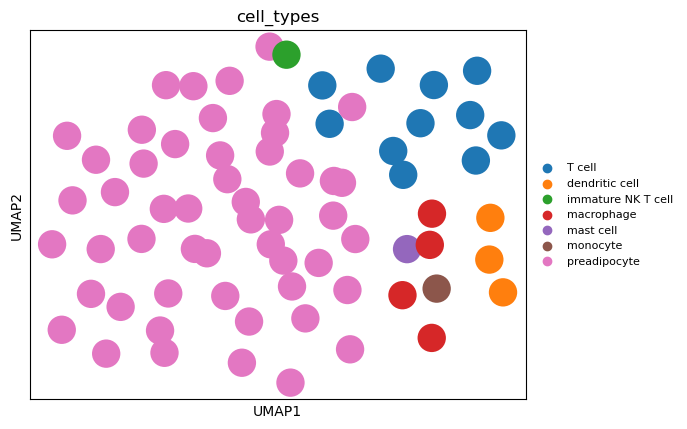

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


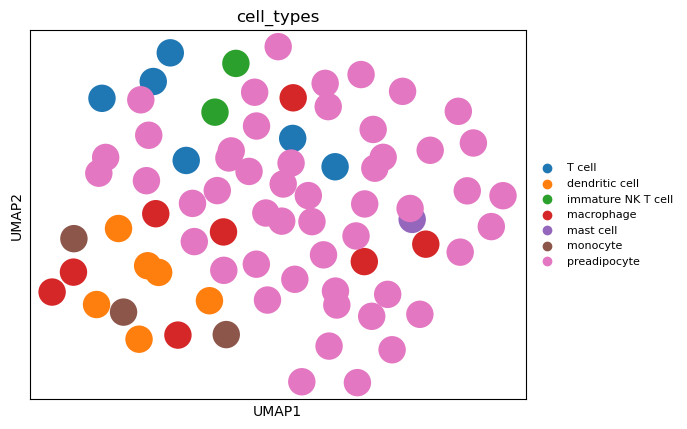

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 29644 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


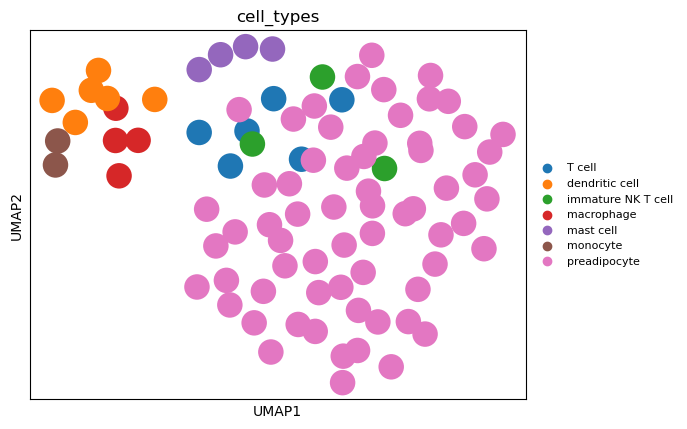

In [32]:
for key in sc_adatas:
    # calculate neighborhood graph
    sc.pp.neighbors(sc_adatas[key])
    # make umap
    sc.tl.umap(sc_adatas[key])
    # plot some markers of the RAW data
    sc.pl.umap(
        sc_adatas[key], color="cell_types", legend_fontsize=8
    )  # calculate neighborhood graph

## Cell type assignment QC:

In [33]:
# and repeat for unnormalized data
for key in sn_adatas:
    sn_adatas_copy[key].obs["cell_types"] = sn_adatas[key].obs["cell_types"]

for key in sc_adatas:
    sc_adatas_copy[key].obs["cell_types"] = sc_adatas[key].obs["cell_types"]

In [34]:
selected_sc, selected_sn = pick_best_datasets(sc_adatas_copy, sn_adatas_copy)

Selected SC datasets: ['Hs_SAT_SVF_235-2A-2', 'Hs_SAT_SVF_235-2B-2']
Selected SN datasets: ['Hs_SAT_254-1', 'Hs_SAT_13-1']


In [35]:
sn_adata_ref = sn_adatas_copy["Hs_SAT_254-1"]
sn_adata_ref.obs["deconvolution"] = "reference"
sn_adata_ref.obs.cell_types.value_counts()

cell_types
fat cell                                4495
preadipocyte                            3428
macrophage                              1768
endothelial cell                        1304
immature NK T cell                       139
smooth muscle cell                       136
T cell                                   132
pericyte cell                            120
mast cell                                 91
dendritic cell                            80
endothelial cell of lymphatic vessel      72
monocyte                                  60
neutrophil                                19
B cell                                     9
Name: count, dtype: int64

In [36]:
sc_adata_pseudos = sc.concat(
    [
        sc_adatas_copy["Hs_SAT_SVF_238-1A-1"],
        sc_adatas_copy["Hs_SAT_SVF_238-2A-1"],
        sc_adatas_copy["Hs_SAT_SVF_238-1B-1"],
        sc_adatas_copy["Hs_SAT_SVF_238-2B-1"],
    ]
)
sc_adata_pseudos.obs["deconvolution"] = "pseudobulks"
sc_adata_pseudos.obs.cell_types.value_counts()

cell_types
preadipocyte                            2671
T cell                                   499
dendritic cell                           300
monocyte                                 194
immature NK T cell                       158
macrophage                               121
endothelial cell                          53
endothelial cell of lymphatic vessel      28
mast cell                                 19
B cell                                    10
smooth muscle cell                         9
pericyte cell                              6
Name: count, dtype: int64

In [37]:
sc_adata_ref = sc.concat(
    [
        sc_adatas_copy["Hs_SAT_SVF_235-1A-1"],
        sc_adatas_copy["Hs_SAT_SVF_235-1A-2"],
        sc_adatas_copy["Hs_SAT_SVF_235-1B-1"],
        sc_adatas_copy["Hs_SAT_SVF_235-2B-1"],
    ]
)
sc_adata_ref.obs["deconvolution"] = "reference"
sc_adata_ref.obs.cell_types.value_counts()

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


cell_types
preadipocyte                            1978
T cell                                   271
dendritic cell                           264
monocyte                                 191
macrophage                               187
immature NK T cell                       141
endothelial cell                          57
endothelial cell of lymphatic vessel      24
B cell                                    11
smooth muscle cell                         3
neutrophil                                 2
pericyte cell                              1
Name: count, dtype: int64

In [38]:
# Concatenate all the remaining AnnData objects.
bulk_comparison1 = sc.concat(sc_adatas_copy)
bulk_comparison2 = sc.concat(sn_adatas_copy)
bulk_comparison = sc.concat([bulk_comparison1, bulk_comparison2])
bulk_comparison.obs["data_type"] = bulk_comparison.obs[
    "library_preparation_protocol__ontology_label"
].replace({"Drop-seq": "single_cell", "10x 3' v3 sequencing": "single_nucleus"})
bulk_comparison.obs.cell_types.value_counts()

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


cell_types
preadipocyte                            35946
fat cell                                14034
endothelial cell                         9460
macrophage                               8961
T cell                                   4020
immature NK T cell                       1949
dendritic cell                           1821
smooth muscle cell                       1637
monocyte                                 1518
mast cell                                 871
endothelial cell of lymphatic vessel      818
pericyte cell                             694
B cell                                    328
neutrophil                                120
stromal cell of endometrium                 3
Name: count, dtype: int64

In [39]:
print(sc_adata_pseudos.obs)
print(sc_adata_ref.obs)
print(sn_adata_ref.obs)

                                              batch  \
Hs_SAT_SVF_238-1A_AAAAATATTCGT  Hs_SAT_SVF_238-1A-1   
Hs_SAT_SVF_238-1A_AAAACAGGCCAG  Hs_SAT_SVF_238-1A-1   
Hs_SAT_SVF_238-1A_AAACAACACTTC  Hs_SAT_SVF_238-1A-1   
Hs_SAT_SVF_238-1A_AAACAGTTCAAA  Hs_SAT_SVF_238-1A-1   
Hs_SAT_SVF_238-1A_AAACCATTGCGA  Hs_SAT_SVF_238-1A-1   
...                                             ...   
Hs_SAT_SVF_238-2B_TTTGTCCTCCAG  Hs_SAT_SVF_238-2B-1   
Hs_SAT_SVF_238-2B_TTTTAATAAGGT  Hs_SAT_SVF_238-2B-1   
Hs_SAT_SVF_238-2B_TTTTCATGACGN  Hs_SAT_SVF_238-2B-1   
Hs_SAT_SVF_238-2B_TTTTTATCATCN  Hs_SAT_SVF_238-2B-1   
Hs_SAT_SVF_238-2B_TTTTTCTAGTTA  Hs_SAT_SVF_238-2B-1   

                                                       cell_id  \
Hs_SAT_SVF_238-1A_AAAAATATTCGT  Hs_SAT_SVF_238-1A_AAAAATATTCGT   
Hs_SAT_SVF_238-1A_AAAACAGGCCAG  Hs_SAT_SVF_238-1A_AAAACAGGCCAG   
Hs_SAT_SVF_238-1A_AAACAACACTTC  Hs_SAT_SVF_238-1A_AAACAACACTTC   
Hs_SAT_SVF_238-1A_AAACAGTTCAAA  Hs_SAT_SVF_238-1A_AAACAGTTCAAA   
Hs_SAT_SV

## Merging Single-cell and Single-Nucleus

In [40]:
# QC:
print("Cells in single-nucleus:")
print(sn_adata_ref.obs.cell_types.unique())
print(sn_adata_ref.obs.cell_types.value_counts())
print("Cells in single-cell ref:")
print(sc_adata_ref.obs.cell_types.unique())
print(sc_adata_ref.obs.cell_types.value_counts())
print("Cells in single-cell pseudos:")
print(sc_adata_pseudos.obs.cell_types.unique())
print(sc_adata_pseudos.obs.cell_types.value_counts())

Cells in single-nucleus:
['fat cell', 'preadipocyte', 'endothelial cell', 'macrophage', 'T cell', ..., 'pericyte cell', 'neutrophil', 'dendritic cell', 'immature NK T cell', 'B cell']
Length: 14
Categories (14, object): ['B cell', 'T cell', 'dendritic cell', 'endothelial cell', ..., 'neutrophil', 'pericyte cell', 'preadipocyte', 'smooth muscle cell']
cell_types
fat cell                                4495
preadipocyte                            3428
macrophage                              1768
endothelial cell                        1304
immature NK T cell                       139
smooth muscle cell                       136
T cell                                   132
pericyte cell                            120
mast cell                                 91
dendritic cell                            80
endothelial cell of lymphatic vessel      72
monocyte                                  60
neutrophil                                19
B cell                                     9
Name: 

In [41]:
# These should not be normalized
print(sn_adata_ref.X.max())
print(sc_adata_ref.X.max())
print(sc_adata_pseudos.X.max())
print(bulk_comparison.X.max())

6313.0
1138.0
1612.0
9832.0


## Final QC

Saving for the real bulks experiment:

In [42]:
sc_adata_ref = sc.concat(
    [
        sc_adatas_copy["Hs_SAT_SVF_235-1A-1"],
        sc_adatas_copy["Hs_SAT_SVF_235-1A-2"],
        sc_adatas_copy["Hs_SAT_SVF_235-1B-1"],
        sc_adatas_copy["Hs_SAT_SVF_235-2B-1"],
    ]
)
sc_adata_ref.obs["deconvolution"] = "reference"
sc_adata_ref.obs.cell_types.value_counts()

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


cell_types
preadipocyte                            1978
T cell                                   271
dendritic cell                           264
monocyte                                 191
macrophage                               187
immature NK T cell                       141
endothelial cell                          57
endothelial cell of lymphatic vessel      24
B cell                                    11
smooth muscle cell                         3
neutrophil                                 2
pericyte cell                              1
Name: count, dtype: int64

In [43]:
path_real = f"{os.getcwd()}/../data/Real_ADP/"  # Path to original data.
adata_path = os.path.join(path_real, f"sn_sc_Real_ADP_allcells.h5ad")
adata_path = Path(adata_path)
bulk_comparison.write_h5ad(adata_path)

And the holding-out experiment.

In [44]:
print(sc_adata_ref.obs.sex.value_counts())

print(sc_adata_pseudos.obs.sex.value_counts())

print(sn_adata_ref.obs.sex.value_counts())

sex
female    3130
Name: count, dtype: int64
sex
female    4068
Name: count, dtype: int64
sex
female    11853
Name: count, dtype: int64


In [ ]:
maps = {
    "dendritic cell": "Dendritic Cells",
    "endothelial cell": "Endothelial Cells",
    "immature NK T cell": "Immature NK T Cells",
    "monocyte": "Monocytes",
    "preadipocyte": "Preadipocytes",
    "T cell": "T Cells",
    "Endothelial cell": "Endothelial Cells",
    "T cell": "T Cells",
    "Macrophage": "Macrophages",
    "macrophage": "Macrophages",
    "Hepatocyte": "Hepatocytes",
    "Epithelial cell": "Epithelial Cells",
}
sn_adata_ref.obs.cell_types = sn_adata_ref.obs.cell_types.replace(maps)
sc_adata_ref.obs.cell_types = sc_adata_ref.obs.cell_types.replace(maps)
sc_adata_pseudos.obs.cell_types = sc_adata_pseudos.obs.cell_types.replace(maps)

In [45]:
# Count occurrences of each cell type in all three datasets
min_cells_per_type = 50
sc_ref_counts = sc_adata_ref.obs["cell_types"].value_counts()
sn_counts = sn_adata_ref.obs["cell_types"].value_counts()
sc_pseudos_counts = sc_adata_pseudos.obs["cell_types"].value_counts()

# Align counts so that all datasets have the same cell types
sc_ref_counts, sn_counts = sc_ref_counts.align(sn_counts, fill_value=0)
sn_counts, sc_pseudos_counts = sn_counts.align(sc_pseudos_counts, fill_value=0)

# Find common cell types across all three datasets
common_cell_types = sc_ref_counts.index.intersection(sn_counts.index).intersection(
    sc_pseudos_counts.index
)

# Keep only those cell types that meet the min_cells_per_type threshold in all datasets
valid_cell_types = common_cell_types[
    (sc_ref_counts[common_cell_types] >= min_cells_per_type)
    & (sn_counts[common_cell_types] >= min_cells_per_type)
    & (sc_pseudos_counts[common_cell_types] >= min_cells_per_type)
].tolist()

print("Valid cells found:", valid_cell_types)
print(sc_ref_counts[common_cell_types])
print(sc_pseudos_counts[common_cell_types])
print(sn_counts[common_cell_types])
assert len(valid_cell_types) > 3, "Less than 4 cell types found"

Valid cells found: ['T cell', 'dendritic cell', 'endothelial cell', 'immature NK T cell', 'macrophage', 'monocyte', 'preadipocyte']
cell_types
B cell                                    11.0
T cell                                   271.0
dendritic cell                           264.0
endothelial cell                          57.0
endothelial cell of lymphatic vessel      24.0
fat cell                                   0.0
immature NK T cell                       141.0
macrophage                               187.0
mast cell                                  0.0
monocyte                                 191.0
neutrophil                                 2.0
pericyte cell                              1.0
preadipocyte                            1978.0
smooth muscle cell                         3.0
Name: count, dtype: float64
cell_types
B cell                                    10.0
T cell                                   499.0
dendritic cell                           300.0
endothelial cell   

In [46]:
print(sc_adata_ref.obs.cell_types.value_counts())
print(sc_adata_pseudos.obs.cell_types.value_counts())
print(sn_adata_ref.obs.cell_types.value_counts())

cell_types
preadipocyte                            1978
T cell                                   271
dendritic cell                           264
monocyte                                 191
macrophage                               187
immature NK T cell                       141
endothelial cell                          57
endothelial cell of lymphatic vessel      24
B cell                                    11
smooth muscle cell                         3
neutrophil                                 2
pericyte cell                              1
Name: count, dtype: int64
cell_types
preadipocyte                            2671
T cell                                   499
dendritic cell                           300
monocyte                                 194
immature NK T cell                       158
macrophage                               121
endothelial cell                          53
endothelial cell of lymphatic vessel      28
mast cell                                 19
B cell 

## Saving dataset

In [47]:
all_adatas = sc.concat([sc_adata_ref, sc_adata_pseudos, sn_adata_ref])

/projects/aivich@xsede.org/.conda/envs/env_deconv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [48]:
# saving for later adata as anndata without normalization
adata_path = os.path.join(path, f"sc_sn_{res_name}_processed.h5ad")
adata_path = Path(adata_path)
all_adatas.write_h5ad(adata_path)